# Exercise 1: Linear Image Classifier

In this exercise you will implement a linear image classifier while getting familiar with `numpy` and the benefits of vectorized operations in Python. This exercise has 2 parts:

1. Implementing loss functions, calculating gradients and implementing gradient descent.
2. Training and evaluating several classifiers.

## Submission guidelines:

Your submission should only include this jupyter notebook named HW1_ID.ipynb.

## Read the following instructions carefully:

1. This jupyter notebook contains all the step by step instructions needed for this exercise.
2. Write **efficient vectorized** code whenever instructed. 
3. You are responsible for the correctness of your code and should add as many tests as you see fit. Tests will not be graded nor checked.
4. Do not change the functions we provided you. 
4. Write your functions in the instructed python modules only. All the logic you write is imported and used using this jupyter notebook. You are allowed to add functions as long as they are located in the python modules and are imported properly.
5. You are allowed to use functions and methods from the [Python Standard Library](https://docs.python.org/3/library/) and [numpy](https://www.numpy.org/devdocs/reference/) only. Any other imports are forbidden.
6. Your code must run without errors.
7. Answers to qualitative questions should be written in **markdown** cells (with $\LaTeX$ support).
8. **TIP: When there is a TODO before a missing code segment (or function), you can continue without implementing it right away; you will be referred to the missing segment later in the exercise.**

Q: What files do we need to upload to moodle?

A: You should fill in the missing parts in this Jupyter notebook and then submit it via moodle (without any additional files).

Q: How do I make sure everything works before I submit?

A: You should restart your kernel and rerun all cells. Make sure you get the desired output and that you meet exercise requirements. **This is an important step. You should include your desired outputs in the output cells to make your code easier to understand.**

#### Imports

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
import numpy as np
import os
import sys
import urllib.request
import tarfile
import zipfile
from random import randrange
from functools import partial
import itertools
import time

# specify the way plots behave in jupyter notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (5.0, 3.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Data preprocessing


## Data download and processing Helper Code

In [2]:
def maybe_download_and_extract(url, download_dir):
    """
    Download and extract the data if it doesn't already exist.
    Assumes the url is a tar-ball file.
    :param url:
        Internet URL for the tar-file to download.
        Example: "https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz"
    :param download_dir:
        Directory where the downloaded file is saved.
        Example: "data/CIFAR-10/"
    :return:
        Nothing.
    """

    # Filename for saving the file downloaded from the internet.
    # Use the filename from the URL and add it to the download_dir.
    filename = url.split('/')[-1]
    file_path = os.path.join(download_dir, filename)

    # Check if the file already exists.
    # If it exists then we assume it has also been extracted,
    # otherwise we need to download and extract it now.
    if not os.path.exists(file_path):
        # Check if the download directory exists, otherwise create it.
        if not os.path.exists(download_dir):
            os.makedirs(download_dir)

        # Download the file from the internet.
        print("Downloading, This might take several minutes.")
        last_update_time = time.time()
        file_path, _ = urllib.request.urlretrieve(url=url,
                                                  filename=file_path)

        print()
        print("Download finished. Extracting files.")

        if file_path.endswith(".zip"):
            # Unpack the zip-file.
            zipfile.ZipFile(file=file_path, mode="r").extractall(download_dir)
        elif file_path.endswith((".tar.gz", ".tgz")):
            # Unpack the tar-ball.
            tarfile.open(name=file_path, mode="r:gz").extractall(download_dir)

        print("Done.")
    else:
        print("Data has apparently already been downloaded and unpacked.")
        print("If not, delete the dataset folder and try again.")

def load_CIFAR_batch(filename):
    ''' load single batch of cifar '''
    with open(filename, 'rb') as f:
        datadict = pickle.load(f, encoding = 'latin1')
        X = datadict['data']
        Y = datadict['labels']
        X = X.reshape(10000, 3, 32, 32).transpose(0, 2, 3, 1).astype("float")
        Y = np.array(Y)
        return X, Y

def load(ROOT):
    ''' load all of cifar '''
    xs = []
    ys = []
    for b in range(1, 6):
        f = os.path.join(ROOT, 'data_batch_%d' % (b, ))
        X, Y = load_CIFAR_batch(f)
        xs.append(X)
        ys.append(Y)
    Xtr = np.concatenate(xs)
    Ytr = np.concatenate(ys)
    del X, Y
    Xte, Yte = load_CIFAR_batch(os.path.join(ROOT, 'test_batch'))
    return Xtr, Ytr, Xte, Yte

## Data Download

The next cell will download and extract CIFAR-10 into `datasets/cifar10/`. The CIFAR-10 dataset consists of 60,000 32x32 color images in 10 classes, with 6,000 images per class. There are 50,000 training images and 10,000 test images. The dataset is divided into five training batches and one test batch, each with 10,000 images. The test batch contains exactly 1,000 randomly-selected images from each class.


In [3]:
# this cell will download the data if it does not exists
URL = "https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz"
PATH = 'datasets/cifar10/' # the script will create required directories
maybe_download_and_extract(URL, PATH) 

Downloading, This might take several minutes.

Download finished. Extracting files.
Done.


## Data Preprocessing Part 1

We have included several image processing functions. Notice the following in particular: we created an additional validation dataset you need to use for hyperparameter optimization.

In [4]:
CIFAR10_PATH = os.path.join(PATH, 'cifar-10-batches-py')
X_train, y_train, X_test, y_test = load(CIFAR10_PATH) # load the entire data

# taking only two classes from the dataset
X_train = X_train[np.logical_or(y_train == 0, y_train == 1)]
y_train = y_train[np.logical_or(y_train == 0, y_train == 1)]
X_test = X_test[np.logical_or(y_test == 0, y_test == 1)]
y_test = y_test[np.logical_or(y_test == 0, y_test == 1)]

# define a splitting for the data
num_training = 10000
num_validation = 1000
num_testing = 1000

mask = range(num_training)
X_train = X_train[mask]
y_train = y_train[mask]
# portion from the test dataset a validation dataset for hyperparameter optimization
mask = range(num_validation)
X_val = X_test[mask]
y_val = y_test[mask]
# test dataset, without overlap with train/validation
mask = range(num_validation, num_validation+num_testing)
X_test = X_test[mask]
y_test = y_test[mask]

# float64
X_train = X_train.astype(np.float64)
X_val = X_val.astype(np.float64)
X_test = X_test.astype(np.float64)

classes = ('plane', 'car')

      car	      car	    plane	    plane


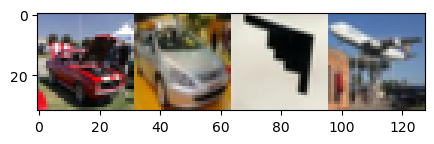

In [5]:
def get_batch(X, y, n=1000):
    rand_items = np.random.randint(0, X.shape[0], size=n)
    images = X[rand_items]
    labels = y[rand_items]
    return images, labels

def make_random_grid(x, y, n=4, convert_to_image=True, random_flag=True):
    if random_flag:
        rand_items = np.random.randint(0, x.shape[0], size=n)
    else:
        rand_items = np.arange(0, x.shape[0])
    images = x[rand_items]
    labels = y[rand_items]
    if convert_to_image:
        grid = np.hstack(np.array([np.asarray((vec_2_img(i) + mean_image), dtype=np.int64) for i in images]))
    else:
        grid = np.hstack(np.array([np.asarray(i, dtype=np.int64) for i in images]))
    print('\t'.join('%9s' % classes[labels[j]] for j in range(n)))
    return grid

def vec_2_img(x):
    x = np.reshape(x[:-1], (32, 32, 3))
    return x

X_batch, y_batch = get_batch(X_test, y_test, 100)
plt.imshow(make_random_grid(X_batch, y_batch, n=4, convert_to_image=False));

## Data Preprocessing Part 2

We have included several image processing functions. Notice the following in particular: We subtracted the mean from all the images in order to ignore illumination conditions while keeping the content of the image. Next, we flattened the images from a tensor of shape (32x32x3) to a vector with 3072 features (pixel values) so we would be able to use a simple matrix multiplication. Finally, we concatenated each image vector with an additional feature to account for the bias. This is known as the bias trick. 

Make sure you understand this image processing pipeline before diving into the rest of the code.

In [6]:
# Final data preprocessing
# subtract the mean from all the images in the batch
mean_image = np.mean(X_train, axis=0)
X_train -= mean_image
X_val -= mean_image
X_test -= mean_image

# flatten all the images in the batch (make sure you understand why this is needed)
X_train = np.reshape(X_train, newshape=(X_train.shape[0], -1))
X_val = np.reshape(X_val, newshape=(X_val.shape[0], -1)) 
X_test = np.reshape(X_test, newshape=(X_test.shape[0], -1)) 

# add a bias term to all images in the batch
X_train = np.hstack([X_train, np.ones((X_train.shape[0], 1))]) 
X_val = np.hstack([X_val, np.ones((X_val.shape[0], 1))]) 
X_test = np.hstack([X_test, np.ones((X_test.shape[0], 1))]) 

print(f"Shape of Training Set: {X_train.shape}")
print(f"Shape of Validation Set: {X_val.shape}")
print(f"Shape of Test Set: {X_test.shape}")

Shape of Training Set: (10000, 3073)
Shape of Validation Set: (1000, 3073)
Shape of Test Set: (1000, 3073)


# Linear classifier: mapping images to scores

During this exercise, we will maintain a python class with basic functionality (such as training the model). the linear classifiers we will build (perceptron, logistic regression) will inherit some functionality from that class and will change several functions (such as the loss function, for example). Read the code in the next cell and make sure you understand it. You might also find this [short classes in python tutorial](https://www.hackerearth.com/practice/python/object-oriented-programming/classes-and-objects-i/tutorial/) useful.


In [7]:
class LinearClassifier(object):
    def __init__(self, X, y):
        """
        Class constructor. Use this method to initiate the parameters of
        your model (W)
        *** Subclasses will override this. ***

        Inputs:
        - X: array of data
        - y: 1-dimensional array of length N with binary labels

        This function has no return value

        """
        pass

    def predict(self, X):
        """
        Use the weight of the classifier to predict a label. 
        *** Subclasses will override this. ***

        Input: 2D array of size (num_instances, num_features).
        Output: 1D array of class predictions (num_instances, 1). 
        """
        pass

    def calc_accuracy(self, X, y):
        """
        Calculate the accuracy on a dataset as the percentage of instances 
        that are classified correctly. 

        Inputs:
        - W: array of weights
        - X: array of data
        - y: 1-dimensional array of length N with binary labels
        Returns:
        - accuracy as a single float
        """

        accuracy = 0.0
        ###########################################################################
        # TODO: Implement this method.                                            #
        ###########################################################################
        #                          START OF YOUR CODE                             #
        ###########################################################################
        success = 0
        predictions = self.predict(X)
        for i in range(X.shape[0]):
            success += bool(y[i] == predictions[i])     
        ###########################################################################
        #                           END OF YOUR CODE                              #
        ###########################################################################
        accuracy = (success / X.shape[0]) * 100
        return accuracy


    def train(self, X, y, learning_rate=1e-3, num_iters=100, batch_size=200, verbose=False):
        #########################################################################
        # TODO:                                                                 #
        # Sample batch_size elements from the training data and their           #
        # corresponding labels to use in every iteration.                       #
        # Store the data in X_batch and their corresponding labels in           #
        # y_batch                                                               #
        #                                                                       #
        # Hint: Use np.random.choice to generate indices. Sampling with         #
        # replacement is faster than sampling without replacement.              #
        #                                                                       #
        # Next, calculate the loss and gradient and update the weights using    #
        # the learning rate. Use the loss_history array to save the loss on     #
        # iteration to visualize the loss.                                      #
        #########################################################################
        num_instances = X.shape[0]
        
        num_classes = np.max(y) + 1 # assume y takes values 0...K-1 where K is number of classes
        if self.W is None:
            self.W = 0.001 * np.random.randn(dim, num_classes)
        
        loss_history = []
        loss = 0.0
        for i in range(num_iters):
            X_batch = None
            y_batch = None
            ###########################################################################
            # Create X_batch and y_batch. Call the loss method to get the loss value  # 
            # and grad (the loss function is being override, see the loss             #
            # function return values).                                                #
            # Finally, append each of the loss values created in each iteration       #
            # to loss_history.                                                        #
            ###########################################################################
            #                          START OF YOUR CODE                             #
            ###########################################################################
            
            rnd_indexes = np.random.choice(num_instances, batch_size)
            X_batch = X[rnd_indexes, :]
            y_batch = y[rnd_indexes]
            loss, grad = self.loss(X_batch, y_batch)
            loss_history.append(loss)
            
            ###########################################################################
            #                           END OF YOUR CODE                              #
            ###########################################################################
            # TODO:                                                                   #
            # Perform parameter update                                                #
            # Update the weights using the gradient and the learning rate.            #
            ###########################################################################
            #                          START OF YOUR CODE                             #                                                         #
            ###########################################################################
            
            self.W -= grad * learning_rate
            
            ###########################################################################
            #                       END OF YOUR CODE                                  #
            ###########################################################################

            if verbose and i % 100 == 0:
                print ('iteration %d / %d: loss %f' % (i, num_iters, loss))

        return loss_history


    def loss(self, X, y):
        """
        Compute the loss function and its derivative. 
        Subclasses will override this.
        Inputs:
        - X_batch: A numpy array of shape (N, D) containing a minibatch of N
          data points; each point has dimension D.
        - y_batch: A numpy array of shape (N,) containing labels for the minibatch.
        Returns: A tuple containing:
        - loss as a single float
        - gradient with respect to self.W; an array of the same shape as W
        """
        pass

## Linear perceptron
Our first linear classifier will include a linear function that maps images to scores:

$$
f(x_i; W, b) = W\cdot x_i + b
$$

As you learned in class, this linear classifier takes an input image $x_i$ and outputs a class score. Your goal is to **learn** the parameters $W$ and $b$ to best classify the images according to the provided labels. The linear perceptron is set up so that the perceptron learn to map the correct class for each image such that it will have a score higher than the incorrect class.

Read the next code cell. The constructor of the `LinearPerceptron` class takes as input the dataset and labels in order to create appropriate parameters. Notice we are using the bias trick and only use the matrix `w` for convenience. Since we already have a (random) model, we can start predicting classes on images. Complete the method `predict` in the `LinearPerceptron` class. **(5 Points)**

In [8]:
class LinearPerceptron(LinearClassifier):
    # Classifier that uses Perceptron loss

    def __init__(self, X, y):
        ###########################################################################
        # Initiate the parameters of your model.                                  #
        # You can assume y takes values 0...K-1 where K is number of classes      #
        ###########################################################################
        #                          START OF YOUR CODE                             # 
        ###########################################################################
        features = X.shape[1]
        self.W = np.random.randn(features, 2) * 0.0001
        ###########################################################################
        #                           END OF YOUR CODE                              #
        ###########################################################################


    def predict(self, X):
        y_pred = None
        ###########################################################################
        # Implement this method.                                                  #
        ###########################################################################
        #                          START OF YOUR CODE                             # 
        ###########################################################################
        y_pred = X.dot(self.W)
        y_pred = np.argmax(y_pred, axis=1)
        ###########################################################################
        #                           END OF YOUR CODE                              #
        ###########################################################################
        return y_pred


    def loss(self, X_batch, y_batch):
        # perceptron_loss_vectorized will be implemented later
        return perceptron_loss_vectorized(self.W, X_batch, y_batch)

In [9]:
classifier = LinearPerceptron(X_train, y_train)
y_pred = classifier.predict(X_test)

    plane	    plane	    plane	    plane


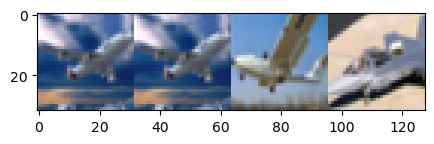

In [10]:
X_batch, y_batch = get_batch(X_train, y_train, 4)
plt.imshow(make_random_grid(X_batch, y_batch, convert_to_image=True))
plt.show()

In [11]:
# predictions
print(' '.join('%9s' % classes[y_pred[j]] for j in range(4)))

      car       car     plane     plane


## Evaluation 

Complete the class method `calc_accuracy`. **(5 Points)**

In [12]:
print("model accuracy: ", classifier.calc_accuracy(X_train, y_train))

model accuracy:  47.71


**Explain why the accuracy on the training dataset is around 50% (remember, the model is not trained yet). **(5 Points)**** 

Answer: 

## Perceptron loss

Your code for this section will all be written in the next cell. In this section, we write and test code outside the classes for convenience. Notice the loss method for each class is just a call for the loss function written in the next cell. Once you are finished with implementation, everything should work.

First, complete the function `perceptron_loss_naive`. This function takes as input the weights, data, labels and outputs the calculated loss as a single number and the gradients with respect to W.  **(15 points)**

In [13]:
def perceptron_loss_naive(W, X, y):
    """
    Structured perceptron loss function, naive implementation (with loops)
    Inputs:
    - W: array of weights
    - X: array of data
    - y: 1-dimensional array of length N with labels 0...K-1, for K classes
    Returns:
    a tuple of:
    - loss as single float
    - gradient with respect to weights W; an array of same shape as W
    """
    loss = 0.0
    dW = np.zeros(W.shape) # initialize the gradient as zero
    #############################################################################
    # Compute the perceptron loss as learned in class. Start by iterating over  #
    # over all instances and calculate the score and true score for each.       #
    # Now, for each class determine if the prediction is correct and update the #
    # loss over all mistakes.                                                   #
    # Compute the gradient of the loss function and store it as dW.             #
    # Rather that first computing the loss and then computing the derivative,   #
    # it may be simpler to compute the derivative at the same time that the     #
    # loss is being computed.                                                   #
    #############################################################################

    
    
    
    
    
    
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################
    return loss, dW

In [14]:
W = np.random.randn(3073, 1) * 0.0001

In [15]:
%%time
loss_naive, _ = perceptron_loss_naive(W, X_val, y_val)
print ('loss: %f' % (loss_naive))

loss: 0.000000
CPU times: user 632 µs, sys: 933 µs, total: 1.56 ms
Wall time: 796 µs


Once your code works, complete the function `perceptron_loss_vectorized` and compare the results of the two functions using the cell below. **(15 points)**

In [77]:
def perceptron_loss_vectorized(W, X, y):
    """
    Vectorized version of perceptron_loss_naive. instead of loops, should use 
    numpy vectorization.

    Inputs and outputs are the same as perceptron_loss_naive.
    """
    loss = 0.0
    dW = np.zeros(W.shape) # initialize the gradient as zero
    #############################################################################
    # Implement a vectorized version of the perceptron loss, storing the       #
    # result in loss and the gradient in dW                                     #
    #############################################################################
    Z = X.dot(W)
    
    example_count = X.shape[0]
    
    correct_score = scores[list(range(example_count)),y]  #### ???

    correct_score = correct_score.reshape(example_count, -1)
    scores += 1 - correct_score


    scores[list(range(example_count)), y] = 0

    loss = np.sum(np.fmax(scores, 0)) / example_count
    
    # Masking into right dim
    mask = np.zeros(scores.shape)
    mask[scores > 0] = 1
    mask[np.arange(example_count), y] = -np.sum(mask, axis=1)
    dW = X.T.dot(mask)
    dW /= example_count
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################
    return loss, dW

In [78]:
%%time
loss_vectorized, _ = perceptron_loss_vectorized(W, X_val, y_val)
print ('loss: %f' % (loss_vectorized))

(3073, 1) (1000, 3073) (1000,)
[[-7.60760543e-02]
 [-1.31365743e-01]
 [-4.53376709e-01]
 [ 1.27738265e-01]
 [ 3.26519499e-01]
 [-6.46409489e-02]
 [ 1.19440582e-01]
 [ 3.81593092e-01]
 [ 3.60072189e-01]
 [-5.26850088e-01]
 [ 2.27226988e-01]
 [-7.49855843e-01]
 [-2.31896075e-01]
 [ 3.04668066e-01]
 [-3.11985883e-02]
 [ 7.29152103e-02]
 [-2.55699343e-01]
 [ 1.02950801e-01]
 [-2.31773222e-01]
 [-9.91765630e-02]
 [-1.08774353e-01]
 [-8.78088995e-02]
 [-1.46899725e-01]
 [ 4.51621386e-01]
 [ 9.39944646e-02]
 [-8.24804715e-02]
 [-1.24329035e-01]
 [ 1.01015120e-01]
 [ 1.24162375e-01]
 [-3.59684841e-01]
 [ 2.90462785e-01]
 [ 5.16260939e-01]
 [-9.50420883e-01]
 [-4.99533168e-01]
 [-2.93695305e-01]
 [ 1.90513575e-01]
 [-2.22010926e-01]
 [ 2.66929702e-01]
 [ 1.20148764e-01]
 [-5.54737382e-03]
 [-3.88184693e-01]
 [-3.09039974e-01]
 [-1.73661205e-01]
 [-1.54023462e-01]
 [-3.41535216e-01]
 [-4.07775263e-01]
 [-1.53101639e-01]
 [ 5.57636543e-02]
 [ 1.45829002e-01]
 [ 5.93550168e-02]
 [-6.78224478e-02]


IndexError: index 1 is out of bounds for axis 1 with size 1

You might not see big changes in time due to other computing factors. In big enough datasets it would be crucial to use the vectorized version.

We have obtained an efficient function for loss and gradient calculation and we can now train our network. Complete the function `train` in the `LinearClassifier` class. (**15 points**)

In [79]:
%%time
perceptron = LinearPerceptron(X_train, y_train)
loss_history = perceptron.train(X_train, y_train, learning_rate=1e-7, 
                                num_iters=1500, verbose=True)

(3073, 2) (200, 3073) (200,)
[[-0.12163905 -0.34646922]
 [-0.02916868 -0.49039484]
 [-0.13882295 -0.24971083]
 [ 0.23911654 -0.10940476]
 [ 0.06018597 -0.03926173]
 [-0.02050771 -0.3529845 ]
 [ 0.03493172  0.29258111]
 [ 0.09659544 -0.11232209]
 [ 0.02615184 -0.39189356]
 [ 0.10011924 -0.47947957]
 [-0.27303018  0.021863  ]
 [ 0.04791831 -0.19623084]
 [-0.16482447  0.20598408]
 [ 0.15263744  0.59485464]
 [ 0.3522076   0.18633776]
 [-0.27523451 -0.13828591]
 [-0.10145327 -0.31211324]
 [ 0.26289712  0.27550326]
 [ 0.41798375 -0.01566137]
 [ 0.34638993 -0.68049782]
 [-0.01697679  0.26964549]
 [ 0.01892461  0.05693709]
 [-0.19975029 -0.3570044 ]
 [ 0.16009307  0.3481886 ]
 [ 0.11054929 -0.1659074 ]
 [-0.13529541  0.00370326]
 [-0.10855737  0.52866326]
 [-0.15842861 -0.71791994]
 [-0.1095474  -0.12493487]
 [ 0.01114114  0.26456863]
 [ 0.06915706  0.13182828]
 [ 0.45299744 -0.38592074]
 [ 0.26139957  0.75765554]
 [-0.12319813  0.22224474]
 [-0.03033072  0.56933487]
 [ 0.04147851  0.11361617]

(3073, 2) (200, 3073) (200,)
[[-1.69754568e-01  1.80155945e-01]
 [-7.23107494e-01  1.58642620e+00]
 [-6.72925105e-01  9.68751423e-01]
 [ 1.04187091e+00 -1.30992784e+00]
 [ 5.67592714e-01 -7.04981528e-01]
 [-6.68648611e-01  1.01375477e+00]
 [-4.79133403e-01  4.71415514e-01]
 [-2.24372808e-01  2.36183089e-01]
 [ 4.09030355e-01 -1.27357359e+00]
 [-4.99544141e-01  4.98727850e-01]
 [ 3.17780706e-01 -2.52050051e-01]
 [-8.30054445e-01  1.09367066e+00]
 [-7.42945436e-01  1.18491515e+00]
 [-2.34749001e-01  8.73775149e-01]
 [ 8.50375259e-02  4.37714207e-02]
 [ 7.54322759e-01 -1.04520620e+00]
 [-6.93192260e-01  1.13876198e+00]
 [-3.05255352e-01  1.33690241e-01]
 [ 3.29745392e-01 -2.75539228e-01]
 [-1.05613551e+00  4.91669065e-01]
 [-2.08439187e-01  3.27538912e-01]
 [-1.25691202e+00  1.55996812e+00]
 [-5.50821507e-01  7.50285997e-01]
 [ 7.91371911e-01 -4.68377565e-01]
 [ 3.29844654e-01 -6.58681412e-03]
 [ 6.52987008e-01 -1.34517568e+00]
 [-5.83585886e-01  1.30103258e+00]
 [-1.43409772e+00  1.38488

(3073, 2) (200, 3073) (200,)
[[-0.17839314 -0.18735477]
 [-0.4403608   0.92602921]
 [ 0.12825073  0.18138115]
 [ 0.59540473 -0.9479007 ]
 [-0.13828132 -0.18918333]
 [ 0.07560038 -0.19340638]
 [-1.06738892  1.01509408]
 [ 0.66802507 -0.32688602]
 [ 0.83051025 -0.77857291]
 [-0.19232437  0.04917813]
 [-0.30340228  0.58652452]
 [ 0.84676586 -0.61084976]
 [-0.64389306  0.43598431]
 [-0.06545199 -0.01549371]
 [-0.38363941  0.68674731]
 [ 1.30669566 -2.04993437]
 [-0.68787496  0.55603233]
 [-1.47061634  2.10726429]
 [ 0.09496395 -0.13814706]
 [-1.23073619  1.4340357 ]
 [-0.41662753  0.7144848 ]
 [-0.45362619  0.63952985]
 [-0.58568416  0.38836334]
 [-0.14488572  0.14151755]
 [ 0.16977582 -0.21493979]
 [ 0.76088407 -1.34799932]
 [-0.31034537 -0.08198586]
 [-0.0587319  -0.1148047 ]
 [ 0.55887193 -0.46833252]
 [ 0.35699795 -0.47668602]
 [-0.12838986 -0.23451502]
 [ 0.04592418  0.08402445]
 [-0.40562548  0.42654971]
 [-0.38916283  0.92925426]
 [-0.56933537  0.3837347 ]
 [ 0.53812265 -1.45381526]

(3073, 2) (200, 3073) (200,)
[[-0.37184842  0.67201313]
 [-0.92593409  0.8647389 ]
 [ 0.53748526 -0.86759371]
 [ 0.38404371  0.32002395]
 [ 0.96118457 -1.20796816]
 [ 0.05302531 -0.14076019]
 [ 0.77069391 -1.66395214]
 [ 0.2076994  -0.34291223]
 [-0.41342126  0.28708742]
 [-0.13141879 -0.60548784]
 [-0.66462803  1.32343785]
 [-0.77752901 -0.24855547]
 [ 0.78676939 -1.06920042]
 [ 0.48775294 -0.12491289]
 [ 0.66769348 -0.87055312]
 [ 0.36689224 -0.49008063]
 [ 0.10757331  0.56661134]
 [ 0.58910998 -0.07429311]
 [-0.06321504  0.18604346]
 [-0.05624665 -0.10659497]
 [ 0.29829613 -0.14563322]
 [ 0.16112578 -0.15081221]
 [-1.03997458  1.08998041]
 [ 0.48574721 -0.66480221]
 [-0.55995497  0.43555016]
 [-0.20557883 -0.01171274]
 [ 0.3856459  -0.16676176]
 [-0.61590768  1.15754135]
 [-1.23196818  1.91455042]
 [ 1.32759011 -2.12642377]
 [-0.24321404  0.1552193 ]
 [-0.11843172 -0.53415337]
 [ 0.03117866 -0.5325881 ]
 [-0.62091291  0.9287315 ]
 [-0.5821412   0.37563485]
 [-0.79458133  1.27056274]

(3073, 2) (200, 3073) (200,)
[[ 7.73387969e-01 -6.83082427e-01]
 [-2.73059620e-01  1.85064881e-01]
 [-1.06636082e+00  1.58706704e+00]
 [ 7.74946822e-01 -1.18278988e+00]
 [ 1.51117666e-01 -7.65300197e-01]
 [ 5.35379420e-01 -5.53932567e-01]
 [ 1.04445742e+00 -1.46111878e+00]
 [ 1.31572959e-01  9.98007054e-02]
 [ 1.05788367e-01  4.60100020e-01]
 [-9.80472764e-01  1.18198383e+00]
 [-7.32033696e-02 -3.97418451e-01]
 [ 6.47720115e-02  4.24672341e-02]
 [-2.64992280e-01  1.97624949e-01]
 [ 1.40402754e-03 -1.90098174e-01]
 [ 1.67118586e-01 -2.79417336e-01]
 [ 4.29643749e-01 -1.15708216e+00]
 [-5.70433914e-01  4.64016111e-01]
 [ 5.62750065e-03  3.34391908e-01]
 [-2.12953699e-01 -1.59810530e-01]
 [ 6.79919227e-02 -1.38293761e-01]
 [-7.74464440e-02 -2.03193451e-01]
 [-1.73053376e-01  4.47883886e-01]
 [ 3.59306427e-01  1.54262693e-02]
 [ 5.50995498e-01 -9.34008765e-01]
 [-7.84468210e-01  1.11295224e+00]
 [ 1.41286841e+00 -1.55209245e+00]
 [ 8.10037191e-02 -4.64422282e-01]
 [-5.64067009e-03  5.84334

(3073, 2) (200, 3073) (200,)
[[ 1.27533686e-01  6.30783929e-01]
 [-3.99545091e-01  5.69040463e-01]
 [ 3.72544040e-01 -2.91863823e-01]
 [ 6.91932107e-01 -8.20161150e-01]
 [-5.43829440e-01  5.57502111e-01]
 [-3.54832447e-01  8.25897329e-01]
 [-6.34706593e-01  7.89793109e-01]
 [ 8.61164332e-01 -1.01132774e+00]
 [-8.35282304e-01  1.22915757e+00]
 [-5.37818337e-01  8.17171500e-01]
 [ 7.43321908e-01 -1.12227098e+00]
 [ 7.83007970e-01 -1.04186072e+00]
 [-1.49484880e-01  6.34856098e-01]
 [ 8.35158686e-03  6.71056241e-01]
 [-1.00201194e+00  1.93245587e+00]
 [ 1.25008428e-01 -1.47373272e-01]
 [ 3.35146213e-01 -3.30273111e-01]
 [ 7.75745746e-01 -1.12485929e+00]
 [ 4.88625755e-01 -4.13004732e-01]
 [ 6.71745181e-01 -9.74217187e-01]
 [-4.65587462e-02  4.29073271e-02]
 [-9.08858695e-02  2.65156166e-01]
 [ 2.63639757e-01 -3.46560436e-01]
 [ 3.97843654e-01 -2.61616561e-02]
 [-7.57469189e-01  8.39658584e-01]
 [ 4.95437798e-01 -2.96402684e-01]
 [ 2.94486148e-01 -2.32134188e-01]
 [-1.92664078e-01  5.78683

(3073, 2) (200, 3073) (200,)
[[ 4.45642270e-01 -5.59507081e-01]
 [ 4.74285700e-02 -1.55921920e-01]
 [-1.85614808e+00  1.54030380e+00]
 [ 2.24794698e-01 -5.24591727e-01]
 [-8.57775544e-01  8.42735299e-01]
 [ 5.25714039e-01 -2.94427440e-01]
 [ 1.17770964e+00 -1.18299792e+00]
 [ 1.06902747e+00 -1.37946485e+00]
 [-3.80731207e-01  7.74229545e-01]
 [ 1.09240938e+00 -9.93199040e-01]
 [-5.43613487e-01  1.08100944e+00]
 [ 5.81589928e-02  3.10244125e-01]
 [ 9.29578721e-01 -1.01123250e+00]
 [ 5.76309747e-01 -5.46106966e-01]
 [ 5.96333823e-01 -1.82209657e-01]
 [ 2.96913797e-01 -2.18935001e-01]
 [-2.78236779e-01  2.59109911e-01]
 [-8.02928458e-01  8.65071275e-01]
 [-2.78451314e-01  3.51676209e-01]
 [-8.23889666e-02  6.64900495e-01]
 [ 1.24389825e-01 -6.33416028e-02]
 [ 5.89793898e-01 -5.76970699e-01]
 [-1.88358813e+00  2.23542687e+00]
 [ 9.02782666e-01 -1.04991320e+00]
 [-4.25707829e-01  7.67970149e-01]
 [ 9.18760836e-01 -1.10783844e+00]
 [ 1.39053357e-01 -3.62028250e-01]
 [ 2.63059658e-01 -3.95283

(3073, 2) (200, 3073) (200,)
[[ 0.13051635 -0.54667066]
 [ 0.34262218 -0.04765756]
 [-0.06451128  0.28802637]
 [-0.07061652  0.25964782]
 [-1.55698602  1.4660787 ]
 [ 0.54145732 -0.27638546]
 [-0.74733341  0.58450479]
 [ 0.16080351 -0.56378278]
 [ 1.17532142 -1.52700595]
 [ 0.59698635 -0.28626015]
 [-1.01559536  0.4462383 ]
 [ 0.56560859 -0.46151509]
 [ 0.00227141 -0.09062071]
 [-0.37281017  0.84411528]
 [-0.10152063  0.48387957]
 [-0.28957419  1.20019095]
 [ 1.44608934 -2.08532064]
 [-1.50583222  1.6990549 ]
 [-1.32503776  1.5891468 ]
 [ 0.57819875 -0.25819463]
 [-0.35820583  0.42694638]
 [ 0.48483926 -1.03884493]
 [ 0.93135389 -0.96618704]
 [-0.03485013 -0.4122686 ]
 [-0.5668915   0.11204514]
 [ 0.01158192  0.12270512]
 [-0.01753987 -0.12972239]
 [-0.05739753 -0.82196359]
 [ 0.3810525  -0.13911663]
 [-0.2349918   0.55433861]
 [ 0.73513512 -0.71130324]
 [ 0.69373559 -1.24031378]
 [-0.44406093  0.82664961]
 [-0.33814404  0.40017406]
 [-0.00705246 -0.13671559]
 [ 0.20600195 -0.37738003]

(3073, 2) (200, 3073) (200,)
[[ 0.02564024  0.73287944]
 [-0.77586857  0.52098833]
 [-0.67182178  0.60521996]
 [-0.16227049  0.63301963]
 [-1.08616116  0.97598864]
 [ 1.14297428 -1.18237341]
 [-0.43891573  0.45303134]
 [ 1.41917388 -1.92956091]
 [ 0.07534351  0.30899396]
 [-0.74519802  1.2159205 ]
 [ 0.76951528 -0.81782889]
 [-0.1741635  -0.16162206]
 [ 1.48519017 -1.92029806]
 [ 0.11965213 -0.48246441]
 [ 0.47397199 -0.65095382]
 [ 0.03763269 -0.01539402]
 [ 0.90926137 -1.27078449]
 [-0.78795439  1.22116553]
 [-0.77255333  0.82998105]
 [ 1.3734108  -2.03209053]
 [ 0.92888526 -1.50327694]
 [-0.07477983  0.04590293]
 [-1.05818397  1.34992556]
 [-0.33979     0.02962588]
 [ 0.96374356 -1.13487501]
 [ 1.1931553  -0.84126553]
 [ 0.12549383 -0.09253175]
 [-0.23338325  0.61311879]
 [-0.6752619   1.13600024]
 [ 0.4216462  -0.7421503 ]
 [ 0.32100061 -0.10288904]
 [-0.12324514  0.17638241]
 [ 0.06068694 -0.05003834]
 [-0.36941597  0.54792246]
 [-0.30337803 -0.39511458]
 [-0.03047824  0.24292039]

(3073, 2) (200, 3073) (200,)
[[-0.53458127 -0.09869927]
 [ 0.83044398 -0.75246487]
 [ 0.65653032 -0.50877425]
 [ 0.04610011  0.13352318]
 [-0.21780057  0.26748808]
 [-1.63698871  1.38957001]
 [-0.17056749 -0.22601686]
 [-1.48988032  2.22538298]
 [-0.2914028   0.60999964]
 [ 0.68772506 -0.99084916]
 [ 1.02781846 -1.91570541]
 [ 0.28927502 -0.22855801]
 [-1.53941723  1.67160931]
 [ 0.70583517 -1.08801213]
 [-0.67416658  1.09556946]
 [ 0.88513201 -1.02965377]
 [-0.02113072  0.3062286 ]
 [-0.31423365 -0.42783886]
 [ 0.85276941  0.10186233]
 [ 0.16199974  0.28856854]
 [-0.70868505  1.48144958]
 [-0.06717743 -0.54814289]
 [ 0.04765316 -0.08000581]
 [-0.58428905  0.14027548]
 [-0.91050677 -0.03136961]
 [ 0.314206   -0.14249987]
 [-0.08239954 -0.66985671]
 [-0.98039233  1.51939648]
 [-0.40674045  0.21632432]
 [ 0.73825495 -1.10934022]
 [-1.24672646  1.72656255]
 [ 1.68221449 -1.52964711]
 [-0.27188745  0.11122665]
 [ 0.84688056 -1.00467472]
 [ 1.14726948 -1.04782645]
 [-0.34798987  0.12645143]

(3073, 2) (200, 3073) (200,)
[[-5.87424759e-01  1.33371889e+00]
 [ 8.71297679e-01 -8.42402540e-01]
 [ 2.13263926e-01 -3.08951531e-01]
 [ 1.03204790e+00 -1.04096639e+00]
 [ 1.47026140e-01  5.51908654e-01]
 [-7.54583581e-01  6.39493468e-01]
 [ 4.05540694e-01 -8.60130213e-01]
 [ 1.45542091e-01  2.29342626e-01]
 [ 4.61172093e-01 -4.97702452e-01]
 [ 5.71907517e-02  7.16235980e-01]
 [ 8.06160611e-01 -2.58085361e-01]
 [-1.23692168e+00  8.76495121e-01]
 [-5.59716055e-01  6.64519656e-01]
 [-1.44593577e+00  1.40885131e+00]
 [ 3.88316159e-01 -3.95712099e-01]
 [-2.38145221e-01  6.31566332e-01]
 [-4.65876772e-01  6.19183837e-01]
 [-8.20611674e-01  1.81154594e+00]
 [ 8.81734025e-02 -1.33367445e-01]
 [ 3.12516713e-01 -4.18997040e-01]
 [-4.81417717e-01  3.91523688e-01]
 [-4.43221275e-01  1.22712268e-01]
 [-4.97810981e-01  9.06188490e-01]
 [ 1.78604314e-01  7.85766088e-01]
 [ 8.10220868e-01 -9.91795781e-01]
 [-8.36691474e-01  9.37379294e-01]
 [-2.79397370e-01  2.93630390e-01]
 [-1.43014407e+00  1.15152

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(3073, 2) (200, 3073) (200,)
[[ 0.03827792  0.24974259]
 [ 0.52958671 -0.60212407]
 [ 0.54438743 -0.67794739]
 [ 0.71143058 -0.29380886]
 [-0.8922655   0.53356598]
 [ 1.09233579 -1.47169612]
 [ 0.70686297 -0.93681716]
 [ 0.82110296 -1.29810761]
 [-0.22832862  0.49889545]
 [ 0.6157268  -0.74242995]
 [-1.61422534  0.97432163]
 [-0.10875707  0.23878152]
 [ 0.62923751 -0.92565256]
 [-0.01805581  0.71373618]
 [ 0.23066167 -0.81957136]
 [-0.21737831  1.56884642]
 [-0.29034642  0.58249302]
 [ 0.87685305 -1.1677365 ]
 [-0.98803134  0.86882989]
 [-0.21411627  0.38943567]
 [-0.94998014  1.25217608]
 [ 0.09112569 -0.24698219]
 [ 0.92033029 -0.99355223]
 [-2.16257247  1.86599165]
 [ 0.62295129 -0.7033406 ]
 [-0.0199338  -0.48844219]
 [ 0.24557448 -0.00784766]
 [ 0.03599457  0.19892104]
 [-0.33413028  0.51657143]
 [-0.39014544  0.30219056]
 [-1.22754217  1.120832  ]
 [ 0.15522544  0.24008545]
 [-0.66667814  1.02645864]
 [-0.7456884   0.59662428]
 [ 0.47836295 -0.51429756]
 [-0.39140918  0.91124638]

[ 0.72588437  0.22386898  0.80570647  0.61857212  1.0580398  -0.49171687
 -0.97043673  0.84294732  1.18298634  0.50863899  0.00507729  0.13250416
 -0.29115258  0.13215533  1.28835512  0.36987763  1.43392236  1.18316304
  0.1523144   0.39826671  0.12842272  1.11682556  0.72855105  0.50693641
  0.4400609   0.62099461  1.31868246  0.29078865 -0.06695304  0.94810422
  0.89268855  0.64036592  0.36235112  0.94380534  1.72519707  1.49180631
 -0.21155615 -0.51354669  0.09378371  1.68020836 -0.01002231  1.33534349
  0.89291735  0.21288541 -0.43071559  0.53821596  0.0045921   1.21798179
  0.67561486  1.68492173  0.24140406  0.28008548  0.44694337  0.82272328
  1.23686035  0.06477702  0.65509947  0.31857391  1.19797728  0.14136304
 -0.04339553  0.76219765  0.60279313  0.34351572 -0.86764112  0.81468404
  0.32569903  0.66258113  0.76150881  1.52756028  0.69850901  1.08465562
 -0.12040008  1.80397605  0.07871063  1.13525177  0.20595089 -0.09871621
  0.68382976  0.39602053  0.83540852  1.17125604  0

(3073, 2) (200, 3073) (200,)
[[-0.82522489  0.59371909]
 [-0.01036773  0.36267159]
 [-0.49522048  0.90100029]
 [ 0.66785409 -0.93491641]
 [-0.05335247  0.34748669]
 [-0.79415716  0.72455299]
 [-0.43443073  0.71210843]
 [ 0.67497526 -0.82490259]
 [ 0.47362506 -0.06446753]
 [ 0.26508428 -0.20261035]
 [ 0.52084361 -1.15276526]
 [-0.47315849 -0.15079792]
 [ 0.25937187 -0.02799821]
 [-0.9292024   1.09167401]
 [-0.00662782 -0.17213834]
 [ 0.47490417 -0.59238653]
 [ 0.30201859 -0.65881474]
 [ 0.35044525 -0.3479273 ]
 [-0.96457805  0.82017253]
 [ 0.55255617 -0.81581744]
 [ 0.0600709   0.33947739]
 [ 1.29778044 -0.90521728]
 [ 1.09557303 -1.61283573]
 [ 0.93271492 -0.54194868]
 [-0.2598969   0.39358343]
 [ 0.41103103 -0.23109637]
 [ 0.82419081 -1.18619054]
 [ 0.01020808  0.79957696]
 [-0.39352576  0.41445   ]
 [-0.30734412  0.42830701]
 [-0.8627657   0.71798297]
 [ 1.14692404 -1.63210044]
 [-1.46689413  1.03514932]
 [ 0.66319657 -1.06611485]
 [-0.73964882  0.12749713]
 [ 0.1113704   0.0771676 ]

(3073, 2) (200, 3073) (200,)
[[-0.11574941  0.02824158]
 [-0.40180812  0.85870526]
 [-0.98785378  0.57226631]
 [-0.5451883  -0.03533043]
 [ 0.29553748 -0.05149626]
 [ 0.80817265 -0.99550718]
 [-2.09364459  3.11894098]
 [ 0.7710455  -0.9454064 ]
 [ 0.66900957 -1.14593122]
 [ 1.13748397 -0.64459596]
 [ 0.30588735 -0.22788641]
 [-0.18920012  0.72683953]
 [ 0.14911802 -0.82826775]
 [ 0.82918099 -1.20009574]
 [-1.10163261  1.08659237]
 [ 0.92555655 -1.34281415]
 [-0.95934351  1.16065817]
 [-0.75028038  1.4143883 ]
 [ 0.4099176  -0.58377498]
 [ 0.17192601  0.13182205]
 [-0.35088211  0.4439725 ]
 [-0.48913366 -0.1156436 ]
 [-0.25809346  0.19306954]
 [ 0.47898761 -0.45187557]
 [-0.81514314  0.99906001]
 [-0.59803924  0.34440986]
 [-0.32305231  0.31620268]
 [ 1.60885394 -1.34357215]
 [ 0.11592445 -0.57709947]
 [-0.98916836  0.85055042]
 [-0.82928442  0.98879279]
 [ 0.01711369  0.63704332]
 [-0.43511161  0.48154007]
 [-0.125116   -0.79187692]
 [ 0.70591287 -1.0852037 ]
 [-0.29873937  0.24118897]

(3073, 2) (200, 3073) (200,)
[[ 0.40721919 -0.79570514]
 [ 0.90139972 -1.03120028]
 [-0.30970172  0.78310507]
 [ 1.5938711  -1.32858931]
 [-0.35285045  0.56585568]
 [-0.05652166  0.6232722 ]
 [-0.93918256  0.79724468]
 [-1.52211031  1.0903655 ]
 [ 0.34922289 -0.36942827]
 [-0.2969085   0.00969554]
 [-1.68455943  2.01522342]
 [-0.68651845  0.42658832]
 [ 0.4806226  -0.7520442 ]
 [-0.59431235  0.9359633 ]
 [-1.77419698  1.72562555]
 [-0.01048083  0.110311  ]
 [-0.64796858  1.21175603]
 [ 0.06822658  0.63070822]
 [-0.3828383   0.34961676]
 [ 0.09163257  0.28074799]
 [ 0.86969442 -1.06930317]
 [-0.2050176   0.18633751]
 [-1.4544393   0.77697892]
 [ 0.51893773 -0.97951872]
 [-0.04311145 -0.34115464]
 [-0.14138304  0.91827392]
 [-0.18168197  0.66563914]
 [-0.52814484  0.42172704]
 [ 0.34799628 -0.74237289]
 [-0.15388891  0.36411024]
 [-0.41443145  1.23116668]
 [-0.38254139  1.15792553]
 [-0.55233555  0.45187668]
 [ 0.35745485 -0.16614228]
 [ 0.26119934  0.30324284]
 [ 0.23660882 -0.32492553]

(3073, 2) (200, 3073) (200,)
[[ 4.96495044e-01 -9.35684854e-01]
 [-5.06766068e-02  5.30494304e-01]
 [-1.17052825e+00  1.08531034e+00]
 [-2.08598063e-01  7.44322356e-01]
 [-7.10342537e-01  9.06060678e-01]
 [ 6.83419519e-01 -1.23280137e+00]
 [ 1.12446025e-01 -1.24615183e+00]
 [ 1.12121514e+00 -1.01117364e+00]
 [-1.72133017e-01  1.70772916e-01]
 [ 3.16200808e-01 -2.95427704e-01]
 [ 8.46258490e-01 -1.43132545e+00]
 [ 6.82353595e-01 -5.34597532e-01]
 [ 2.50709556e-01 -3.25764680e-01]
 [-3.24233809e-01  4.54932381e-01]
 [ 4.78481842e-02  1.08534240e-01]
 [ 9.05215108e-01 -1.08012004e+00]
 [-1.58045461e+00  1.74888579e+00]
 [ 1.07007139e+00 -9.46689106e-01]
 [ 4.24667765e-02  2.65306035e-01]
 [ 9.98761500e-01 -1.69757185e+00]
 [-1.37986827e+00  1.01519483e+00]
 [ 1.10007473e-01  6.20019630e-02]
 [ 6.82231666e-03  3.27498837e-01]
 [-1.01043785e+00  1.33852171e+00]
 [ 6.56333907e-01 -1.03851087e+00]
 [ 8.31241459e-01 -6.92656526e-01]
 [-3.56259289e-01  6.67660742e-01]
 [-2.66658120e-01  5.85515

(3073, 2) (200, 3073) (200,)
[[-0.01118823 -0.0809765 ]
 [-2.35879164  1.81305893]
 [ 0.8494838  -1.28888322]
 [ 0.8494503  -0.71086537]
 [-0.8526015   1.09748187]
 [-0.44955729  0.30012901]
 [-0.45878512  0.53887979]
 [ 0.59949721 -0.8579683 ]
 [-0.31171802  0.21235   ]
 [-0.63666379  0.17589709]
 [-0.34928025  0.30407434]
 [-1.22576871  0.46125872]
 [-1.22723775  1.10410666]
 [ 0.8772734  -1.10723292]
 [ 0.8769087  -1.11950236]
 [-0.14841342  0.20523554]
 [ 0.04362971  0.09639445]
 [ 0.68566599 -1.0861826 ]
 [-0.49765065  0.34564054]
 [ 0.51479776 -0.63769891]
 [-0.11157469  0.57316824]
 [ 0.09566414  0.21628559]
 [-0.19377768  0.77033741]
 [ 0.1277884   0.09474217]
 [-1.66208502  0.91887401]
 [ 0.16697325  0.40521081]
 [ 0.58370963 -0.50560027]
 [-0.4778382   0.38123038]
 [ 0.83576085 -0.66926718]
 [ 0.66296983 -0.80992978]
 [ 0.21654387 -0.291599  ]
 [ 0.13104285 -0.3534885 ]
 [-0.00980853  0.85851167]
 [-0.31185872  0.8072947 ]
 [ 0.19531509  0.17308803]
 [ 0.47233586 -0.44709005]

(3073, 2) (200, 3073) (200,)
[[ 0.02473542 -0.06503587]
 [-0.04263352  0.34037178]
 [-0.12336603  0.55434772]
 [ 0.35077283 -0.62209621]
 [-0.09621637 -0.19413593]
 [-0.12148365  1.17495835]
 [-0.39497102  1.10897302]
 [ 0.80121176 -1.25835011]
 [-0.44237223  1.01095452]
 [-0.44702873  0.56398437]
 [ 0.75903301 -0.61726145]
 [ 0.76244711 -0.88405993]
 [ 0.46386085 -0.27619136]
 [-0.18152539  1.07735139]
 [-0.8181403   1.27094609]
 [ 0.66584182 -0.21302229]
 [ 0.09250979 -0.29983083]
 [ 0.02666077 -0.37025935]
 [ 0.34088589 -0.49311792]
 [-0.18520881  0.13569244]
 [-0.73443841  0.83898525]
 [ 0.68389722 -0.58289463]
 [ 0.95279158 -0.87481247]
 [ 0.63550935 -0.48605021]
 [ 0.41749704 -0.74659905]
 [-0.15403466  0.33409858]
 [-0.43187815  0.63243025]
 [-0.11802068  1.13584791]
 [-0.74484976  1.31853917]
 [ 0.78313731 -1.34314016]
 [-0.44526984  0.44025629]
 [ 1.17005883 -1.40128866]
 [ 0.12924486 -0.40521368]
 [-0.54116128  0.45920145]
 [-0.37961835  0.87777411]
 [-0.25142319  0.52115731]

(3073, 2) (200, 3073) (200,)
[[ 1.06798966 -1.06489141]
 [ 0.84523522 -1.09461337]
 [ 0.66210879 -1.38858794]
 [ 0.34217331 -0.65372751]
 [-1.49918611  1.73785031]
 [ 1.07204247 -1.24696917]
 [ 0.08801037  0.1100058 ]
 [ 0.19724954 -0.24244359]
 [-0.30583361  0.60580891]
 [-0.10284198  0.00481442]
 [ 0.1395387  -0.17273977]
 [-1.44009667  1.49178585]
 [ 0.73985753  0.11592439]
 [-0.25658107  0.41226338]
 [-0.51184126  0.15526582]
 [ 0.67084685 -0.92399159]
 [-0.41221618 -0.44858946]
 [-0.2645009   0.66718145]
 [ 2.22113306 -2.96795584]
 [-0.24724368 -0.16033036]
 [-0.09876565 -0.29714793]
 [-0.36954518 -0.03719188]
 [ 0.73985753  0.11592439]
 [-0.55497665  0.8400365 ]
 [ 0.25215661 -0.73941188]
 [ 0.61328426 -0.66974669]
 [-1.15947775  2.07052963]
 [ 0.37797745 -0.14712459]
 [-0.36217357  1.12142486]
 [ 1.25312085 -1.55349909]
 [ 0.03820467  0.26682847]
 [ 0.37633499 -0.21047462]
 [-1.07306865  0.96680144]
 [-0.36743587  0.54594236]
 [-0.91157999  1.36166839]
 [-0.12880942  0.57691568]

(3073, 2) (200, 3073) (200,)
[[-0.43657153  1.19792236]
 [-1.13169106  1.0974829 ]
 [ 0.3538424  -0.52105905]
 [-0.27561909  0.04035906]
 [-0.28917538  0.69185593]
 [ 0.8075869  -1.17850165]
 [-0.31995424  0.14050579]
 [ 0.01429148 -0.30859627]
 [ 0.63857207 -0.9343476 ]
 [ 1.23982247 -0.8202007 ]
 [-0.16788754  0.07290191]
 [ 0.33576438 -0.68327446]
 [-0.22590336  0.57121388]
 [ 0.13631501  0.38665336]
 [ 0.5264508  -0.41329612]
 [ 0.13739472  0.03398512]
 [ 0.44065092 -0.38389774]
 [ 0.68431939 -0.88345853]
 [-0.46691803  0.4085763 ]
 [-0.07366821  0.07218647]
 [-1.57977712  0.65336677]
 [ 0.13564442 -0.16884549]
 [ 1.54690467 -1.5308998 ]
 [-0.72210077  0.3744437 ]
 [ 0.62833631 -0.86160851]
 [ 0.29773518  0.16411081]
 [-0.95589705  0.74337225]
 [ 0.86195601 -1.03926182]
 [-0.37138915  0.8395766 ]
 [ 0.57859784 -0.98922542]
 [-0.73217077  0.7442218 ]
 [-0.44064085  0.82355166]
 [-1.19847992  1.21919699]
 [ 0.5274643  -0.94569607]
 [ 0.02149906  0.36135007]
 [-1.09062152  1.37201702]

(3073, 2) (200, 3073) (200,)
[[ 8.68168068e-01  1.00302062e-01]
 [-1.42312203e-01 -1.36274611e-01]
 [ 1.45895221e-01  2.91526942e-01]
 [ 7.89137496e-02 -4.90071199e-01]
 [-1.18207122e+00  1.21868370e+00]
 [ 7.52611785e-01 -9.57824078e-01]
 [-3.18362620e-02  1.71270254e-01]
 [-2.26286235e-01  3.40844640e-01]
 [-6.22952741e-01  9.51876477e-01]
 [-5.36126003e-01  4.96617744e-01]
 [ 3.14819797e-01  2.63961575e-01]
 [ 2.16598160e-01 -1.01642958e+00]
 [-7.75386677e-01  8.37529493e-01]
 [-2.27531065e+00  3.04203120e+00]
 [-2.45529124e-01  7.34548506e-02]
 [-2.49853127e-02 -5.58079267e-01]
 [-8.01396437e-01  7.81672306e-01]
 [-2.00810539e-01 -3.81825123e-01]
 [ 5.31162350e-01 -2.59071386e-01]
 [ 1.09694697e+00 -1.09581094e+00]
 [ 6.72550378e-01 -1.15651174e+00]
 [-1.80131165e-01  3.58984308e-01]
 [-3.73429266e-01  5.19399988e-01]
 [-5.07542206e-01  1.22647144e+00]
 [ 4.39555584e-01 -6.14820853e-01]
 [-3.31432097e-01  5.42560342e-01]
 [-7.82643752e-01  2.57246964e-01]
 [-2.04660886e+00  1.56275

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(3073, 2) (200, 3073) (200,)
[[-5.17316668e-02  1.07027301e-01]
 [ 6.62601471e-01 -2.90030261e-01]
 [-7.48833336e-01  8.85998831e-01]
 [-7.42945846e-01  7.94031738e-01]
 [ 1.06082361e-01  1.25107199e-01]
 [-1.07621882e+00  1.20856411e+00]
 [ 7.07128349e-01 -7.08932118e-01]
 [-8.49869703e-01  1.12809332e+00]
 [-6.90635838e-01  1.32826464e+00]
 [ 1.00754566e+00 -1.04659705e+00]
 [-3.48912807e-01  5.57772215e-01]
 [ 9.92194515e-01 -1.18127212e+00]
 [-1.28448779e+00  1.79740529e+00]
 [ 6.87339898e-01 -1.12989239e+00]
 [ 4.63562668e-02  3.01853975e-01]
 [ 3.14895048e-01 -5.28314091e-01]
 [-8.80145657e-01  1.24574211e+00]
 [ 3.46440211e-01 -4.62931243e-01]
 [-1.95910897e-01  6.44934860e-02]
 [ 1.64534961e-01 -2.25804854e-01]
 [ 1.05332682e+00 -1.14687672e+00]
 [-9.56553766e-01  1.59186538e+00]
 [ 5.40935228e-01 -4.30917416e-01]
 [ 9.37810575e-01 -1.30917126e+00]
 [ 6.45837753e-02  4.34047332e-01]
 [-4.80221713e-01  4.47982665e-01]
 [ 4.29321630e-01 -5.45511806e-01]
 [-4.83784845e-01  2.31255

(3073, 2) (200, 3073) (200,)
[[-9.27020142e-02  2.66991276e-01]
 [-5.87479829e-01  5.30017733e-01]
 [ 8.78886831e-01 -1.08174646e+00]
 [ 1.37222448e+00 -1.00009830e+00]
 [-4.16941297e-01  4.31189154e-01]
 [-1.71551377e-01  7.47206590e-01]
 [-1.63512664e-01 -6.39249507e-01]
 [-9.35679203e-02  1.46207489e-01]
 [ 5.03736086e-01 -1.13565773e+00]
 [-6.00910485e-01  9.92564481e-01]
 [ 5.92253363e-01 -8.27442957e-01]
 [-1.26346654e+00  4.98956550e-01]
 [ 1.80276418e-01 -4.42779932e-01]
 [ 4.60752594e-02  3.02134982e-01]
 [ 1.39583176e+00 -1.51122076e+00]
 [-4.87275784e-01  5.31552620e-01]
 [ 7.34269715e-01 -1.20666442e+00]
 [-1.22584801e+00  1.17566468e+00]
 [ 9.21512460e-01 -2.09448932e+00]
 [ 1.02584631e+00 -1.77781686e+00]
 [ 2.63023479e-01 -1.71881335e-01]
 [ 1.99673540e-01 -1.16395847e+00]
 [ 1.02616276e+00 -1.72184645e+00]
 [ 1.09160640e+00 -9.84746749e-01]
 [-4.58400492e-01  9.58293345e-01]
 [ 1.01290917e+00 -1.79219739e+00]
 [-2.29840765e-01 -2.13297606e-01]
 [-2.11502240e-01  3.55668

(3073, 2) (200, 3073) (200,)
[[-4.77988333e-01  7.33159550e-01]
 [ 9.80265623e-01 -1.15519232e+00]
 [ 1.38090151e-01 -9.86619713e-01]
 [ 4.89571790e-01 -5.31243735e-01]
 [-1.72357552e-02  1.43745029e-01]
 [-3.06704187e-01  3.44376265e-01]
 [ 3.81801300e-01 -8.51035022e-01]
 [ 6.54768124e-01 -4.90945125e-01]
 [-1.97358109e+00  1.65773681e+00]
 [-9.60103554e-01  1.03305035e+00]
 [ 9.97176172e-02 -2.28208025e-01]
 [ 7.72253316e-01 -1.18009637e+00]
 [-7.99050449e-01  1.83718283e+00]
 [ 2.24797314e-01 -7.11494877e-02]
 [-9.96915138e-01  1.24719887e+00]
 [-1.08899005e+00  3.42713516e-01]
 [ 6.03063956e-01 -5.89201864e-01]
 [-7.25730370e-01  5.33667316e-01]
 [ 8.95440920e-01 -6.76390585e-01]
 [ 3.69627063e-02 -4.69834078e-01]
 [ 2.74741998e-01 -5.04554305e-01]
 [-5.34259222e-01  5.97169742e-01]
 [ 8.00776911e-01 -1.08417026e+00]
 [ 3.55012487e-01 -2.75345499e-01]
 [ 2.29999574e-02 -3.73111408e-01]
 [-7.00100324e-02  3.04925643e-01]
 [ 1.57824846e-01  1.68002986e-01]
 [ 6.11367593e-01 -8.73320

(3073, 2) (200, 3073) (200,)
[[-0.05863854 -0.4205873 ]
 [-0.94434557  0.89863773]
 [ 0.65121805 -1.60853146]
 [ 1.09880771 -1.43300022]
 [ 0.2005127  -0.5120669 ]
 [ 0.95702927 -1.70440875]
 [ 0.75117819 -1.12209294]
 [-1.35048213  1.66576082]
 [-0.25403393  0.47123979]
 [-0.3640063   0.55879055]
 [-0.19222284  0.44194103]
 [ 2.55834282 -1.94224604]
 [-0.45147902  0.94669814]
 [-1.29733977  1.1906296 ]
 [ 0.48027965 -0.97859238]
 [ 0.59519315 -0.65222344]
 [-1.4075829   1.58877642]
 [-0.7246834   1.17391598]
 [-0.48625123  0.84592506]
 [-0.35659003  0.28385171]
 [ 0.94724362 -1.13937952]
 [ 1.47827829 -2.05069265]
 [ 0.17140471 -0.68573884]
 [ 0.05834008  0.05275653]
 [ 0.90762981 -0.85970812]
 [-0.83717323  1.4328928 ]
 [ 0.92339451 -1.02290723]
 [-0.09670292  0.49054518]
 [-1.02610349  1.3586661 ]
 [ 0.55119053 -0.39514095]
 [-1.5936237   2.1598352 ]
 [-0.17363624  0.24155034]
 [-0.396974    0.54918483]
 [-0.40324963  0.31529475]
 [ 0.66957849 -0.9620884 ]
 [-0.47347433  0.79726408]

(3073, 2) (200, 3073) (200,)
[[ 0.03255005  0.12292137]
 [-1.10042163  1.35070536]
 [ 0.24597511 -0.57367611]
 [ 0.30531954  0.05369893]
 [ 0.9044608  -1.06876998]
 [ 0.75477587 -0.67534238]
 [ 0.66084046 -0.61718628]
 [ 0.32777438 -1.4070294 ]
 [-0.2750295   0.50222978]
 [-0.0362841  -0.04466161]
 [-0.74295574  0.62557303]
 [ 0.25845575 -0.50169713]
 [-1.03513277  1.33347404]
 [-0.47540818  0.25135202]
 [-1.158796    1.56208899]
 [ 0.44486943 -0.36820032]
 [-1.05624612  0.48660496]
 [ 0.21790834  0.43337872]
 [ 0.9292645  -1.73507465]
 [-0.0894333   0.93588543]
 [-0.56716239  0.57883219]
 [ 1.24133234 -1.84686807]
 [-0.06737251  0.23272966]
 [ 0.32235115 -0.47134499]
 [-0.08066785 -0.62078434]
 [ 0.17425178 -0.0399282 ]
 [ 0.63365529  0.03247338]
 [-0.79533599  0.66804239]
 [-0.81055543  1.25473402]
 [ 0.45625253 -0.82707213]
 [ 0.95047821 -1.07851115]
 [ 0.48653939 -0.41121317]
 [-1.03098941  0.94648616]
 [ 0.19635401 -0.3158463 ]
 [ 0.99850807 -1.1257495 ]
 [ 0.62309441 -1.0996245 ]

(3073, 2) (200, 3073) (200,)
[[-0.52425299  0.81671043]
 [-0.45521109  1.21656191]
 [-0.9239536   1.90372604]
 [ 0.98937878 -0.94455289]
 [-1.19671453  0.87383516]
 [ 0.45627159 -0.66245178]
 [ 0.13831344  0.54184882]
 [ 0.33357636 -1.12474069]
 [-0.22504916  0.80496093]
 [ 0.19591073 -0.19597177]
 [ 0.60608369 -0.81447543]
 [-0.19993408  1.38720277]
 [ 1.28525401 -1.18671626]
 [ 0.88407555 -1.75442476]
 [ 0.76967183 -1.22882671]
 [-0.7616655   1.33535491]
 [-1.04166019  1.68858522]
 [-0.32865225  0.36487124]
 [-0.39750802  0.81331064]
 [-0.52320163 -0.01633501]
 [ 0.71924992 -0.58392208]
 [ 1.20007788 -1.23674575]
 [ 1.50554278 -1.47234684]
 [ 0.07821247  0.36999803]
 [ 1.29753405 -2.02964457]
 [ 0.02091702  0.0369728 ]
 [ 0.68217526 -1.05338097]
 [ 1.10532491 -1.04225891]
 [-0.20474586  0.73695892]
 [ 0.025055    0.56845707]
 [ 1.4066347  -1.25544261]
 [-1.65186574  2.00307099]
 [-0.14676156  0.14070831]
 [-0.66663617  1.94804246]
 [ 0.20011479 -0.18323425]
 [-0.04498971  0.06823084]

(3073, 2) (200, 3073) (200,)
[[ 1.52401326 -1.89323247]
 [ 0.47713338 -0.29719871]
 [ 0.9998374  -1.45350055]
 [ 0.42091272 -0.35580507]
 [-0.75761073  1.43045397]
 [ 0.84009575 -1.04672056]
 [-0.53943008  0.46276945]
 [-0.90723102  0.70072467]
 [-0.77419742  1.56972553]
 [-0.30194833 -0.3440592 ]
 [ 0.32497221 -0.98736177]
 [-0.97508858  0.84493812]
 [-1.07415355  1.65905642]
 [-0.63384487  1.61413161]
 [ 0.91736883 -1.45806318]
 [-0.20609049  0.7817457 ]
 [ 0.23287417 -0.49537768]
 [-0.56796741  1.23971452]
 [ 0.54627173 -0.55976088]
 [-1.2208265   0.7570791 ]
 [-1.37799725  1.09404135]
 [ 1.57834506 -2.04361634]
 [-0.43415512 -0.44520599]
 [ 1.0720941  -0.78232924]
 [-0.92575889  1.06190996]
 [ 0.07387248 -0.28421608]
 [-2.18852021  1.37033956]
 [ 0.23202727 -0.81062291]
 [ 0.59504131  0.04910702]
 [ 0.37853969 -0.71717965]
 [-0.95283518  0.98536172]
 [-1.39727445  1.71511922]
 [ 0.77024128 -0.30280136]
 [-0.61046037  0.87519343]
 [-2.24909891  2.17635037]
 [ 0.80850029 -1.29276674]

(3073, 2) (200, 3073) (200,)
[[ 6.44625415e-01 -2.42650835e-01]
 [-2.37171886e-01  1.28085538e-01]
 [ 9.91142404e-01 -1.54282848e+00]
 [-1.14046583e-01  3.75374450e-01]
 [ 7.41941025e-01 -7.68313936e-01]
 [ 2.27683418e-01 -1.18965976e+00]
 [-6.73881854e-01  6.17301679e-02]
 [ 2.66794933e-01  7.32244761e-02]
 [ 1.78854465e-01 -3.15759843e-01]
 [-8.94244229e-01  1.40300137e+00]
 [-2.05228527e+00  2.73119113e+00]
 [-8.69204727e-02  7.96686377e-02]
 [ 2.82952718e-02  4.99990650e-02]
 [-4.74560695e-01  1.40851411e+00]
 [ 5.09862308e-01 -4.35202913e-01]
 [ 5.70917746e-01 -1.26110190e+00]
 [ 8.94207672e-01 -1.27892521e+00]
 [ 8.64740239e-01 -1.02519686e+00]
 [-3.51874110e-02 -1.14006360e-01]
 [ 3.07643657e-03 -1.81842593e-01]
 [ 1.59801447e+00 -1.21769496e+00]
 [ 9.18140062e-02  1.91308232e-01]
 [ 3.69779959e-01 -6.71019679e-01]
 [ 8.98151432e-01 -1.35008485e+00]
 [-1.61309676e-02  6.20319516e-03]
 [ 7.29343634e-01 -8.61865100e-01]
 [ 1.69482663e-01  1.41419461e-01]
 [ 6.80149208e-01 -6.03495

(3073, 2) (200, 3073) (200,)
[[-2.37146309e-01  6.14815821e-01]
 [ 4.20352789e-02 -2.52378875e-01]
 [ 7.92151439e-01 -1.32423047e+00]
 [ 7.95607698e-01 -5.85873591e-01]
 [-1.00051170e+00  1.09601816e+00]
 [ 4.09209407e-01  1.74476190e-02]
 [ 1.42839693e+00 -1.63796498e+00]
 [-1.65490769e+00  1.90394803e+00]
 [ 5.47650016e-01 -3.04579233e-02]
 [ 2.90891557e-01 -7.48349989e-01]
 [-4.34859379e-01  1.14426810e+00]
 [-1.08239570e+00  1.20597232e+00]
 [-5.48285224e-01  3.83781772e-01]
 [-5.13050642e-01  6.44274920e-01]
 [-6.37416193e-01  6.13352172e-01]
 [ 8.63459216e-01 -1.32982121e+00]
 [ 8.93997453e-01 -1.88981137e+00]
 [ 5.35686332e-01 -1.98920618e-01]
 [ 7.15306675e-01 -8.58529926e-01]
 [ 6.42110567e-01 -8.95255309e-01]
 [-1.90477738e-01  5.60279623e-01]
 [-6.04286590e-01  8.83995068e-01]
 [ 3.57113859e-01 -7.09279887e-01]
 [ 7.97359057e-01 -3.29919145e-01]
 [-8.27925026e-01  3.01209856e-01]
 [-1.83770496e+00  1.32721267e+00]
 [ 6.59360105e-01  5.99850354e-02]
 [-2.42030982e+00  2.23896

(3073, 2) (200, 3073) (200,)
[[-2.11826315e-01  5.89010746e-01]
 [-9.28329449e-01  1.32815976e+00]
 [ 2.33712378e-01 -8.52265625e-01]
 [ 1.09389396e+00 -8.43833037e-01]
 [ 1.53194456e-01  5.32309730e-01]
 [ 3.85945788e-01 -2.24758616e-01]
 [ 7.45853421e-01 -9.96000715e-01]
 [ 9.47901169e-02  2.66860315e-01]
 [ 2.23845118e-01  1.20521906e-01]
 [ 1.64985741e-01 -2.76894886e-01]
 [ 7.16716819e-01 -7.36988103e-01]
 [-7.19879101e-01  5.48772809e-01]
 [ 1.09488363e+00 -1.34092647e+00]
 [-8.01351476e-01  7.68131911e-01]
 [-7.81670185e-01  1.28515608e+00]
 [-1.13834137e+00  8.86990490e-01]
 [-1.42172978e-01  7.55358297e-01]
 [-3.76394617e-02 -7.18516197e-01]
 [ 1.97188470e-01 -1.03739514e-01]
 [-1.66279300e+00  1.35228313e+00]
 [-1.20587980e+00  1.18438063e+00]
 [-1.41858288e+00  1.17776700e+00]
 [ 1.12281774e+00 -1.21636764e+00]
 [-1.26603898e+00  1.12148774e+00]
 [ 1.27667694e+00 -1.45978121e+00]
 [-1.16316997e+00  1.19038974e+00]
 [ 1.85287800e-01 -3.56726296e-01]
 [-1.88437770e+00  2.05290

(3073, 2) (200, 3073) (200,)
[[-7.34160724e-01  1.00028959e+00]
 [-8.36449641e-01  4.92587579e-01]
 [ 5.98448125e-02  4.21841036e-01]
 [ 1.45597232e-01  1.35451844e-01]
 [-9.13663774e-02 -5.52450469e-01]
 [ 5.53543557e-01 -7.17300126e-01]
 [ 4.71871771e-01 -4.19961173e-01]
 [ 1.06087769e+00 -8.09852945e-01]
 [-1.42470193e+00  1.18388605e+00]
 [ 1.72586594e-01  4.64186871e-01]
 [ 4.61034337e-01 -5.08480351e-01]
 [-5.69386551e-01  5.81056360e-01]
 [-8.68070268e-01  1.37682741e+00]
 [ 1.57217801e-01 -2.85708209e-01]
 [ 6.24401285e-01 -6.66277725e-01]
 [-1.48634267e-01  6.23678501e-01]
 [ 6.09285036e-02  2.15846240e-01]
 [ 7.46590654e-01 -1.23085711e+00]
 [-9.99567220e-01  1.01400783e+00]
 [-5.40617553e-01  2.01408476e-02]
 [ 6.50749058e-02 -1.43595654e-01]
 [ 3.16380819e-01 -1.07728963e+00]
 [-1.28974154e-01  9.96466581e-01]
 [ 4.15651741e-02  4.74128990e-01]
 [-1.29050183e+00  1.77076214e+00]
 [ 8.92564793e-01 -1.71766469e+00]
 [ 4.59020357e-01 -1.00270210e+00]
 [-6.45376293e-01  5.40054

(3073, 2) (200, 3073) (200,)
[[ 2.33614481e-02 -1.00297741e-01]
 [-2.81269538e-01  1.88502286e-01]
 [-4.22056187e-01  6.99538465e-01]
 [-7.74564545e-01  1.89563893e-01]
 [-9.94724672e-01  1.04353577e+00]
 [ 7.20581851e-01 -8.15994254e-01]
 [ 1.21715528e+00 -1.31116376e+00]
 [ 6.58232327e-02  4.66178234e-03]
 [-7.48538924e-01  1.60681702e+00]
 [-4.55524882e-01  6.10306640e-01]
 [ 9.83626108e-01 -1.24054429e+00]
 [ 4.76994198e-01 -6.19958448e-01]
 [ 7.88034845e-01 -1.34497655e+00]
 [-4.93484268e-01  9.12168304e-01]
 [ 5.55280328e-01 -8.68940797e-01]
 [-2.83580478e-01  6.26145748e-01]
 [ 1.40743851e-01 -8.13540900e-01]
 [-1.20496520e+00  1.12505424e+00]
 [-5.32216969e-01  1.70013187e+00]
 [ 7.69321594e-01 -5.59587488e-01]
 [ 2.25007214e-01 -3.61912592e-01]
 [ 6.55631013e-01 -7.73149852e-01]
 [ 4.72101212e-01 -3.32898353e-01]
 [-4.60696648e-01  1.22278206e+00]
 [ 4.98866170e-01 -1.05008417e+00]
 [ 7.19210942e-01 -1.89178851e+00]
 [-7.74246177e-01  9.79854856e-01]
 [-1.40685203e-01  8.74877

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(3073, 2) (200, 3073) (200,)
[[ 9.08241182e-01 -1.37071592e+00]
 [-2.88996987e-01 -4.19757337e-01]
 [-1.35352041e+00  9.80357834e-01]
 [ 9.22382855e-01 -1.30909273e+00]
 [ 1.92130931e-01  3.61703700e-01]
 [ 8.43940418e-01 -1.28383238e+00]
 [ 1.03996827e+00 -1.59230531e+00]
 [-8.40415673e-02  7.74080119e-04]
 [ 1.07977811e+00 -1.41679988e+00]
 [ 2.08963557e-01 -7.17328792e-02]
 [ 9.03436343e-01 -1.47295241e+00]
 [ 1.00321144e-01 -3.29270863e-01]
 [ 1.57381918e+00 -1.62017960e+00]
 [-4.27027198e-01  1.18627849e+00]
 [-4.16388920e-01  9.19638559e-01]
 [ 6.57842930e-01 -5.86409270e-01]
 [-4.76728492e-01  2.38189335e-01]
 [-3.89495339e-01  7.75419728e-01]
 [-7.01228389e-01  1.65889849e-01]
 [-1.95158960e-01  9.05803925e-01]
 [ 2.15571946e+00 -2.42030579e+00]
 [ 5.48296474e-01 -4.13677458e-01]
 [-1.07794783e+00  1.19679992e+00]
 [-1.73049629e+00  1.90976087e+00]
 [ 7.22130700e-01 -7.48078417e-01]
 [-1.35847910e+00  1.47869384e+00]
 [ 6.30226313e-01 -9.72175163e-01]
 [ 1.67589773e-01 -9.79905

(3073, 2) (200, 3073) (200,)
[[ 0.81008061 -1.38257435]
 [ 0.1072722  -0.11460085]
 [-0.75669145  0.63930874]
 [-0.35750882  1.13964133]
 [ 0.80543716 -0.99652678]
 [ 1.05805373 -1.19513556]
 [-1.19557414  1.37830606]
 [ 0.93446125 -1.46708732]
 [ 1.07621194 -0.65456193]
 [-0.70689687  0.60643801]
 [ 0.71821482 -1.05404665]
 [ 0.50480492 -0.45886645]
 [ 0.39512928  0.03152775]
 [-1.11903761  1.48463406]
 [-0.66998839  0.62139502]
 [-0.16689467  1.0343871 ]
 [ 1.13778007 -1.41145613]
 [ 0.96030637 -1.4967288 ]
 [ 1.30038098 -2.29549595]
 [-0.43186154  1.24859677]
 [ 1.1801466  -1.53767482]
 [-0.2445447   0.21085934]
 [-0.36431186  0.83561698]
 [ 0.27237265 -0.08826551]
 [-0.39012873  0.69399624]
 [-1.41487692  1.76852011]
 [ 0.69626209 -1.2207467 ]
 [-0.93891541  1.07468187]
 [ 1.16223204 -0.72407114]
 [-0.18384674  0.36410216]
 [ 0.08020992  0.29177141]
 [ 0.03082282  0.40078357]
 [ 0.03484212 -0.53029026]
 [-1.04634639  0.88496067]
 [ 0.12144935 -0.66199263]
 [-0.08375085 -0.35361649]

(3073, 2) (200, 3073) (200,)
[[-9.02812302e-01  8.05866050e-01]
 [ 5.77161083e-01 -4.50274909e-01]
 [ 9.01547484e-01 -5.29597074e-01]
 [ 8.20382980e-01 -7.24365330e-01]
 [-6.79968517e-01  3.60995830e-01]
 [-5.68218910e-01  1.39174655e+00]
 [-1.43965110e+00  2.37887954e+00]
 [ 9.82656837e-01 -1.32973238e+00]
 [-2.34440388e-01  1.66878062e-01]
 [ 2.26954195e-01 -5.26751224e-01]
 [-5.32805955e-01  6.43947651e-01]
 [ 2.40565401e-01 -1.30216183e+00]
 [-3.34033646e-01 -1.20812712e-01]
 [ 3.48899563e-03  3.95548234e-01]
 [ 8.32309340e-01 -8.31995396e-01]
 [ 1.09187675e+00 -1.32522787e+00]
 [-2.23930288e-01  5.75891542e-01]
 [ 1.31434747e+00 -1.90609288e+00]
 [-4.38280995e-01  8.24299936e-01]
 [ 6.22648217e-01 -4.65812396e-01]
 [-2.96634348e-01  2.24800083e-01]
 [-1.39988574e-01  4.82250894e-01]
 [ 4.28438197e-01 -1.36177388e-02]
 [ 6.50511689e-01 -1.82308926e+00]
 [-2.65366177e-01  6.26355233e-01]
 [ 6.66329575e-01 -8.13289528e-01]
 [ 6.39219848e-01 -7.90315956e-01]
 [-4.27798307e-01  4.32767

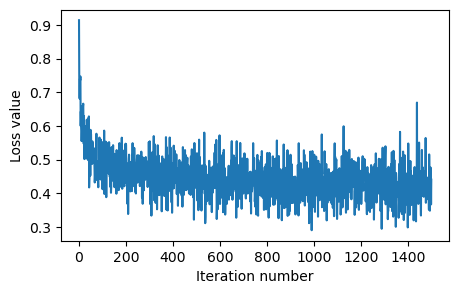

In [72]:
plt.plot(loss_history)
plt.xlabel('Iteration number')
plt.ylabel('Loss value')
plt.show()

In [73]:
print("Training accuracy: ", perceptron.calc_accuracy(X_train, y_train))
print("Testing accuracy: ", perceptron.calc_accuracy(X_test, y_test))

Training accuracy:  82.88
Testing accuracy:  81.6


## Hyperparameter optimization

Your model should have improved from 50% accuracy to ~75% accuracy in a matter of seconds. Now, use the validation set to tune hyperparameters by training different models (using the training dataset) and evaluating the performance using the validation dataset. Save the results in a dictionary mapping tuples of the form `(learning_rate, batch_size)` to tuples of the form `(training_accuracy, validation_accuracy)`. Finally, you should evaluate the best model on the testing dataset. 

Use a small value for the number of iterations as you develop your code. Once you are confident that everything works, run it again for more iterations. **(5 points)**


In [21]:
# You are encouraged to experiment with additional values
learning_rates = [1e-7, 5e-6]
batch_sizes = [1, 100, 200, 500]

results = {}
best_val = -1   # The highest validation accuracy that we have seen so far.
best_perceptron = None # The LinearPerceptron object that achieved the highest validation rate.

################################################################################
#                            START OF YOUR CODE                                #
################################################################################
SAMPLES = X_train.shape[0]
EPOCHS = 100
iterations = lambda batch_size: int(EPOCHS * SAMPLES / batch_size)

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        iters = iterations(batch_size)
        model = LinearPerceptron(X_train, y_train)
        _ = model.train(
            X_train, 
            y_train, 
            learning_rate, 
            iters,
            batch_size,
            verbose=True
        )
        
        train_set_accuracy = model.calc_accuracy(X_train, y_train)
        val_set_accuracy = model.calc_accuracy(X_val, y_val)
        
        if val_set_accuracy > best_val:
            best_val = val_set_accuracy
            best_perceptron = model
        results[(learning_rate, batch_size)] = (train_set_accuracy, val_set_accuracy)

################################################################################
#                              END OF YOUR CODE                                #
################################################################################
    
# Print out results.
for lr, batch_size in sorted(results):
    train_accuracy, val_accuracy = results[(lr, batch_size)]
    print ('lr %e batch_size %e train accuracy: %f val accuracy: %f' % (
                lr, batch_size, train_accuracy, val_accuracy))
    
print ('best validation accuracy achieved during cross-validation: %f' % best_val)

test_accuracy = best_perceptron.calc_accuracy(X_test, y_test)
print ('linear perceptron on raw pixels final test set accuracy: %f' % test_accuracy)

iteration 0 / 1000000: loss 0.000000
iteration 100 / 1000000: loss 0.000000
iteration 200 / 1000000: loss 0.000000
iteration 300 / 1000000: loss 0.000000
iteration 400 / 1000000: loss 0.000000
iteration 500 / 1000000: loss 0.000000
iteration 600 / 1000000: loss 0.000000
iteration 700 / 1000000: loss 0.000000
iteration 800 / 1000000: loss 0.000000
iteration 900 / 1000000: loss 0.000000
iteration 1000 / 1000000: loss 0.000000
iteration 1100 / 1000000: loss 0.000000
iteration 1200 / 1000000: loss 0.000000
iteration 1300 / 1000000: loss 0.000000
iteration 1400 / 1000000: loss 0.000000
iteration 1500 / 1000000: loss 0.000000
iteration 1600 / 1000000: loss 0.000000
iteration 1700 / 1000000: loss 0.000000
iteration 1800 / 1000000: loss 0.000000
iteration 1900 / 1000000: loss 0.000000
iteration 2000 / 1000000: loss 0.000000
iteration 2100 / 1000000: loss 0.000000
iteration 2200 / 1000000: loss 0.000000
iteration 2300 / 1000000: loss 0.000000
iteration 2400 / 1000000: loss 0.000000
iteration 25

iteration 22500 / 1000000: loss 0.000000
iteration 22600 / 1000000: loss 0.000000
iteration 22700 / 1000000: loss 0.000000
iteration 22800 / 1000000: loss 0.000000
iteration 22900 / 1000000: loss 0.000000
iteration 23000 / 1000000: loss 0.000000
iteration 23100 / 1000000: loss 0.000000
iteration 23200 / 1000000: loss 0.000000
iteration 23300 / 1000000: loss 0.000000
iteration 23400 / 1000000: loss 0.000000
iteration 23500 / 1000000: loss 0.000000
iteration 23600 / 1000000: loss 0.000000
iteration 23700 / 1000000: loss 0.000000
iteration 23800 / 1000000: loss 0.000000
iteration 23900 / 1000000: loss 0.000000
iteration 24000 / 1000000: loss 0.000000
iteration 24100 / 1000000: loss 0.000000
iteration 24200 / 1000000: loss 0.000000
iteration 24300 / 1000000: loss 0.000000
iteration 24400 / 1000000: loss 0.000000
iteration 24500 / 1000000: loss 0.000000
iteration 24600 / 1000000: loss 0.000000
iteration 24700 / 1000000: loss 0.000000
iteration 24800 / 1000000: loss 0.000000
iteration 24900 

iteration 47200 / 1000000: loss 0.000000
iteration 47300 / 1000000: loss 0.000000
iteration 47400 / 1000000: loss 0.000000
iteration 47500 / 1000000: loss 0.000000
iteration 47600 / 1000000: loss 0.000000
iteration 47700 / 1000000: loss 0.000000
iteration 47800 / 1000000: loss 0.000000
iteration 47900 / 1000000: loss 0.000000
iteration 48000 / 1000000: loss 0.000000
iteration 48100 / 1000000: loss 0.000000
iteration 48200 / 1000000: loss 0.000000
iteration 48300 / 1000000: loss 0.000000
iteration 48400 / 1000000: loss 0.000000
iteration 48500 / 1000000: loss 0.000000
iteration 48600 / 1000000: loss 0.000000
iteration 48700 / 1000000: loss 0.000000
iteration 48800 / 1000000: loss 0.000000
iteration 48900 / 1000000: loss 0.000000
iteration 49000 / 1000000: loss 0.000000
iteration 49100 / 1000000: loss 0.000000
iteration 49200 / 1000000: loss 0.000000
iteration 49300 / 1000000: loss 0.000000
iteration 49400 / 1000000: loss 0.000000
iteration 49500 / 1000000: loss 0.000000
iteration 49600 

iteration 67600 / 1000000: loss 0.000000
iteration 67700 / 1000000: loss 0.000000
iteration 67800 / 1000000: loss 0.000000
iteration 67900 / 1000000: loss 0.000000
iteration 68000 / 1000000: loss 0.000000
iteration 68100 / 1000000: loss 0.000000
iteration 68200 / 1000000: loss 0.000000
iteration 68300 / 1000000: loss 0.000000
iteration 68400 / 1000000: loss 0.000000
iteration 68500 / 1000000: loss 0.000000
iteration 68600 / 1000000: loss 0.000000
iteration 68700 / 1000000: loss 0.000000
iteration 68800 / 1000000: loss 0.000000
iteration 68900 / 1000000: loss 0.000000
iteration 69000 / 1000000: loss 0.000000
iteration 69100 / 1000000: loss 0.000000
iteration 69200 / 1000000: loss 0.000000
iteration 69300 / 1000000: loss 0.000000
iteration 69400 / 1000000: loss 0.000000
iteration 69500 / 1000000: loss 0.000000
iteration 69600 / 1000000: loss 0.000000
iteration 69700 / 1000000: loss 0.000000
iteration 69800 / 1000000: loss 0.000000
iteration 69900 / 1000000: loss 0.000000
iteration 70000 

iteration 88300 / 1000000: loss 0.000000
iteration 88400 / 1000000: loss 0.000000
iteration 88500 / 1000000: loss 0.000000
iteration 88600 / 1000000: loss 0.000000
iteration 88700 / 1000000: loss 0.000000
iteration 88800 / 1000000: loss 0.000000
iteration 88900 / 1000000: loss 0.000000
iteration 89000 / 1000000: loss 0.000000
iteration 89100 / 1000000: loss 0.000000
iteration 89200 / 1000000: loss 0.000000
iteration 89300 / 1000000: loss 0.000000
iteration 89400 / 1000000: loss 0.000000
iteration 89500 / 1000000: loss 0.000000
iteration 89600 / 1000000: loss 0.000000
iteration 89700 / 1000000: loss 0.000000
iteration 89800 / 1000000: loss 0.000000
iteration 89900 / 1000000: loss 0.000000
iteration 90000 / 1000000: loss 0.000000
iteration 90100 / 1000000: loss 0.000000
iteration 90200 / 1000000: loss 0.000000
iteration 90300 / 1000000: loss 0.000000
iteration 90400 / 1000000: loss 0.000000
iteration 90500 / 1000000: loss 0.000000
iteration 90600 / 1000000: loss 0.000000
iteration 90700 

iteration 109100 / 1000000: loss 0.000000
iteration 109200 / 1000000: loss 0.000000
iteration 109300 / 1000000: loss 0.000000
iteration 109400 / 1000000: loss 0.000000
iteration 109500 / 1000000: loss 0.000000
iteration 109600 / 1000000: loss 0.000000
iteration 109700 / 1000000: loss 0.000000
iteration 109800 / 1000000: loss 0.000000
iteration 109900 / 1000000: loss 0.000000
iteration 110000 / 1000000: loss 0.000000
iteration 110100 / 1000000: loss 0.000000
iteration 110200 / 1000000: loss 0.000000
iteration 110300 / 1000000: loss 0.000000
iteration 110400 / 1000000: loss 0.000000
iteration 110500 / 1000000: loss 0.000000
iteration 110600 / 1000000: loss 0.000000
iteration 110700 / 1000000: loss 0.000000
iteration 110800 / 1000000: loss 0.000000
iteration 110900 / 1000000: loss 0.000000
iteration 111000 / 1000000: loss 0.000000
iteration 111100 / 1000000: loss 0.000000
iteration 111200 / 1000000: loss 0.000000
iteration 111300 / 1000000: loss 0.000000
iteration 111400 / 1000000: loss 0

iteration 129700 / 1000000: loss 0.000000
iteration 129800 / 1000000: loss 0.000000
iteration 129900 / 1000000: loss 0.000000
iteration 130000 / 1000000: loss 0.000000
iteration 130100 / 1000000: loss 0.000000
iteration 130200 / 1000000: loss 0.000000
iteration 130300 / 1000000: loss 0.000000
iteration 130400 / 1000000: loss 0.000000
iteration 130500 / 1000000: loss 0.000000
iteration 130600 / 1000000: loss 0.000000
iteration 130700 / 1000000: loss 0.000000
iteration 130800 / 1000000: loss 0.000000
iteration 130900 / 1000000: loss 0.000000
iteration 131000 / 1000000: loss 0.000000
iteration 131100 / 1000000: loss 0.000000
iteration 131200 / 1000000: loss 0.000000
iteration 131300 / 1000000: loss 0.000000
iteration 131400 / 1000000: loss 0.000000
iteration 131500 / 1000000: loss 0.000000
iteration 131600 / 1000000: loss 0.000000
iteration 131700 / 1000000: loss 0.000000
iteration 131800 / 1000000: loss 0.000000
iteration 131900 / 1000000: loss 0.000000
iteration 132000 / 1000000: loss 0

iteration 151100 / 1000000: loss 0.000000
iteration 151200 / 1000000: loss 0.000000
iteration 151300 / 1000000: loss 0.000000
iteration 151400 / 1000000: loss 0.000000
iteration 151500 / 1000000: loss 0.000000
iteration 151600 / 1000000: loss 0.000000
iteration 151700 / 1000000: loss 0.000000
iteration 151800 / 1000000: loss 0.000000
iteration 151900 / 1000000: loss 0.000000
iteration 152000 / 1000000: loss 0.000000
iteration 152100 / 1000000: loss 0.000000
iteration 152200 / 1000000: loss 0.000000
iteration 152300 / 1000000: loss 0.000000
iteration 152400 / 1000000: loss 0.000000
iteration 152500 / 1000000: loss 0.000000
iteration 152600 / 1000000: loss 0.000000
iteration 152700 / 1000000: loss 0.000000
iteration 152800 / 1000000: loss 0.000000
iteration 152900 / 1000000: loss 0.000000
iteration 153000 / 1000000: loss 0.000000
iteration 153100 / 1000000: loss 0.000000
iteration 153200 / 1000000: loss 0.000000
iteration 153300 / 1000000: loss 0.000000
iteration 153400 / 1000000: loss 0

iteration 173100 / 1000000: loss 0.000000
iteration 173200 / 1000000: loss 0.000000
iteration 173300 / 1000000: loss 0.000000
iteration 173400 / 1000000: loss 0.000000
iteration 173500 / 1000000: loss 0.000000
iteration 173600 / 1000000: loss 0.000000
iteration 173700 / 1000000: loss 0.000000
iteration 173800 / 1000000: loss 0.000000
iteration 173900 / 1000000: loss 0.000000
iteration 174000 / 1000000: loss 0.000000
iteration 174100 / 1000000: loss 0.000000
iteration 174200 / 1000000: loss 0.000000
iteration 174300 / 1000000: loss 0.000000
iteration 174400 / 1000000: loss 0.000000
iteration 174500 / 1000000: loss 0.000000
iteration 174600 / 1000000: loss 0.000000
iteration 174700 / 1000000: loss 0.000000
iteration 174800 / 1000000: loss 0.000000
iteration 174900 / 1000000: loss 0.000000
iteration 175000 / 1000000: loss 0.000000
iteration 175100 / 1000000: loss 0.000000
iteration 175200 / 1000000: loss 0.000000
iteration 175300 / 1000000: loss 0.000000
iteration 175400 / 1000000: loss 0

iteration 195200 / 1000000: loss 0.000000
iteration 195300 / 1000000: loss 0.000000
iteration 195400 / 1000000: loss 0.000000
iteration 195500 / 1000000: loss 0.000000
iteration 195600 / 1000000: loss 0.000000
iteration 195700 / 1000000: loss 0.000000
iteration 195800 / 1000000: loss 0.000000
iteration 195900 / 1000000: loss 0.000000
iteration 196000 / 1000000: loss 0.000000
iteration 196100 / 1000000: loss 0.000000
iteration 196200 / 1000000: loss 0.000000
iteration 196300 / 1000000: loss 0.000000
iteration 196400 / 1000000: loss 0.000000
iteration 196500 / 1000000: loss 0.000000
iteration 196600 / 1000000: loss 0.000000
iteration 196700 / 1000000: loss 0.000000
iteration 196800 / 1000000: loss 0.000000
iteration 196900 / 1000000: loss 0.000000
iteration 197000 / 1000000: loss 0.000000
iteration 197100 / 1000000: loss 0.000000
iteration 197200 / 1000000: loss 0.000000
iteration 197300 / 1000000: loss 0.000000
iteration 197400 / 1000000: loss 0.000000
iteration 197500 / 1000000: loss 0

iteration 217100 / 1000000: loss 0.000000
iteration 217200 / 1000000: loss 0.000000
iteration 217300 / 1000000: loss 0.000000
iteration 217400 / 1000000: loss 0.000000
iteration 217500 / 1000000: loss 0.000000
iteration 217600 / 1000000: loss 0.000000
iteration 217700 / 1000000: loss 0.000000
iteration 217800 / 1000000: loss 0.000000
iteration 217900 / 1000000: loss 0.000000
iteration 218000 / 1000000: loss 0.000000
iteration 218100 / 1000000: loss 0.000000
iteration 218200 / 1000000: loss 0.000000
iteration 218300 / 1000000: loss 0.000000
iteration 218400 / 1000000: loss 0.000000
iteration 218500 / 1000000: loss 0.000000
iteration 218600 / 1000000: loss 0.000000
iteration 218700 / 1000000: loss 0.000000
iteration 218800 / 1000000: loss 0.000000
iteration 218900 / 1000000: loss 0.000000
iteration 219000 / 1000000: loss 0.000000
iteration 219100 / 1000000: loss 0.000000
iteration 219200 / 1000000: loss 0.000000
iteration 219300 / 1000000: loss 0.000000
iteration 219400 / 1000000: loss 0

iteration 238300 / 1000000: loss 0.000000
iteration 238400 / 1000000: loss 0.000000
iteration 238500 / 1000000: loss 0.000000
iteration 238600 / 1000000: loss 0.000000
iteration 238700 / 1000000: loss 0.000000
iteration 238800 / 1000000: loss 0.000000
iteration 238900 / 1000000: loss 0.000000
iteration 239000 / 1000000: loss 0.000000
iteration 239100 / 1000000: loss 0.000000
iteration 239200 / 1000000: loss 0.000000
iteration 239300 / 1000000: loss 0.000000
iteration 239400 / 1000000: loss 0.000000
iteration 239500 / 1000000: loss 0.000000
iteration 239600 / 1000000: loss 0.000000
iteration 239700 / 1000000: loss 0.000000
iteration 239800 / 1000000: loss 0.000000
iteration 239900 / 1000000: loss 0.000000
iteration 240000 / 1000000: loss 0.000000
iteration 240100 / 1000000: loss 0.000000
iteration 240200 / 1000000: loss 0.000000
iteration 240300 / 1000000: loss 0.000000
iteration 240400 / 1000000: loss 0.000000
iteration 240500 / 1000000: loss 0.000000
iteration 240600 / 1000000: loss 0

iteration 258800 / 1000000: loss 0.000000
iteration 258900 / 1000000: loss 0.000000
iteration 259000 / 1000000: loss 0.000000
iteration 259100 / 1000000: loss 0.000000
iteration 259200 / 1000000: loss 0.000000
iteration 259300 / 1000000: loss 0.000000
iteration 259400 / 1000000: loss 0.000000
iteration 259500 / 1000000: loss 0.000000
iteration 259600 / 1000000: loss 0.000000
iteration 259700 / 1000000: loss 0.000000
iteration 259800 / 1000000: loss 0.000000
iteration 259900 / 1000000: loss 0.000000
iteration 260000 / 1000000: loss 0.000000
iteration 260100 / 1000000: loss 0.000000
iteration 260200 / 1000000: loss 0.000000
iteration 260300 / 1000000: loss 0.000000
iteration 260400 / 1000000: loss 0.000000
iteration 260500 / 1000000: loss 0.000000
iteration 260600 / 1000000: loss 0.000000
iteration 260700 / 1000000: loss 0.000000
iteration 260800 / 1000000: loss 0.000000
iteration 260900 / 1000000: loss 0.000000
iteration 261000 / 1000000: loss 0.000000
iteration 261100 / 1000000: loss 0

iteration 279600 / 1000000: loss 0.000000
iteration 279700 / 1000000: loss 0.000000
iteration 279800 / 1000000: loss 0.000000
iteration 279900 / 1000000: loss 0.000000
iteration 280000 / 1000000: loss 0.000000
iteration 280100 / 1000000: loss 0.000000
iteration 280200 / 1000000: loss 0.000000
iteration 280300 / 1000000: loss 0.000000
iteration 280400 / 1000000: loss 0.000000
iteration 280500 / 1000000: loss 0.000000
iteration 280600 / 1000000: loss 0.000000
iteration 280700 / 1000000: loss 0.000000
iteration 280800 / 1000000: loss 0.000000
iteration 280900 / 1000000: loss 0.000000
iteration 281000 / 1000000: loss 0.000000
iteration 281100 / 1000000: loss 0.000000
iteration 281200 / 1000000: loss 0.000000
iteration 281300 / 1000000: loss 0.000000
iteration 281400 / 1000000: loss 0.000000
iteration 281500 / 1000000: loss 0.000000
iteration 281600 / 1000000: loss 0.000000
iteration 281700 / 1000000: loss 0.000000
iteration 281800 / 1000000: loss 0.000000
iteration 281900 / 1000000: loss 0

iteration 300800 / 1000000: loss 0.000000
iteration 300900 / 1000000: loss 0.000000
iteration 301000 / 1000000: loss 0.000000
iteration 301100 / 1000000: loss 0.000000
iteration 301200 / 1000000: loss 0.000000
iteration 301300 / 1000000: loss 0.000000
iteration 301400 / 1000000: loss 0.000000
iteration 301500 / 1000000: loss 0.000000
iteration 301600 / 1000000: loss 0.000000
iteration 301700 / 1000000: loss 0.000000
iteration 301800 / 1000000: loss 0.000000
iteration 301900 / 1000000: loss 0.000000
iteration 302000 / 1000000: loss 0.000000
iteration 302100 / 1000000: loss 0.000000
iteration 302200 / 1000000: loss 0.000000
iteration 302300 / 1000000: loss 0.000000
iteration 302400 / 1000000: loss 0.000000
iteration 302500 / 1000000: loss 0.000000
iteration 302600 / 1000000: loss 0.000000
iteration 302700 / 1000000: loss 0.000000
iteration 302800 / 1000000: loss 0.000000
iteration 302900 / 1000000: loss 0.000000
iteration 303000 / 1000000: loss 0.000000
iteration 303100 / 1000000: loss 0

iteration 321900 / 1000000: loss 0.000000
iteration 322000 / 1000000: loss 0.000000
iteration 322100 / 1000000: loss 0.000000
iteration 322200 / 1000000: loss 0.000000
iteration 322300 / 1000000: loss 0.000000
iteration 322400 / 1000000: loss 0.000000
iteration 322500 / 1000000: loss 0.000000
iteration 322600 / 1000000: loss 0.000000
iteration 322700 / 1000000: loss 0.000000
iteration 322800 / 1000000: loss 0.000000
iteration 322900 / 1000000: loss 0.000000
iteration 323000 / 1000000: loss 0.000000
iteration 323100 / 1000000: loss 0.000000
iteration 323200 / 1000000: loss 0.000000
iteration 323300 / 1000000: loss 0.000000
iteration 323400 / 1000000: loss 0.000000
iteration 323500 / 1000000: loss 0.000000
iteration 323600 / 1000000: loss 0.000000
iteration 323700 / 1000000: loss 0.000000
iteration 323800 / 1000000: loss 0.000000
iteration 323900 / 1000000: loss 0.000000
iteration 324000 / 1000000: loss 0.000000
iteration 324100 / 1000000: loss 0.000000
iteration 324200 / 1000000: loss 0

iteration 343000 / 1000000: loss 0.000000
iteration 343100 / 1000000: loss 0.000000
iteration 343200 / 1000000: loss 0.000000
iteration 343300 / 1000000: loss 0.000000
iteration 343400 / 1000000: loss 0.000000
iteration 343500 / 1000000: loss 0.000000
iteration 343600 / 1000000: loss 0.000000
iteration 343700 / 1000000: loss 0.000000
iteration 343800 / 1000000: loss 0.000000
iteration 343900 / 1000000: loss 0.000000
iteration 344000 / 1000000: loss 0.000000
iteration 344100 / 1000000: loss 0.000000
iteration 344200 / 1000000: loss 0.000000
iteration 344300 / 1000000: loss 0.000000
iteration 344400 / 1000000: loss 0.000000
iteration 344500 / 1000000: loss 0.000000
iteration 344600 / 1000000: loss 0.000000
iteration 344700 / 1000000: loss 0.000000
iteration 344800 / 1000000: loss 0.000000
iteration 344900 / 1000000: loss 0.000000
iteration 345000 / 1000000: loss 0.000000
iteration 345100 / 1000000: loss 0.000000
iteration 345200 / 1000000: loss 0.000000
iteration 345300 / 1000000: loss 0

iteration 365200 / 1000000: loss 0.000000
iteration 365300 / 1000000: loss 0.000000
iteration 365400 / 1000000: loss 0.000000
iteration 365500 / 1000000: loss 0.000000
iteration 365600 / 1000000: loss 0.000000
iteration 365700 / 1000000: loss 0.000000
iteration 365800 / 1000000: loss 0.000000
iteration 365900 / 1000000: loss 0.000000
iteration 366000 / 1000000: loss 0.000000
iteration 366100 / 1000000: loss 0.000000
iteration 366200 / 1000000: loss 0.000000
iteration 366300 / 1000000: loss 0.000000
iteration 366400 / 1000000: loss 0.000000
iteration 366500 / 1000000: loss 0.000000
iteration 366600 / 1000000: loss 0.000000
iteration 366700 / 1000000: loss 0.000000
iteration 366800 / 1000000: loss 0.000000
iteration 366900 / 1000000: loss 0.000000
iteration 367000 / 1000000: loss 0.000000
iteration 367100 / 1000000: loss 0.000000
iteration 367200 / 1000000: loss 0.000000
iteration 367300 / 1000000: loss 0.000000
iteration 367400 / 1000000: loss 0.000000
iteration 367500 / 1000000: loss 0

iteration 386700 / 1000000: loss 0.000000
iteration 386800 / 1000000: loss 0.000000
iteration 386900 / 1000000: loss 0.000000
iteration 387000 / 1000000: loss 0.000000
iteration 387100 / 1000000: loss 0.000000
iteration 387200 / 1000000: loss 0.000000
iteration 387300 / 1000000: loss 0.000000
iteration 387400 / 1000000: loss 0.000000
iteration 387500 / 1000000: loss 0.000000
iteration 387600 / 1000000: loss 0.000000
iteration 387700 / 1000000: loss 0.000000
iteration 387800 / 1000000: loss 0.000000
iteration 387900 / 1000000: loss 0.000000
iteration 388000 / 1000000: loss 0.000000
iteration 388100 / 1000000: loss 0.000000
iteration 388200 / 1000000: loss 0.000000
iteration 388300 / 1000000: loss 0.000000
iteration 388400 / 1000000: loss 0.000000
iteration 388500 / 1000000: loss 0.000000
iteration 388600 / 1000000: loss 0.000000
iteration 388700 / 1000000: loss 0.000000
iteration 388800 / 1000000: loss 0.000000
iteration 388900 / 1000000: loss 0.000000
iteration 389000 / 1000000: loss 0

iteration 409400 / 1000000: loss 0.000000
iteration 409500 / 1000000: loss 0.000000
iteration 409600 / 1000000: loss 0.000000
iteration 409700 / 1000000: loss 0.000000
iteration 409800 / 1000000: loss 0.000000
iteration 409900 / 1000000: loss 0.000000
iteration 410000 / 1000000: loss 0.000000
iteration 410100 / 1000000: loss 0.000000
iteration 410200 / 1000000: loss 0.000000
iteration 410300 / 1000000: loss 0.000000
iteration 410400 / 1000000: loss 0.000000
iteration 410500 / 1000000: loss 0.000000
iteration 410600 / 1000000: loss 0.000000
iteration 410700 / 1000000: loss 0.000000
iteration 410800 / 1000000: loss 0.000000
iteration 410900 / 1000000: loss 0.000000
iteration 411000 / 1000000: loss 0.000000
iteration 411100 / 1000000: loss 0.000000
iteration 411200 / 1000000: loss 0.000000
iteration 411300 / 1000000: loss 0.000000
iteration 411400 / 1000000: loss 0.000000
iteration 411500 / 1000000: loss 0.000000
iteration 411600 / 1000000: loss 0.000000
iteration 411700 / 1000000: loss 0

iteration 432000 / 1000000: loss 0.000000
iteration 432100 / 1000000: loss 0.000000
iteration 432200 / 1000000: loss 0.000000
iteration 432300 / 1000000: loss 0.000000
iteration 432400 / 1000000: loss 0.000000
iteration 432500 / 1000000: loss 0.000000
iteration 432600 / 1000000: loss 0.000000
iteration 432700 / 1000000: loss 0.000000
iteration 432800 / 1000000: loss 0.000000
iteration 432900 / 1000000: loss 0.000000
iteration 433000 / 1000000: loss 0.000000
iteration 433100 / 1000000: loss 0.000000
iteration 433200 / 1000000: loss 0.000000
iteration 433300 / 1000000: loss 0.000000
iteration 433400 / 1000000: loss 0.000000
iteration 433500 / 1000000: loss 0.000000
iteration 433600 / 1000000: loss 0.000000
iteration 433700 / 1000000: loss 0.000000
iteration 433800 / 1000000: loss 0.000000
iteration 433900 / 1000000: loss 0.000000
iteration 434000 / 1000000: loss 0.000000
iteration 434100 / 1000000: loss 0.000000
iteration 434200 / 1000000: loss 0.000000
iteration 434300 / 1000000: loss 0

iteration 454400 / 1000000: loss 0.000000
iteration 454500 / 1000000: loss 0.000000
iteration 454600 / 1000000: loss 0.000000
iteration 454700 / 1000000: loss 0.000000
iteration 454800 / 1000000: loss 0.000000
iteration 454900 / 1000000: loss 0.000000
iteration 455000 / 1000000: loss 0.000000
iteration 455100 / 1000000: loss 0.000000
iteration 455200 / 1000000: loss 0.000000
iteration 455300 / 1000000: loss 0.000000
iteration 455400 / 1000000: loss 0.000000
iteration 455500 / 1000000: loss 0.000000
iteration 455600 / 1000000: loss 0.000000
iteration 455700 / 1000000: loss 0.000000
iteration 455800 / 1000000: loss 0.000000
iteration 455900 / 1000000: loss 0.000000
iteration 456000 / 1000000: loss 0.000000
iteration 456100 / 1000000: loss 0.000000
iteration 456200 / 1000000: loss 0.000000
iteration 456300 / 1000000: loss 0.000000
iteration 456400 / 1000000: loss 0.000000
iteration 456500 / 1000000: loss 0.000000
iteration 456600 / 1000000: loss 0.000000
iteration 456700 / 1000000: loss 0

iteration 476600 / 1000000: loss 0.000000
iteration 476700 / 1000000: loss 0.000000
iteration 476800 / 1000000: loss 0.000000
iteration 476900 / 1000000: loss 0.000000
iteration 477000 / 1000000: loss 0.000000
iteration 477100 / 1000000: loss 0.000000
iteration 477200 / 1000000: loss 0.000000
iteration 477300 / 1000000: loss 0.000000
iteration 477400 / 1000000: loss 0.000000
iteration 477500 / 1000000: loss 0.000000
iteration 477600 / 1000000: loss 0.000000
iteration 477700 / 1000000: loss 0.000000
iteration 477800 / 1000000: loss 0.000000
iteration 477900 / 1000000: loss 0.000000
iteration 478000 / 1000000: loss 0.000000
iteration 478100 / 1000000: loss 0.000000
iteration 478200 / 1000000: loss 0.000000
iteration 478300 / 1000000: loss 0.000000
iteration 478400 / 1000000: loss 0.000000
iteration 478500 / 1000000: loss 0.000000
iteration 478600 / 1000000: loss 0.000000
iteration 478700 / 1000000: loss 0.000000
iteration 478800 / 1000000: loss 0.000000
iteration 478900 / 1000000: loss 0

iteration 499000 / 1000000: loss 0.000000
iteration 499100 / 1000000: loss 0.000000
iteration 499200 / 1000000: loss 0.000000
iteration 499300 / 1000000: loss 0.000000
iteration 499400 / 1000000: loss 0.000000
iteration 499500 / 1000000: loss 0.000000
iteration 499600 / 1000000: loss 0.000000
iteration 499700 / 1000000: loss 0.000000
iteration 499800 / 1000000: loss 0.000000
iteration 499900 / 1000000: loss 0.000000
iteration 500000 / 1000000: loss 0.000000
iteration 500100 / 1000000: loss 0.000000
iteration 500200 / 1000000: loss 0.000000
iteration 500300 / 1000000: loss 0.000000
iteration 500400 / 1000000: loss 0.000000
iteration 500500 / 1000000: loss 0.000000
iteration 500600 / 1000000: loss 0.000000
iteration 500700 / 1000000: loss 0.000000
iteration 500800 / 1000000: loss 0.000000
iteration 500900 / 1000000: loss 0.000000
iteration 501000 / 1000000: loss 0.000000
iteration 501100 / 1000000: loss 0.000000
iteration 501200 / 1000000: loss 0.000000
iteration 501300 / 1000000: loss 0

iteration 522400 / 1000000: loss 0.000000
iteration 522500 / 1000000: loss 0.000000
iteration 522600 / 1000000: loss 0.000000
iteration 522700 / 1000000: loss 0.000000
iteration 522800 / 1000000: loss 0.000000
iteration 522900 / 1000000: loss 0.000000
iteration 523000 / 1000000: loss 0.000000
iteration 523100 / 1000000: loss 0.000000
iteration 523200 / 1000000: loss 0.000000
iteration 523300 / 1000000: loss 0.000000
iteration 523400 / 1000000: loss 0.000000
iteration 523500 / 1000000: loss 0.000000
iteration 523600 / 1000000: loss 0.000000
iteration 523700 / 1000000: loss 0.000000
iteration 523800 / 1000000: loss 0.000000
iteration 523900 / 1000000: loss 0.000000
iteration 524000 / 1000000: loss 0.000000
iteration 524100 / 1000000: loss 0.000000
iteration 524200 / 1000000: loss 0.000000
iteration 524300 / 1000000: loss 0.000000
iteration 524400 / 1000000: loss 0.000000
iteration 524500 / 1000000: loss 0.000000
iteration 524600 / 1000000: loss 0.000000
iteration 524700 / 1000000: loss 0

iteration 545100 / 1000000: loss 0.000000
iteration 545200 / 1000000: loss 0.000000
iteration 545300 / 1000000: loss 0.000000
iteration 545400 / 1000000: loss 0.000000
iteration 545500 / 1000000: loss 0.000000
iteration 545600 / 1000000: loss 0.000000
iteration 545700 / 1000000: loss 0.000000
iteration 545800 / 1000000: loss 0.000000
iteration 545900 / 1000000: loss 0.000000
iteration 546000 / 1000000: loss 0.000000
iteration 546100 / 1000000: loss 0.000000
iteration 546200 / 1000000: loss 0.000000
iteration 546300 / 1000000: loss 0.000000
iteration 546400 / 1000000: loss 0.000000
iteration 546500 / 1000000: loss 0.000000
iteration 546600 / 1000000: loss 0.000000
iteration 546700 / 1000000: loss 0.000000
iteration 546800 / 1000000: loss 0.000000
iteration 546900 / 1000000: loss 0.000000
iteration 547000 / 1000000: loss 0.000000
iteration 547100 / 1000000: loss 0.000000
iteration 547200 / 1000000: loss 0.000000
iteration 547300 / 1000000: loss 0.000000
iteration 547400 / 1000000: loss 0

iteration 567100 / 1000000: loss 0.000000
iteration 567200 / 1000000: loss 0.000000
iteration 567300 / 1000000: loss 0.000000
iteration 567400 / 1000000: loss 0.000000
iteration 567500 / 1000000: loss 0.000000
iteration 567600 / 1000000: loss 0.000000
iteration 567700 / 1000000: loss 0.000000
iteration 567800 / 1000000: loss 0.000000
iteration 567900 / 1000000: loss 0.000000
iteration 568000 / 1000000: loss 0.000000
iteration 568100 / 1000000: loss 0.000000
iteration 568200 / 1000000: loss 0.000000
iteration 568300 / 1000000: loss 0.000000
iteration 568400 / 1000000: loss 0.000000
iteration 568500 / 1000000: loss 0.000000
iteration 568600 / 1000000: loss 0.000000
iteration 568700 / 1000000: loss 0.000000
iteration 568800 / 1000000: loss 0.000000
iteration 568900 / 1000000: loss 0.000000
iteration 569000 / 1000000: loss 0.000000
iteration 569100 / 1000000: loss 0.000000
iteration 569200 / 1000000: loss 0.000000
iteration 569300 / 1000000: loss 0.000000
iteration 569400 / 1000000: loss 0

iteration 588500 / 1000000: loss 0.000000
iteration 588600 / 1000000: loss 0.000000
iteration 588700 / 1000000: loss 0.000000
iteration 588800 / 1000000: loss 0.000000
iteration 588900 / 1000000: loss 0.000000
iteration 589000 / 1000000: loss 0.000000
iteration 589100 / 1000000: loss 0.000000
iteration 589200 / 1000000: loss 0.000000
iteration 589300 / 1000000: loss 0.000000
iteration 589400 / 1000000: loss 0.000000
iteration 589500 / 1000000: loss 0.000000
iteration 589600 / 1000000: loss 0.000000
iteration 589700 / 1000000: loss 0.000000
iteration 589800 / 1000000: loss 0.000000
iteration 589900 / 1000000: loss 0.000000
iteration 590000 / 1000000: loss 0.000000
iteration 590100 / 1000000: loss 0.000000
iteration 590200 / 1000000: loss 0.000000
iteration 590300 / 1000000: loss 0.000000
iteration 590400 / 1000000: loss 0.000000
iteration 590500 / 1000000: loss 0.000000
iteration 590600 / 1000000: loss 0.000000
iteration 590700 / 1000000: loss 0.000000
iteration 590800 / 1000000: loss 0

iteration 609700 / 1000000: loss 0.000000
iteration 609800 / 1000000: loss 0.000000
iteration 609900 / 1000000: loss 0.000000
iteration 610000 / 1000000: loss 0.000000
iteration 610100 / 1000000: loss 0.000000
iteration 610200 / 1000000: loss 0.000000
iteration 610300 / 1000000: loss 0.000000
iteration 610400 / 1000000: loss 0.000000
iteration 610500 / 1000000: loss 0.000000
iteration 610600 / 1000000: loss 0.000000
iteration 610700 / 1000000: loss 0.000000
iteration 610800 / 1000000: loss 0.000000
iteration 610900 / 1000000: loss 0.000000
iteration 611000 / 1000000: loss 0.000000
iteration 611100 / 1000000: loss 0.000000
iteration 611200 / 1000000: loss 0.000000
iteration 611300 / 1000000: loss 0.000000
iteration 611400 / 1000000: loss 0.000000
iteration 611500 / 1000000: loss 0.000000
iteration 611600 / 1000000: loss 0.000000
iteration 611700 / 1000000: loss 0.000000
iteration 611800 / 1000000: loss 0.000000
iteration 611900 / 1000000: loss 0.000000
iteration 612000 / 1000000: loss 0

iteration 630800 / 1000000: loss 0.000000
iteration 630900 / 1000000: loss 0.000000
iteration 631000 / 1000000: loss 0.000000
iteration 631100 / 1000000: loss 0.000000
iteration 631200 / 1000000: loss 0.000000
iteration 631300 / 1000000: loss 0.000000
iteration 631400 / 1000000: loss 0.000000
iteration 631500 / 1000000: loss 0.000000
iteration 631600 / 1000000: loss 0.000000
iteration 631700 / 1000000: loss 0.000000
iteration 631800 / 1000000: loss 0.000000
iteration 631900 / 1000000: loss 0.000000
iteration 632000 / 1000000: loss 0.000000
iteration 632100 / 1000000: loss 0.000000
iteration 632200 / 1000000: loss 0.000000
iteration 632300 / 1000000: loss 0.000000
iteration 632400 / 1000000: loss 0.000000
iteration 632500 / 1000000: loss 0.000000
iteration 632600 / 1000000: loss 0.000000
iteration 632700 / 1000000: loss 0.000000
iteration 632800 / 1000000: loss 0.000000
iteration 632900 / 1000000: loss 0.000000
iteration 633000 / 1000000: loss 0.000000
iteration 633100 / 1000000: loss 0

iteration 651800 / 1000000: loss 0.000000
iteration 651900 / 1000000: loss 0.000000
iteration 652000 / 1000000: loss 0.000000
iteration 652100 / 1000000: loss 0.000000
iteration 652200 / 1000000: loss 0.000000
iteration 652300 / 1000000: loss 0.000000
iteration 652400 / 1000000: loss 0.000000
iteration 652500 / 1000000: loss 0.000000
iteration 652600 / 1000000: loss 0.000000
iteration 652700 / 1000000: loss 0.000000
iteration 652800 / 1000000: loss 0.000000
iteration 652900 / 1000000: loss 0.000000
iteration 653000 / 1000000: loss 0.000000
iteration 653100 / 1000000: loss 0.000000
iteration 653200 / 1000000: loss 0.000000
iteration 653300 / 1000000: loss 0.000000
iteration 653400 / 1000000: loss 0.000000
iteration 653500 / 1000000: loss 0.000000
iteration 653600 / 1000000: loss 0.000000
iteration 653700 / 1000000: loss 0.000000
iteration 653800 / 1000000: loss 0.000000
iteration 653900 / 1000000: loss 0.000000
iteration 654000 / 1000000: loss 0.000000
iteration 654100 / 1000000: loss 0

iteration 672400 / 1000000: loss 0.000000
iteration 672500 / 1000000: loss 0.000000
iteration 672600 / 1000000: loss 0.000000
iteration 672700 / 1000000: loss 0.000000
iteration 672800 / 1000000: loss 0.000000
iteration 672900 / 1000000: loss 0.000000
iteration 673000 / 1000000: loss 0.000000
iteration 673100 / 1000000: loss 0.000000
iteration 673200 / 1000000: loss 0.000000
iteration 673300 / 1000000: loss 0.000000
iteration 673400 / 1000000: loss 0.000000
iteration 673500 / 1000000: loss 0.000000
iteration 673600 / 1000000: loss 0.000000
iteration 673700 / 1000000: loss 0.000000
iteration 673800 / 1000000: loss 0.000000
iteration 673900 / 1000000: loss 0.000000
iteration 674000 / 1000000: loss 0.000000
iteration 674100 / 1000000: loss 0.000000
iteration 674200 / 1000000: loss 0.000000
iteration 674300 / 1000000: loss 0.000000
iteration 674400 / 1000000: loss 0.000000
iteration 674500 / 1000000: loss 0.000000
iteration 674600 / 1000000: loss 0.000000
iteration 674700 / 1000000: loss 0

iteration 694200 / 1000000: loss 0.000000
iteration 694300 / 1000000: loss 0.000000
iteration 694400 / 1000000: loss 0.000000
iteration 694500 / 1000000: loss 0.000000
iteration 694600 / 1000000: loss 0.000000
iteration 694700 / 1000000: loss 0.000000
iteration 694800 / 1000000: loss 0.000000
iteration 694900 / 1000000: loss 0.000000
iteration 695000 / 1000000: loss 0.000000
iteration 695100 / 1000000: loss 0.000000
iteration 695200 / 1000000: loss 0.000000
iteration 695300 / 1000000: loss 0.000000
iteration 695400 / 1000000: loss 0.000000
iteration 695500 / 1000000: loss 0.000000
iteration 695600 / 1000000: loss 0.000000
iteration 695700 / 1000000: loss 0.000000
iteration 695800 / 1000000: loss 0.000000
iteration 695900 / 1000000: loss 0.000000
iteration 696000 / 1000000: loss 0.000000
iteration 696100 / 1000000: loss 0.000000
iteration 696200 / 1000000: loss 0.000000
iteration 696300 / 1000000: loss 0.000000
iteration 696400 / 1000000: loss 0.000000
iteration 696500 / 1000000: loss 0

iteration 715000 / 1000000: loss 0.000000
iteration 715100 / 1000000: loss 0.000000
iteration 715200 / 1000000: loss 0.000000
iteration 715300 / 1000000: loss 0.000000
iteration 715400 / 1000000: loss 0.000000
iteration 715500 / 1000000: loss 0.000000
iteration 715600 / 1000000: loss 0.000000
iteration 715700 / 1000000: loss 0.000000
iteration 715800 / 1000000: loss 0.000000
iteration 715900 / 1000000: loss 0.000000
iteration 716000 / 1000000: loss 0.000000
iteration 716100 / 1000000: loss 0.000000
iteration 716200 / 1000000: loss 0.000000
iteration 716300 / 1000000: loss 0.000000
iteration 716400 / 1000000: loss 0.000000
iteration 716500 / 1000000: loss 0.000000
iteration 716600 / 1000000: loss 0.000000
iteration 716700 / 1000000: loss 0.000000
iteration 716800 / 1000000: loss 0.000000
iteration 716900 / 1000000: loss 0.000000
iteration 717000 / 1000000: loss 0.000000
iteration 717100 / 1000000: loss 0.000000
iteration 717200 / 1000000: loss 0.000000
iteration 717300 / 1000000: loss 0

iteration 736100 / 1000000: loss 0.000000
iteration 736200 / 1000000: loss 0.000000
iteration 736300 / 1000000: loss 0.000000
iteration 736400 / 1000000: loss 0.000000
iteration 736500 / 1000000: loss 0.000000
iteration 736600 / 1000000: loss 0.000000
iteration 736700 / 1000000: loss 0.000000
iteration 736800 / 1000000: loss 0.000000
iteration 736900 / 1000000: loss 0.000000
iteration 737000 / 1000000: loss 0.000000
iteration 737100 / 1000000: loss 0.000000
iteration 737200 / 1000000: loss 0.000000
iteration 737300 / 1000000: loss 0.000000
iteration 737400 / 1000000: loss 0.000000
iteration 737500 / 1000000: loss 0.000000
iteration 737600 / 1000000: loss 0.000000
iteration 737700 / 1000000: loss 0.000000
iteration 737800 / 1000000: loss 0.000000
iteration 737900 / 1000000: loss 0.000000
iteration 738000 / 1000000: loss 0.000000
iteration 738100 / 1000000: loss 0.000000
iteration 738200 / 1000000: loss 0.000000
iteration 738300 / 1000000: loss 0.000000
iteration 738400 / 1000000: loss 0

iteration 757900 / 1000000: loss 0.000000
iteration 758000 / 1000000: loss 0.000000
iteration 758100 / 1000000: loss 0.000000
iteration 758200 / 1000000: loss 0.000000
iteration 758300 / 1000000: loss 0.000000
iteration 758400 / 1000000: loss 0.000000
iteration 758500 / 1000000: loss 0.000000
iteration 758600 / 1000000: loss 0.000000
iteration 758700 / 1000000: loss 0.000000
iteration 758800 / 1000000: loss 0.000000
iteration 758900 / 1000000: loss 0.000000
iteration 759000 / 1000000: loss 0.000000
iteration 759100 / 1000000: loss 0.000000
iteration 759200 / 1000000: loss 0.000000
iteration 759300 / 1000000: loss 0.000000
iteration 759400 / 1000000: loss 0.000000
iteration 759500 / 1000000: loss 0.000000
iteration 759600 / 1000000: loss 0.000000
iteration 759700 / 1000000: loss 0.000000
iteration 759800 / 1000000: loss 0.000000
iteration 759900 / 1000000: loss 0.000000
iteration 760000 / 1000000: loss 0.000000
iteration 760100 / 1000000: loss 0.000000
iteration 760200 / 1000000: loss 0

iteration 780500 / 1000000: loss 0.000000
iteration 780600 / 1000000: loss 0.000000
iteration 780700 / 1000000: loss 0.000000
iteration 780800 / 1000000: loss 0.000000
iteration 780900 / 1000000: loss 0.000000
iteration 781000 / 1000000: loss 0.000000
iteration 781100 / 1000000: loss 0.000000
iteration 781200 / 1000000: loss 0.000000
iteration 781300 / 1000000: loss 0.000000
iteration 781400 / 1000000: loss 0.000000
iteration 781500 / 1000000: loss 0.000000
iteration 781600 / 1000000: loss 0.000000
iteration 781700 / 1000000: loss 0.000000
iteration 781800 / 1000000: loss 0.000000
iteration 781900 / 1000000: loss 0.000000
iteration 782000 / 1000000: loss 0.000000
iteration 782100 / 1000000: loss 0.000000
iteration 782200 / 1000000: loss 0.000000
iteration 782300 / 1000000: loss 0.000000
iteration 782400 / 1000000: loss 0.000000
iteration 782500 / 1000000: loss 0.000000
iteration 782600 / 1000000: loss 0.000000
iteration 782700 / 1000000: loss 0.000000
iteration 782800 / 1000000: loss 0

iteration 802500 / 1000000: loss 0.000000
iteration 802600 / 1000000: loss 0.000000
iteration 802700 / 1000000: loss 0.000000
iteration 802800 / 1000000: loss 0.000000
iteration 802900 / 1000000: loss 0.000000
iteration 803000 / 1000000: loss 0.000000
iteration 803100 / 1000000: loss 0.000000
iteration 803200 / 1000000: loss 0.000000
iteration 803300 / 1000000: loss 0.000000
iteration 803400 / 1000000: loss 0.000000
iteration 803500 / 1000000: loss 0.000000
iteration 803600 / 1000000: loss 0.000000
iteration 803700 / 1000000: loss 0.000000
iteration 803800 / 1000000: loss 0.000000
iteration 803900 / 1000000: loss 0.000000
iteration 804000 / 1000000: loss 0.000000
iteration 804100 / 1000000: loss 0.000000
iteration 804200 / 1000000: loss 0.000000
iteration 804300 / 1000000: loss 0.000000
iteration 804400 / 1000000: loss 0.000000
iteration 804500 / 1000000: loss 0.000000
iteration 804600 / 1000000: loss 0.000000
iteration 804700 / 1000000: loss 0.000000
iteration 804800 / 1000000: loss 0

iteration 825400 / 1000000: loss 0.000000
iteration 825500 / 1000000: loss 0.000000
iteration 825600 / 1000000: loss 0.000000
iteration 825700 / 1000000: loss 0.000000
iteration 825800 / 1000000: loss 0.000000
iteration 825900 / 1000000: loss 0.000000
iteration 826000 / 1000000: loss 0.000000
iteration 826100 / 1000000: loss 0.000000
iteration 826200 / 1000000: loss 0.000000
iteration 826300 / 1000000: loss 0.000000
iteration 826400 / 1000000: loss 0.000000
iteration 826500 / 1000000: loss 0.000000
iteration 826600 / 1000000: loss 0.000000
iteration 826700 / 1000000: loss 0.000000
iteration 826800 / 1000000: loss 0.000000
iteration 826900 / 1000000: loss 0.000000
iteration 827000 / 1000000: loss 0.000000
iteration 827100 / 1000000: loss 0.000000
iteration 827200 / 1000000: loss 0.000000
iteration 827300 / 1000000: loss 0.000000
iteration 827400 / 1000000: loss 0.000000
iteration 827500 / 1000000: loss 0.000000
iteration 827600 / 1000000: loss 0.000000
iteration 827700 / 1000000: loss 0

iteration 848200 / 1000000: loss 0.000000
iteration 848300 / 1000000: loss 0.000000
iteration 848400 / 1000000: loss 0.000000
iteration 848500 / 1000000: loss 0.000000
iteration 848600 / 1000000: loss 0.000000
iteration 848700 / 1000000: loss 0.000000
iteration 848800 / 1000000: loss 0.000000
iteration 848900 / 1000000: loss 0.000000
iteration 849000 / 1000000: loss 0.000000
iteration 849100 / 1000000: loss 0.000000
iteration 849200 / 1000000: loss 0.000000
iteration 849300 / 1000000: loss 0.000000
iteration 849400 / 1000000: loss 0.000000
iteration 849500 / 1000000: loss 0.000000
iteration 849600 / 1000000: loss 0.000000
iteration 849700 / 1000000: loss 0.000000
iteration 849800 / 1000000: loss 0.000000
iteration 849900 / 1000000: loss 0.000000
iteration 850000 / 1000000: loss 0.000000
iteration 850100 / 1000000: loss 0.000000
iteration 850200 / 1000000: loss 0.000000
iteration 850300 / 1000000: loss 0.000000
iteration 850400 / 1000000: loss 0.000000
iteration 850500 / 1000000: loss 0

iteration 871100 / 1000000: loss 0.000000
iteration 871200 / 1000000: loss 0.000000
iteration 871300 / 1000000: loss 0.000000
iteration 871400 / 1000000: loss 0.000000
iteration 871500 / 1000000: loss 0.000000
iteration 871600 / 1000000: loss 0.000000
iteration 871700 / 1000000: loss 0.000000
iteration 871800 / 1000000: loss 0.000000
iteration 871900 / 1000000: loss 0.000000
iteration 872000 / 1000000: loss 0.000000
iteration 872100 / 1000000: loss 0.000000
iteration 872200 / 1000000: loss 0.000000
iteration 872300 / 1000000: loss 0.000000
iteration 872400 / 1000000: loss 0.000000
iteration 872500 / 1000000: loss 0.000000
iteration 872600 / 1000000: loss 0.000000
iteration 872700 / 1000000: loss 0.000000
iteration 872800 / 1000000: loss 0.000000
iteration 872900 / 1000000: loss 0.000000
iteration 873000 / 1000000: loss 0.000000
iteration 873100 / 1000000: loss 0.000000
iteration 873200 / 1000000: loss 0.000000
iteration 873300 / 1000000: loss 0.000000
iteration 873400 / 1000000: loss 0

iteration 893900 / 1000000: loss 0.000000
iteration 894000 / 1000000: loss 0.000000
iteration 894100 / 1000000: loss 0.000000
iteration 894200 / 1000000: loss 0.000000
iteration 894300 / 1000000: loss 0.000000
iteration 894400 / 1000000: loss 0.000000
iteration 894500 / 1000000: loss 0.000000
iteration 894600 / 1000000: loss 0.000000
iteration 894700 / 1000000: loss 0.000000
iteration 894800 / 1000000: loss 0.000000
iteration 894900 / 1000000: loss 0.000000
iteration 895000 / 1000000: loss 0.000000
iteration 895100 / 1000000: loss 0.000000
iteration 895200 / 1000000: loss 0.000000
iteration 895300 / 1000000: loss 0.000000
iteration 895400 / 1000000: loss 0.000000
iteration 895500 / 1000000: loss 0.000000
iteration 895600 / 1000000: loss 0.000000
iteration 895700 / 1000000: loss 0.000000
iteration 895800 / 1000000: loss 0.000000
iteration 895900 / 1000000: loss 0.000000
iteration 896000 / 1000000: loss 0.000000
iteration 896100 / 1000000: loss 0.000000
iteration 896200 / 1000000: loss 0

iteration 916600 / 1000000: loss 0.000000
iteration 916700 / 1000000: loss 0.000000
iteration 916800 / 1000000: loss 0.000000
iteration 916900 / 1000000: loss 0.000000
iteration 917000 / 1000000: loss 0.000000
iteration 917100 / 1000000: loss 0.000000
iteration 917200 / 1000000: loss 0.000000
iteration 917300 / 1000000: loss 0.000000
iteration 917400 / 1000000: loss 0.000000
iteration 917500 / 1000000: loss 0.000000
iteration 917600 / 1000000: loss 0.000000
iteration 917700 / 1000000: loss 0.000000
iteration 917800 / 1000000: loss 0.000000
iteration 917900 / 1000000: loss 0.000000
iteration 918000 / 1000000: loss 0.000000
iteration 918100 / 1000000: loss 0.000000
iteration 918200 / 1000000: loss 0.000000
iteration 918300 / 1000000: loss 0.000000
iteration 918400 / 1000000: loss 0.000000
iteration 918500 / 1000000: loss 0.000000
iteration 918600 / 1000000: loss 0.000000
iteration 918700 / 1000000: loss 0.000000
iteration 918800 / 1000000: loss 0.000000
iteration 918900 / 1000000: loss 0

iteration 938200 / 1000000: loss 0.000000
iteration 938300 / 1000000: loss 0.000000
iteration 938400 / 1000000: loss 0.000000
iteration 938500 / 1000000: loss 0.000000
iteration 938600 / 1000000: loss 0.000000
iteration 938700 / 1000000: loss 0.000000
iteration 938800 / 1000000: loss 0.000000
iteration 938900 / 1000000: loss 0.000000
iteration 939000 / 1000000: loss 0.000000
iteration 939100 / 1000000: loss 0.000000
iteration 939200 / 1000000: loss 0.000000
iteration 939300 / 1000000: loss 0.000000
iteration 939400 / 1000000: loss 0.000000
iteration 939500 / 1000000: loss 0.000000
iteration 939600 / 1000000: loss 0.000000
iteration 939700 / 1000000: loss 0.000000
iteration 939800 / 1000000: loss 0.000000
iteration 939900 / 1000000: loss 0.000000
iteration 940000 / 1000000: loss 0.000000
iteration 940100 / 1000000: loss 0.000000
iteration 940200 / 1000000: loss 0.000000
iteration 940300 / 1000000: loss 0.000000
iteration 940400 / 1000000: loss 0.000000
iteration 940500 / 1000000: loss 0

iteration 960800 / 1000000: loss 0.000000
iteration 960900 / 1000000: loss 0.000000
iteration 961000 / 1000000: loss 0.000000
iteration 961100 / 1000000: loss 0.000000
iteration 961200 / 1000000: loss 0.000000
iteration 961300 / 1000000: loss 0.000000
iteration 961400 / 1000000: loss 0.000000
iteration 961500 / 1000000: loss 0.000000
iteration 961600 / 1000000: loss 0.000000
iteration 961700 / 1000000: loss 0.000000
iteration 961800 / 1000000: loss 0.000000
iteration 961900 / 1000000: loss 0.000000
iteration 962000 / 1000000: loss 0.000000
iteration 962100 / 1000000: loss 0.000000
iteration 962200 / 1000000: loss 0.000000
iteration 962300 / 1000000: loss 0.000000
iteration 962400 / 1000000: loss 0.000000
iteration 962500 / 1000000: loss 0.000000
iteration 962600 / 1000000: loss 0.000000
iteration 962700 / 1000000: loss 0.000000
iteration 962800 / 1000000: loss 0.000000
iteration 962900 / 1000000: loss 0.000000
iteration 963000 / 1000000: loss 0.000000
iteration 963100 / 1000000: loss 0

iteration 983400 / 1000000: loss 0.000000
iteration 983500 / 1000000: loss 0.000000
iteration 983600 / 1000000: loss 0.000000
iteration 983700 / 1000000: loss 0.000000
iteration 983800 / 1000000: loss 0.000000
iteration 983900 / 1000000: loss 0.000000
iteration 984000 / 1000000: loss 0.000000
iteration 984100 / 1000000: loss 0.000000
iteration 984200 / 1000000: loss 0.000000
iteration 984300 / 1000000: loss 0.000000
iteration 984400 / 1000000: loss 0.000000
iteration 984500 / 1000000: loss 0.000000
iteration 984600 / 1000000: loss 0.000000
iteration 984700 / 1000000: loss 0.000000
iteration 984800 / 1000000: loss 0.000000
iteration 984900 / 1000000: loss 0.000000
iteration 985000 / 1000000: loss 0.000000
iteration 985100 / 1000000: loss 0.000000
iteration 985200 / 1000000: loss 0.000000
iteration 985300 / 1000000: loss 0.000000
iteration 985400 / 1000000: loss 0.000000
iteration 985500 / 1000000: loss 0.000000
iteration 985600 / 1000000: loss 0.000000
iteration 985700 / 1000000: loss 0

iteration 3500 / 10000: loss 0.000000
iteration 3600 / 10000: loss 0.000000
iteration 3700 / 10000: loss 0.000000
iteration 3800 / 10000: loss 0.000000
iteration 3900 / 10000: loss 0.000000
iteration 4000 / 10000: loss 0.000000
iteration 4100 / 10000: loss 0.000000
iteration 4200 / 10000: loss 0.000000
iteration 4300 / 10000: loss 0.000000
iteration 4400 / 10000: loss 0.000000
iteration 4500 / 10000: loss 0.000000
iteration 4600 / 10000: loss 0.000000
iteration 4700 / 10000: loss 0.000000
iteration 4800 / 10000: loss 0.000000
iteration 4900 / 10000: loss 0.000000
iteration 5000 / 10000: loss 0.000000
iteration 5100 / 10000: loss 0.000000
iteration 5200 / 10000: loss 0.000000
iteration 5300 / 10000: loss 0.000000
iteration 5400 / 10000: loss 0.000000
iteration 5500 / 10000: loss 0.000000
iteration 5600 / 10000: loss 0.000000
iteration 5700 / 10000: loss 0.000000
iteration 5800 / 10000: loss 0.000000
iteration 5900 / 10000: loss 0.000000
iteration 6000 / 10000: loss 0.000000
iteration 61

iteration 12000 / 1000000: loss 0.000000
iteration 12100 / 1000000: loss 0.000000
iteration 12200 / 1000000: loss 0.000000
iteration 12300 / 1000000: loss 0.000000
iteration 12400 / 1000000: loss 0.000000
iteration 12500 / 1000000: loss 0.000000
iteration 12600 / 1000000: loss 0.000000
iteration 12700 / 1000000: loss 0.000000
iteration 12800 / 1000000: loss 0.000000
iteration 12900 / 1000000: loss 0.000000
iteration 13000 / 1000000: loss 0.000000
iteration 13100 / 1000000: loss 0.000000
iteration 13200 / 1000000: loss 0.000000
iteration 13300 / 1000000: loss 0.000000
iteration 13400 / 1000000: loss 0.000000
iteration 13500 / 1000000: loss 0.000000
iteration 13600 / 1000000: loss 0.000000
iteration 13700 / 1000000: loss 0.000000
iteration 13800 / 1000000: loss 0.000000
iteration 13900 / 1000000: loss 0.000000
iteration 14000 / 1000000: loss 0.000000
iteration 14100 / 1000000: loss 0.000000
iteration 14200 / 1000000: loss 0.000000
iteration 14300 / 1000000: loss 0.000000
iteration 14400 

iteration 35100 / 1000000: loss 0.000000
iteration 35200 / 1000000: loss 0.000000
iteration 35300 / 1000000: loss 0.000000
iteration 35400 / 1000000: loss 0.000000
iteration 35500 / 1000000: loss 0.000000
iteration 35600 / 1000000: loss 0.000000
iteration 35700 / 1000000: loss 0.000000
iteration 35800 / 1000000: loss 0.000000
iteration 35900 / 1000000: loss 0.000000
iteration 36000 / 1000000: loss 0.000000
iteration 36100 / 1000000: loss 0.000000
iteration 36200 / 1000000: loss 0.000000
iteration 36300 / 1000000: loss 0.000000
iteration 36400 / 1000000: loss 0.000000
iteration 36500 / 1000000: loss 0.000000
iteration 36600 / 1000000: loss 0.000000
iteration 36700 / 1000000: loss 0.000000
iteration 36800 / 1000000: loss 0.000000
iteration 36900 / 1000000: loss 0.000000
iteration 37000 / 1000000: loss 0.000000
iteration 37100 / 1000000: loss 0.000000
iteration 37200 / 1000000: loss 0.000000
iteration 37300 / 1000000: loss 0.000000
iteration 37400 / 1000000: loss 0.000000
iteration 37500 

iteration 58200 / 1000000: loss 0.000000
iteration 58300 / 1000000: loss 0.000000
iteration 58400 / 1000000: loss 0.000000
iteration 58500 / 1000000: loss 0.000000
iteration 58600 / 1000000: loss 0.000000
iteration 58700 / 1000000: loss 0.000000
iteration 58800 / 1000000: loss 0.000000
iteration 58900 / 1000000: loss 0.000000
iteration 59000 / 1000000: loss 0.000000
iteration 59100 / 1000000: loss 0.000000
iteration 59200 / 1000000: loss 0.000000
iteration 59300 / 1000000: loss 0.000000
iteration 59400 / 1000000: loss 0.000000
iteration 59500 / 1000000: loss 0.000000
iteration 59600 / 1000000: loss 0.000000
iteration 59700 / 1000000: loss 0.000000
iteration 59800 / 1000000: loss 0.000000
iteration 59900 / 1000000: loss 0.000000
iteration 60000 / 1000000: loss 0.000000
iteration 60100 / 1000000: loss 0.000000
iteration 60200 / 1000000: loss 0.000000
iteration 60300 / 1000000: loss 0.000000
iteration 60400 / 1000000: loss 0.000000
iteration 60500 / 1000000: loss 0.000000
iteration 60600 

iteration 81100 / 1000000: loss 0.000000
iteration 81200 / 1000000: loss 0.000000
iteration 81300 / 1000000: loss 0.000000
iteration 81400 / 1000000: loss 0.000000
iteration 81500 / 1000000: loss 0.000000
iteration 81600 / 1000000: loss 0.000000
iteration 81700 / 1000000: loss 0.000000
iteration 81800 / 1000000: loss 0.000000
iteration 81900 / 1000000: loss 0.000000
iteration 82000 / 1000000: loss 0.000000
iteration 82100 / 1000000: loss 0.000000
iteration 82200 / 1000000: loss 0.000000
iteration 82300 / 1000000: loss 0.000000
iteration 82400 / 1000000: loss 0.000000
iteration 82500 / 1000000: loss 0.000000
iteration 82600 / 1000000: loss 0.000000
iteration 82700 / 1000000: loss 0.000000
iteration 82800 / 1000000: loss 0.000000
iteration 82900 / 1000000: loss 0.000000
iteration 83000 / 1000000: loss 0.000000
iteration 83100 / 1000000: loss 0.000000
iteration 83200 / 1000000: loss 0.000000
iteration 83300 / 1000000: loss 0.000000
iteration 83400 / 1000000: loss 0.000000
iteration 83500 

iteration 104500 / 1000000: loss 0.000000
iteration 104600 / 1000000: loss 0.000000
iteration 104700 / 1000000: loss 0.000000
iteration 104800 / 1000000: loss 0.000000
iteration 104900 / 1000000: loss 0.000000
iteration 105000 / 1000000: loss 0.000000
iteration 105100 / 1000000: loss 0.000000
iteration 105200 / 1000000: loss 0.000000
iteration 105300 / 1000000: loss 0.000000
iteration 105400 / 1000000: loss 0.000000
iteration 105500 / 1000000: loss 0.000000
iteration 105600 / 1000000: loss 0.000000
iteration 105700 / 1000000: loss 0.000000
iteration 105800 / 1000000: loss 0.000000
iteration 105900 / 1000000: loss 0.000000
iteration 106000 / 1000000: loss 0.000000
iteration 106100 / 1000000: loss 0.000000
iteration 106200 / 1000000: loss 0.000000
iteration 106300 / 1000000: loss 0.000000
iteration 106400 / 1000000: loss 0.000000
iteration 106500 / 1000000: loss 0.000000
iteration 106600 / 1000000: loss 0.000000
iteration 106700 / 1000000: loss 0.000000
iteration 106800 / 1000000: loss 0

iteration 127100 / 1000000: loss 0.000000
iteration 127200 / 1000000: loss 0.000000
iteration 127300 / 1000000: loss 0.000000
iteration 127400 / 1000000: loss 0.000000
iteration 127500 / 1000000: loss 0.000000
iteration 127600 / 1000000: loss 0.000000
iteration 127700 / 1000000: loss 0.000000
iteration 127800 / 1000000: loss 0.000000
iteration 127900 / 1000000: loss 0.000000
iteration 128000 / 1000000: loss 0.000000
iteration 128100 / 1000000: loss 0.000000
iteration 128200 / 1000000: loss 0.000000
iteration 128300 / 1000000: loss 0.000000
iteration 128400 / 1000000: loss 0.000000
iteration 128500 / 1000000: loss 0.000000
iteration 128600 / 1000000: loss 0.000000
iteration 128700 / 1000000: loss 0.000000
iteration 128800 / 1000000: loss 0.000000
iteration 128900 / 1000000: loss 0.000000
iteration 129000 / 1000000: loss 0.000000
iteration 129100 / 1000000: loss 0.000000
iteration 129200 / 1000000: loss 0.000000
iteration 129300 / 1000000: loss 0.000000
iteration 129400 / 1000000: loss 0

iteration 149000 / 1000000: loss 0.000000
iteration 149100 / 1000000: loss 0.000000
iteration 149200 / 1000000: loss 0.000000
iteration 149300 / 1000000: loss 0.000000
iteration 149400 / 1000000: loss 0.000000
iteration 149500 / 1000000: loss 0.000000
iteration 149600 / 1000000: loss 0.000000
iteration 149700 / 1000000: loss 0.000000
iteration 149800 / 1000000: loss 0.000000
iteration 149900 / 1000000: loss 0.000000
iteration 150000 / 1000000: loss 0.000000
iteration 150100 / 1000000: loss 0.000000
iteration 150200 / 1000000: loss 0.000000
iteration 150300 / 1000000: loss 0.000000
iteration 150400 / 1000000: loss 0.000000
iteration 150500 / 1000000: loss 0.000000
iteration 150600 / 1000000: loss 0.000000
iteration 150700 / 1000000: loss 0.000000
iteration 150800 / 1000000: loss 0.000000
iteration 150900 / 1000000: loss 0.000000
iteration 151000 / 1000000: loss 0.000000
iteration 151100 / 1000000: loss 0.000000
iteration 151200 / 1000000: loss 0.000000
iteration 151300 / 1000000: loss 0

iteration 171800 / 1000000: loss 0.000000
iteration 171900 / 1000000: loss 0.000000
iteration 172000 / 1000000: loss 0.000000
iteration 172100 / 1000000: loss 0.000000
iteration 172200 / 1000000: loss 0.000000
iteration 172300 / 1000000: loss 0.000000
iteration 172400 / 1000000: loss 0.000000
iteration 172500 / 1000000: loss 0.000000
iteration 172600 / 1000000: loss 0.000000
iteration 172700 / 1000000: loss 0.000000
iteration 172800 / 1000000: loss 0.000000
iteration 172900 / 1000000: loss 0.000000
iteration 173000 / 1000000: loss 0.000000
iteration 173100 / 1000000: loss 0.000000
iteration 173200 / 1000000: loss 0.000000
iteration 173300 / 1000000: loss 0.000000
iteration 173400 / 1000000: loss 0.000000
iteration 173500 / 1000000: loss 0.000000
iteration 173600 / 1000000: loss 0.000000
iteration 173700 / 1000000: loss 0.000000
iteration 173800 / 1000000: loss 0.000000
iteration 173900 / 1000000: loss 0.000000
iteration 174000 / 1000000: loss 0.000000
iteration 174100 / 1000000: loss 0

iteration 194300 / 1000000: loss 0.000000
iteration 194400 / 1000000: loss 0.000000
iteration 194500 / 1000000: loss 0.000000
iteration 194600 / 1000000: loss 0.000000
iteration 194700 / 1000000: loss 0.000000
iteration 194800 / 1000000: loss 0.000000
iteration 194900 / 1000000: loss 0.000000
iteration 195000 / 1000000: loss 0.000000
iteration 195100 / 1000000: loss 0.000000
iteration 195200 / 1000000: loss 0.000000
iteration 195300 / 1000000: loss 0.000000
iteration 195400 / 1000000: loss 0.000000
iteration 195500 / 1000000: loss 0.000000
iteration 195600 / 1000000: loss 0.000000
iteration 195700 / 1000000: loss 0.000000
iteration 195800 / 1000000: loss 0.000000
iteration 195900 / 1000000: loss 0.000000
iteration 196000 / 1000000: loss 0.000000
iteration 196100 / 1000000: loss 0.000000
iteration 196200 / 1000000: loss 0.000000
iteration 196300 / 1000000: loss 0.000000
iteration 196400 / 1000000: loss 0.000000
iteration 196500 / 1000000: loss 0.000000
iteration 196600 / 1000000: loss 0

iteration 217300 / 1000000: loss 0.000000
iteration 217400 / 1000000: loss 0.000000
iteration 217500 / 1000000: loss 0.000000
iteration 217600 / 1000000: loss 0.000000
iteration 217700 / 1000000: loss 0.000000
iteration 217800 / 1000000: loss 0.000000
iteration 217900 / 1000000: loss 0.000000
iteration 218000 / 1000000: loss 0.000000
iteration 218100 / 1000000: loss 0.000000
iteration 218200 / 1000000: loss 0.000000
iteration 218300 / 1000000: loss 0.000000
iteration 218400 / 1000000: loss 0.000000
iteration 218500 / 1000000: loss 0.000000
iteration 218600 / 1000000: loss 0.000000
iteration 218700 / 1000000: loss 0.000000
iteration 218800 / 1000000: loss 0.000000
iteration 218900 / 1000000: loss 0.000000
iteration 219000 / 1000000: loss 0.000000
iteration 219100 / 1000000: loss 0.000000
iteration 219200 / 1000000: loss 0.000000
iteration 219300 / 1000000: loss 0.000000
iteration 219400 / 1000000: loss 0.000000
iteration 219500 / 1000000: loss 0.000000
iteration 219600 / 1000000: loss 0

iteration 239900 / 1000000: loss 0.000000
iteration 240000 / 1000000: loss 0.000000
iteration 240100 / 1000000: loss 0.000000
iteration 240200 / 1000000: loss 0.000000
iteration 240300 / 1000000: loss 0.000000
iteration 240400 / 1000000: loss 0.000000
iteration 240500 / 1000000: loss 0.000000
iteration 240600 / 1000000: loss 0.000000
iteration 240700 / 1000000: loss 0.000000
iteration 240800 / 1000000: loss 0.000000
iteration 240900 / 1000000: loss 0.000000
iteration 241000 / 1000000: loss 0.000000
iteration 241100 / 1000000: loss 0.000000
iteration 241200 / 1000000: loss 0.000000
iteration 241300 / 1000000: loss 0.000000
iteration 241400 / 1000000: loss 0.000000
iteration 241500 / 1000000: loss 0.000000
iteration 241600 / 1000000: loss 0.000000
iteration 241700 / 1000000: loss 0.000000
iteration 241800 / 1000000: loss 0.000000
iteration 241900 / 1000000: loss 0.000000
iteration 242000 / 1000000: loss 0.000000
iteration 242100 / 1000000: loss 0.000000
iteration 242200 / 1000000: loss 0

iteration 262600 / 1000000: loss 0.000000
iteration 262700 / 1000000: loss 0.000000
iteration 262800 / 1000000: loss 0.000000
iteration 262900 / 1000000: loss 0.000000
iteration 263000 / 1000000: loss 0.000000
iteration 263100 / 1000000: loss 0.000000
iteration 263200 / 1000000: loss 0.000000
iteration 263300 / 1000000: loss 0.000000
iteration 263400 / 1000000: loss 0.000000
iteration 263500 / 1000000: loss 0.000000
iteration 263600 / 1000000: loss 0.000000
iteration 263700 / 1000000: loss 0.000000
iteration 263800 / 1000000: loss 0.000000
iteration 263900 / 1000000: loss 0.000000
iteration 264000 / 1000000: loss 0.000000
iteration 264100 / 1000000: loss 0.000000
iteration 264200 / 1000000: loss 0.000000
iteration 264300 / 1000000: loss 0.000000
iteration 264400 / 1000000: loss 0.000000
iteration 264500 / 1000000: loss 0.000000
iteration 264600 / 1000000: loss 0.000000
iteration 264700 / 1000000: loss 0.000000
iteration 264800 / 1000000: loss 0.000000
iteration 264900 / 1000000: loss 0

iteration 285100 / 1000000: loss 0.000000
iteration 285200 / 1000000: loss 0.000000
iteration 285300 / 1000000: loss 0.000000
iteration 285400 / 1000000: loss 0.000000
iteration 285500 / 1000000: loss 0.000000
iteration 285600 / 1000000: loss 0.000000
iteration 285700 / 1000000: loss 0.000000
iteration 285800 / 1000000: loss 0.000000
iteration 285900 / 1000000: loss 0.000000
iteration 286000 / 1000000: loss 0.000000
iteration 286100 / 1000000: loss 0.000000
iteration 286200 / 1000000: loss 0.000000
iteration 286300 / 1000000: loss 0.000000
iteration 286400 / 1000000: loss 0.000000
iteration 286500 / 1000000: loss 0.000000
iteration 286600 / 1000000: loss 0.000000
iteration 286700 / 1000000: loss 0.000000
iteration 286800 / 1000000: loss 0.000000
iteration 286900 / 1000000: loss 0.000000
iteration 287000 / 1000000: loss 0.000000
iteration 287100 / 1000000: loss 0.000000
iteration 287200 / 1000000: loss 0.000000
iteration 287300 / 1000000: loss 0.000000
iteration 287400 / 1000000: loss 0

iteration 307300 / 1000000: loss 0.000000
iteration 307400 / 1000000: loss 0.000000
iteration 307500 / 1000000: loss 0.000000
iteration 307600 / 1000000: loss 0.000000
iteration 307700 / 1000000: loss 0.000000
iteration 307800 / 1000000: loss 0.000000
iteration 307900 / 1000000: loss 0.000000
iteration 308000 / 1000000: loss 0.000000
iteration 308100 / 1000000: loss 0.000000
iteration 308200 / 1000000: loss 0.000000
iteration 308300 / 1000000: loss 0.000000
iteration 308400 / 1000000: loss 0.000000
iteration 308500 / 1000000: loss 0.000000
iteration 308600 / 1000000: loss 0.000000
iteration 308700 / 1000000: loss 0.000000
iteration 308800 / 1000000: loss 0.000000
iteration 308900 / 1000000: loss 0.000000
iteration 309000 / 1000000: loss 0.000000
iteration 309100 / 1000000: loss 0.000000
iteration 309200 / 1000000: loss 0.000000
iteration 309300 / 1000000: loss 0.000000
iteration 309400 / 1000000: loss 0.000000
iteration 309500 / 1000000: loss 0.000000
iteration 309600 / 1000000: loss 0

iteration 328100 / 1000000: loss 0.000000
iteration 328200 / 1000000: loss 0.000000
iteration 328300 / 1000000: loss 0.000000
iteration 328400 / 1000000: loss 0.000000
iteration 328500 / 1000000: loss 0.000000
iteration 328600 / 1000000: loss 0.000000
iteration 328700 / 1000000: loss 0.000000
iteration 328800 / 1000000: loss 0.000000
iteration 328900 / 1000000: loss 0.000000
iteration 329000 / 1000000: loss 0.000000
iteration 329100 / 1000000: loss 0.000000
iteration 329200 / 1000000: loss 0.000000
iteration 329300 / 1000000: loss 0.000000
iteration 329400 / 1000000: loss 0.000000
iteration 329500 / 1000000: loss 0.000000
iteration 329600 / 1000000: loss 0.000000
iteration 329700 / 1000000: loss 0.000000
iteration 329800 / 1000000: loss 0.000000
iteration 329900 / 1000000: loss 0.000000
iteration 330000 / 1000000: loss 0.000000
iteration 330100 / 1000000: loss 0.000000
iteration 330200 / 1000000: loss 0.000000
iteration 330300 / 1000000: loss 0.000000
iteration 330400 / 1000000: loss 0

iteration 350400 / 1000000: loss 0.000000
iteration 350500 / 1000000: loss 0.000000
iteration 350600 / 1000000: loss 0.000000
iteration 350700 / 1000000: loss 0.000000
iteration 350800 / 1000000: loss 0.000000
iteration 350900 / 1000000: loss 0.000000
iteration 351000 / 1000000: loss 0.000000
iteration 351100 / 1000000: loss 0.000000
iteration 351200 / 1000000: loss 0.000000
iteration 351300 / 1000000: loss 0.000000
iteration 351400 / 1000000: loss 0.000000
iteration 351500 / 1000000: loss 0.000000
iteration 351600 / 1000000: loss 0.000000
iteration 351700 / 1000000: loss 0.000000
iteration 351800 / 1000000: loss 0.000000
iteration 351900 / 1000000: loss 0.000000
iteration 352000 / 1000000: loss 0.000000
iteration 352100 / 1000000: loss 0.000000
iteration 352200 / 1000000: loss 0.000000
iteration 352300 / 1000000: loss 0.000000
iteration 352400 / 1000000: loss 0.000000
iteration 352500 / 1000000: loss 0.000000
iteration 352600 / 1000000: loss 0.000000
iteration 352700 / 1000000: loss 0

iteration 373700 / 1000000: loss 0.000000
iteration 373800 / 1000000: loss 0.000000
iteration 373900 / 1000000: loss 0.000000
iteration 374000 / 1000000: loss 0.000000
iteration 374100 / 1000000: loss 0.000000
iteration 374200 / 1000000: loss 0.000000
iteration 374300 / 1000000: loss 0.000000
iteration 374400 / 1000000: loss 0.000000
iteration 374500 / 1000000: loss 0.000000
iteration 374600 / 1000000: loss 0.000000
iteration 374700 / 1000000: loss 0.000000
iteration 374800 / 1000000: loss 0.000000
iteration 374900 / 1000000: loss 0.000000
iteration 375000 / 1000000: loss 0.000000
iteration 375100 / 1000000: loss 0.000000
iteration 375200 / 1000000: loss 0.000000
iteration 375300 / 1000000: loss 0.000000
iteration 375400 / 1000000: loss 0.000000
iteration 375500 / 1000000: loss 0.000000
iteration 375600 / 1000000: loss 0.000000
iteration 375700 / 1000000: loss 0.000000
iteration 375800 / 1000000: loss 0.000000
iteration 375900 / 1000000: loss 0.000000
iteration 376000 / 1000000: loss 0

iteration 396400 / 1000000: loss 0.000000
iteration 396500 / 1000000: loss 0.000000
iteration 396600 / 1000000: loss 0.000000
iteration 396700 / 1000000: loss 0.000000
iteration 396800 / 1000000: loss 0.000000
iteration 396900 / 1000000: loss 0.000000
iteration 397000 / 1000000: loss 0.000000
iteration 397100 / 1000000: loss 0.000000
iteration 397200 / 1000000: loss 0.000000
iteration 397300 / 1000000: loss 0.000000
iteration 397400 / 1000000: loss 0.000000
iteration 397500 / 1000000: loss 0.000000
iteration 397600 / 1000000: loss 0.000000
iteration 397700 / 1000000: loss 0.000000
iteration 397800 / 1000000: loss 0.000000
iteration 397900 / 1000000: loss 0.000000
iteration 398000 / 1000000: loss 0.000000
iteration 398100 / 1000000: loss 0.000000
iteration 398200 / 1000000: loss 0.000000
iteration 398300 / 1000000: loss 0.000000
iteration 398400 / 1000000: loss 0.000000
iteration 398500 / 1000000: loss 0.000000
iteration 398600 / 1000000: loss 0.000000
iteration 398700 / 1000000: loss 0

iteration 419300 / 1000000: loss 0.000000
iteration 419400 / 1000000: loss 0.000000
iteration 419500 / 1000000: loss 0.000000
iteration 419600 / 1000000: loss 0.000000
iteration 419700 / 1000000: loss 0.000000
iteration 419800 / 1000000: loss 0.000000
iteration 419900 / 1000000: loss 0.000000
iteration 420000 / 1000000: loss 0.000000
iteration 420100 / 1000000: loss 0.000000
iteration 420200 / 1000000: loss 0.000000
iteration 420300 / 1000000: loss 0.000000
iteration 420400 / 1000000: loss 0.000000
iteration 420500 / 1000000: loss 0.000000
iteration 420600 / 1000000: loss 0.000000
iteration 420700 / 1000000: loss 0.000000
iteration 420800 / 1000000: loss 0.000000
iteration 420900 / 1000000: loss 0.000000
iteration 421000 / 1000000: loss 0.000000
iteration 421100 / 1000000: loss 0.000000
iteration 421200 / 1000000: loss 0.000000
iteration 421300 / 1000000: loss 0.000000
iteration 421400 / 1000000: loss 0.000000
iteration 421500 / 1000000: loss 0.000000
iteration 421600 / 1000000: loss 0

iteration 441200 / 1000000: loss 0.000000
iteration 441300 / 1000000: loss 0.000000
iteration 441400 / 1000000: loss 0.000000
iteration 441500 / 1000000: loss 0.000000
iteration 441600 / 1000000: loss 0.000000
iteration 441700 / 1000000: loss 0.000000
iteration 441800 / 1000000: loss 0.000000
iteration 441900 / 1000000: loss 0.000000
iteration 442000 / 1000000: loss 0.000000
iteration 442100 / 1000000: loss 0.000000
iteration 442200 / 1000000: loss 0.000000
iteration 442300 / 1000000: loss 0.000000
iteration 442400 / 1000000: loss 0.000000
iteration 442500 / 1000000: loss 0.000000
iteration 442600 / 1000000: loss 0.000000
iteration 442700 / 1000000: loss 0.000000
iteration 442800 / 1000000: loss 0.000000
iteration 442900 / 1000000: loss 0.000000
iteration 443000 / 1000000: loss 0.000000
iteration 443100 / 1000000: loss 0.000000
iteration 443200 / 1000000: loss 0.000000
iteration 443300 / 1000000: loss 0.000000
iteration 443400 / 1000000: loss 0.000000
iteration 443500 / 1000000: loss 0

iteration 463900 / 1000000: loss 0.000000
iteration 464000 / 1000000: loss 0.000000
iteration 464100 / 1000000: loss 0.000000
iteration 464200 / 1000000: loss 0.000000
iteration 464300 / 1000000: loss 0.000000
iteration 464400 / 1000000: loss 0.000000
iteration 464500 / 1000000: loss 0.000000
iteration 464600 / 1000000: loss 0.000000
iteration 464700 / 1000000: loss 0.000000
iteration 464800 / 1000000: loss 0.000000
iteration 464900 / 1000000: loss 0.000000
iteration 465000 / 1000000: loss 0.000000
iteration 465100 / 1000000: loss 0.000000
iteration 465200 / 1000000: loss 0.000000
iteration 465300 / 1000000: loss 0.000000
iteration 465400 / 1000000: loss 0.000000
iteration 465500 / 1000000: loss 0.000000
iteration 465600 / 1000000: loss 0.000000
iteration 465700 / 1000000: loss 0.000000
iteration 465800 / 1000000: loss 0.000000
iteration 465900 / 1000000: loss 0.000000
iteration 466000 / 1000000: loss 0.000000
iteration 466100 / 1000000: loss 0.000000
iteration 466200 / 1000000: loss 0

iteration 487100 / 1000000: loss 0.000000
iteration 487200 / 1000000: loss 0.000000
iteration 487300 / 1000000: loss 0.000000
iteration 487400 / 1000000: loss 0.000000
iteration 487500 / 1000000: loss 0.000000
iteration 487600 / 1000000: loss 0.000000
iteration 487700 / 1000000: loss 0.000000
iteration 487800 / 1000000: loss 0.000000
iteration 487900 / 1000000: loss 0.000000
iteration 488000 / 1000000: loss 0.000000
iteration 488100 / 1000000: loss 0.000000
iteration 488200 / 1000000: loss 0.000000
iteration 488300 / 1000000: loss 0.000000
iteration 488400 / 1000000: loss 0.000000
iteration 488500 / 1000000: loss 0.000000
iteration 488600 / 1000000: loss 0.000000
iteration 488700 / 1000000: loss 0.000000
iteration 488800 / 1000000: loss 0.000000
iteration 488900 / 1000000: loss 0.000000
iteration 489000 / 1000000: loss 0.000000
iteration 489100 / 1000000: loss 0.000000
iteration 489200 / 1000000: loss 0.000000
iteration 489300 / 1000000: loss 0.000000
iteration 489400 / 1000000: loss 0

iteration 510200 / 1000000: loss 0.000000
iteration 510300 / 1000000: loss 0.000000
iteration 510400 / 1000000: loss 0.000000
iteration 510500 / 1000000: loss 0.000000
iteration 510600 / 1000000: loss 0.000000
iteration 510700 / 1000000: loss 0.000000
iteration 510800 / 1000000: loss 0.000000
iteration 510900 / 1000000: loss 0.000000
iteration 511000 / 1000000: loss 0.000000
iteration 511100 / 1000000: loss 0.000000
iteration 511200 / 1000000: loss 0.000000
iteration 511300 / 1000000: loss 0.000000
iteration 511400 / 1000000: loss 0.000000
iteration 511500 / 1000000: loss 0.000000
iteration 511600 / 1000000: loss 0.000000
iteration 511700 / 1000000: loss 0.000000
iteration 511800 / 1000000: loss 0.000000
iteration 511900 / 1000000: loss 0.000000
iteration 512000 / 1000000: loss 0.000000
iteration 512100 / 1000000: loss 0.000000
iteration 512200 / 1000000: loss 0.000000
iteration 512300 / 1000000: loss 0.000000
iteration 512400 / 1000000: loss 0.000000
iteration 512500 / 1000000: loss 0

iteration 533200 / 1000000: loss 0.000000
iteration 533300 / 1000000: loss 0.000000
iteration 533400 / 1000000: loss 0.000000
iteration 533500 / 1000000: loss 0.000000
iteration 533600 / 1000000: loss 0.000000
iteration 533700 / 1000000: loss 0.000000
iteration 533800 / 1000000: loss 0.000000
iteration 533900 / 1000000: loss 0.000000
iteration 534000 / 1000000: loss 0.000000
iteration 534100 / 1000000: loss 0.000000
iteration 534200 / 1000000: loss 0.000000
iteration 534300 / 1000000: loss 0.000000
iteration 534400 / 1000000: loss 0.000000
iteration 534500 / 1000000: loss 0.000000
iteration 534600 / 1000000: loss 0.000000
iteration 534700 / 1000000: loss 0.000000
iteration 534800 / 1000000: loss 0.000000
iteration 534900 / 1000000: loss 0.000000
iteration 535000 / 1000000: loss 0.000000
iteration 535100 / 1000000: loss 0.000000
iteration 535200 / 1000000: loss 0.000000
iteration 535300 / 1000000: loss 0.000000
iteration 535400 / 1000000: loss 0.000000
iteration 535500 / 1000000: loss 0

iteration 556300 / 1000000: loss 0.000000
iteration 556400 / 1000000: loss 0.000000
iteration 556500 / 1000000: loss 0.000000
iteration 556600 / 1000000: loss 0.000000
iteration 556700 / 1000000: loss 0.000000
iteration 556800 / 1000000: loss 0.000000
iteration 556900 / 1000000: loss 0.000000
iteration 557000 / 1000000: loss 0.000000
iteration 557100 / 1000000: loss 0.000000
iteration 557200 / 1000000: loss 0.000000
iteration 557300 / 1000000: loss 0.000000
iteration 557400 / 1000000: loss 0.000000
iteration 557500 / 1000000: loss 0.000000
iteration 557600 / 1000000: loss 0.000000
iteration 557700 / 1000000: loss 0.000000
iteration 557800 / 1000000: loss 0.000000
iteration 557900 / 1000000: loss 0.000000
iteration 558000 / 1000000: loss 0.000000
iteration 558100 / 1000000: loss 0.000000
iteration 558200 / 1000000: loss 0.000000
iteration 558300 / 1000000: loss 0.000000
iteration 558400 / 1000000: loss 0.000000
iteration 558500 / 1000000: loss 0.000000
iteration 558600 / 1000000: loss 0

iteration 580000 / 1000000: loss 0.000000
iteration 580100 / 1000000: loss 0.000000
iteration 580200 / 1000000: loss 0.000000
iteration 580300 / 1000000: loss 0.000000
iteration 580400 / 1000000: loss 0.000000
iteration 580500 / 1000000: loss 0.000000
iteration 580600 / 1000000: loss 0.000000
iteration 580700 / 1000000: loss 0.000000
iteration 580800 / 1000000: loss 0.000000
iteration 580900 / 1000000: loss 0.000000
iteration 581000 / 1000000: loss 0.000000
iteration 581100 / 1000000: loss 0.000000
iteration 581200 / 1000000: loss 0.000000
iteration 581300 / 1000000: loss 0.000000
iteration 581400 / 1000000: loss 0.000000
iteration 581500 / 1000000: loss 0.000000
iteration 581600 / 1000000: loss 0.000000
iteration 581700 / 1000000: loss 0.000000
iteration 581800 / 1000000: loss 0.000000
iteration 581900 / 1000000: loss 0.000000
iteration 582000 / 1000000: loss 0.000000
iteration 582100 / 1000000: loss 0.000000
iteration 582200 / 1000000: loss 0.000000
iteration 582300 / 1000000: loss 0

iteration 603100 / 1000000: loss 0.000000
iteration 603200 / 1000000: loss 0.000000
iteration 603300 / 1000000: loss 0.000000
iteration 603400 / 1000000: loss 0.000000
iteration 603500 / 1000000: loss 0.000000
iteration 603600 / 1000000: loss 0.000000
iteration 603700 / 1000000: loss 0.000000
iteration 603800 / 1000000: loss 0.000000
iteration 603900 / 1000000: loss 0.000000
iteration 604000 / 1000000: loss 0.000000
iteration 604100 / 1000000: loss 0.000000
iteration 604200 / 1000000: loss 0.000000
iteration 604300 / 1000000: loss 0.000000
iteration 604400 / 1000000: loss 0.000000
iteration 604500 / 1000000: loss 0.000000
iteration 604600 / 1000000: loss 0.000000
iteration 604700 / 1000000: loss 0.000000
iteration 604800 / 1000000: loss 0.000000
iteration 604900 / 1000000: loss 0.000000
iteration 605000 / 1000000: loss 0.000000
iteration 605100 / 1000000: loss 0.000000
iteration 605200 / 1000000: loss 0.000000
iteration 605300 / 1000000: loss 0.000000
iteration 605400 / 1000000: loss 0

iteration 626300 / 1000000: loss 0.000000
iteration 626400 / 1000000: loss 0.000000
iteration 626500 / 1000000: loss 0.000000
iteration 626600 / 1000000: loss 0.000000
iteration 626700 / 1000000: loss 0.000000
iteration 626800 / 1000000: loss 0.000000
iteration 626900 / 1000000: loss 0.000000
iteration 627000 / 1000000: loss 0.000000
iteration 627100 / 1000000: loss 0.000000
iteration 627200 / 1000000: loss 0.000000
iteration 627300 / 1000000: loss 0.000000
iteration 627400 / 1000000: loss 0.000000
iteration 627500 / 1000000: loss 0.000000
iteration 627600 / 1000000: loss 0.000000
iteration 627700 / 1000000: loss 0.000000
iteration 627800 / 1000000: loss 0.000000
iteration 627900 / 1000000: loss 0.000000
iteration 628000 / 1000000: loss 0.000000
iteration 628100 / 1000000: loss 0.000000
iteration 628200 / 1000000: loss 0.000000
iteration 628300 / 1000000: loss 0.000000
iteration 628400 / 1000000: loss 0.000000
iteration 628500 / 1000000: loss 0.000000
iteration 628600 / 1000000: loss 0

iteration 648800 / 1000000: loss 0.000000
iteration 648900 / 1000000: loss 0.000000
iteration 649000 / 1000000: loss 0.000000
iteration 649100 / 1000000: loss 0.000000
iteration 649200 / 1000000: loss 0.000000
iteration 649300 / 1000000: loss 0.000000
iteration 649400 / 1000000: loss 0.000000
iteration 649500 / 1000000: loss 0.000000
iteration 649600 / 1000000: loss 0.000000
iteration 649700 / 1000000: loss 0.000000
iteration 649800 / 1000000: loss 0.000000
iteration 649900 / 1000000: loss 0.000000
iteration 650000 / 1000000: loss 0.000000
iteration 650100 / 1000000: loss 0.000000
iteration 650200 / 1000000: loss 0.000000
iteration 650300 / 1000000: loss 0.000000
iteration 650400 / 1000000: loss 0.000000
iteration 650500 / 1000000: loss 0.000000
iteration 650600 / 1000000: loss 0.000000
iteration 650700 / 1000000: loss 0.000000
iteration 650800 / 1000000: loss 0.000000
iteration 650900 / 1000000: loss 0.000000
iteration 651000 / 1000000: loss 0.000000
iteration 651100 / 1000000: loss 0

iteration 671700 / 1000000: loss 0.000000
iteration 671800 / 1000000: loss 0.000000
iteration 671900 / 1000000: loss 0.000000
iteration 672000 / 1000000: loss 0.000000
iteration 672100 / 1000000: loss 0.000000
iteration 672200 / 1000000: loss 0.000000
iteration 672300 / 1000000: loss 0.000000
iteration 672400 / 1000000: loss 0.000000
iteration 672500 / 1000000: loss 0.000000
iteration 672600 / 1000000: loss 0.000000
iteration 672700 / 1000000: loss 0.000000
iteration 672800 / 1000000: loss 0.000000
iteration 672900 / 1000000: loss 0.000000
iteration 673000 / 1000000: loss 0.000000
iteration 673100 / 1000000: loss 0.000000
iteration 673200 / 1000000: loss 0.000000
iteration 673300 / 1000000: loss 0.000000
iteration 673400 / 1000000: loss 0.000000
iteration 673500 / 1000000: loss 0.000000
iteration 673600 / 1000000: loss 0.000000
iteration 673700 / 1000000: loss 0.000000
iteration 673800 / 1000000: loss 0.000000
iteration 673900 / 1000000: loss 0.000000
iteration 674000 / 1000000: loss 0

iteration 694600 / 1000000: loss 0.000000
iteration 694700 / 1000000: loss 0.000000
iteration 694800 / 1000000: loss 0.000000
iteration 694900 / 1000000: loss 0.000000
iteration 695000 / 1000000: loss 0.000000
iteration 695100 / 1000000: loss 0.000000
iteration 695200 / 1000000: loss 0.000000
iteration 695300 / 1000000: loss 0.000000
iteration 695400 / 1000000: loss 0.000000
iteration 695500 / 1000000: loss 0.000000
iteration 695600 / 1000000: loss 0.000000
iteration 695700 / 1000000: loss 0.000000
iteration 695800 / 1000000: loss 0.000000
iteration 695900 / 1000000: loss 0.000000
iteration 696000 / 1000000: loss 0.000000
iteration 696100 / 1000000: loss 0.000000
iteration 696200 / 1000000: loss 0.000000
iteration 696300 / 1000000: loss 0.000000
iteration 696400 / 1000000: loss 0.000000
iteration 696500 / 1000000: loss 0.000000
iteration 696600 / 1000000: loss 0.000000
iteration 696700 / 1000000: loss 0.000000
iteration 696800 / 1000000: loss 0.000000
iteration 696900 / 1000000: loss 0

iteration 717100 / 1000000: loss 0.000000
iteration 717200 / 1000000: loss 0.000000
iteration 717300 / 1000000: loss 0.000000
iteration 717400 / 1000000: loss 0.000000
iteration 717500 / 1000000: loss 0.000000
iteration 717600 / 1000000: loss 0.000000
iteration 717700 / 1000000: loss 0.000000
iteration 717800 / 1000000: loss 0.000000
iteration 717900 / 1000000: loss 0.000000
iteration 718000 / 1000000: loss 0.000000
iteration 718100 / 1000000: loss 0.000000
iteration 718200 / 1000000: loss 0.000000
iteration 718300 / 1000000: loss 0.000000
iteration 718400 / 1000000: loss 0.000000
iteration 718500 / 1000000: loss 0.000000
iteration 718600 / 1000000: loss 0.000000
iteration 718700 / 1000000: loss 0.000000
iteration 718800 / 1000000: loss 0.000000
iteration 718900 / 1000000: loss 0.000000
iteration 719000 / 1000000: loss 0.000000
iteration 719100 / 1000000: loss 0.000000
iteration 719200 / 1000000: loss 0.000000
iteration 719300 / 1000000: loss 0.000000
iteration 719400 / 1000000: loss 0

iteration 739800 / 1000000: loss 0.000000
iteration 739900 / 1000000: loss 0.000000
iteration 740000 / 1000000: loss 0.000000
iteration 740100 / 1000000: loss 0.000000
iteration 740200 / 1000000: loss 0.000000
iteration 740300 / 1000000: loss 0.000000
iteration 740400 / 1000000: loss 0.000000
iteration 740500 / 1000000: loss 0.000000
iteration 740600 / 1000000: loss 0.000000
iteration 740700 / 1000000: loss 0.000000
iteration 740800 / 1000000: loss 0.000000
iteration 740900 / 1000000: loss 0.000000
iteration 741000 / 1000000: loss 0.000000
iteration 741100 / 1000000: loss 0.000000
iteration 741200 / 1000000: loss 0.000000
iteration 741300 / 1000000: loss 0.000000
iteration 741400 / 1000000: loss 0.000000
iteration 741500 / 1000000: loss 0.000000
iteration 741600 / 1000000: loss 0.000000
iteration 741700 / 1000000: loss 0.000000
iteration 741800 / 1000000: loss 0.000000
iteration 741900 / 1000000: loss 0.000000
iteration 742000 / 1000000: loss 0.000000
iteration 742100 / 1000000: loss 0

iteration 761900 / 1000000: loss 0.000000
iteration 762000 / 1000000: loss 0.000000
iteration 762100 / 1000000: loss 0.000000
iteration 762200 / 1000000: loss 0.000000
iteration 762300 / 1000000: loss 0.000000
iteration 762400 / 1000000: loss 0.000000
iteration 762500 / 1000000: loss 0.000000
iteration 762600 / 1000000: loss 0.000000
iteration 762700 / 1000000: loss 0.000000
iteration 762800 / 1000000: loss 0.000000
iteration 762900 / 1000000: loss 0.000000
iteration 763000 / 1000000: loss 0.000000
iteration 763100 / 1000000: loss 0.000000
iteration 763200 / 1000000: loss 0.000000
iteration 763300 / 1000000: loss 0.000000
iteration 763400 / 1000000: loss 0.000000
iteration 763500 / 1000000: loss 0.000000
iteration 763600 / 1000000: loss 0.000000
iteration 763700 / 1000000: loss 0.000000
iteration 763800 / 1000000: loss 0.000000
iteration 763900 / 1000000: loss 0.000000
iteration 764000 / 1000000: loss 0.000000
iteration 764100 / 1000000: loss 0.000000
iteration 764200 / 1000000: loss 0

iteration 784700 / 1000000: loss 0.000000
iteration 784800 / 1000000: loss 0.000000
iteration 784900 / 1000000: loss 0.000000
iteration 785000 / 1000000: loss 0.000000
iteration 785100 / 1000000: loss 0.000000
iteration 785200 / 1000000: loss 0.000000
iteration 785300 / 1000000: loss 0.000000
iteration 785400 / 1000000: loss 0.000000
iteration 785500 / 1000000: loss 0.000000
iteration 785600 / 1000000: loss 0.000000
iteration 785700 / 1000000: loss 0.000000
iteration 785800 / 1000000: loss 0.000000
iteration 785900 / 1000000: loss 0.000000
iteration 786000 / 1000000: loss 0.000000
iteration 786100 / 1000000: loss 0.000000
iteration 786200 / 1000000: loss 0.000000
iteration 786300 / 1000000: loss 0.000000
iteration 786400 / 1000000: loss 0.000000
iteration 786500 / 1000000: loss 0.000000
iteration 786600 / 1000000: loss 0.000000
iteration 786700 / 1000000: loss 0.000000
iteration 786800 / 1000000: loss 0.000000
iteration 786900 / 1000000: loss 0.000000
iteration 787000 / 1000000: loss 0

iteration 807500 / 1000000: loss 0.000000
iteration 807600 / 1000000: loss 0.000000
iteration 807700 / 1000000: loss 0.000000
iteration 807800 / 1000000: loss 0.000000
iteration 807900 / 1000000: loss 0.000000
iteration 808000 / 1000000: loss 0.000000
iteration 808100 / 1000000: loss 0.000000
iteration 808200 / 1000000: loss 0.000000
iteration 808300 / 1000000: loss 0.000000
iteration 808400 / 1000000: loss 0.000000
iteration 808500 / 1000000: loss 0.000000
iteration 808600 / 1000000: loss 0.000000
iteration 808700 / 1000000: loss 0.000000
iteration 808800 / 1000000: loss 0.000000
iteration 808900 / 1000000: loss 0.000000
iteration 809000 / 1000000: loss 0.000000
iteration 809100 / 1000000: loss 0.000000
iteration 809200 / 1000000: loss 0.000000
iteration 809300 / 1000000: loss 0.000000
iteration 809400 / 1000000: loss 0.000000
iteration 809500 / 1000000: loss 0.000000
iteration 809600 / 1000000: loss 0.000000
iteration 809700 / 1000000: loss 0.000000
iteration 809800 / 1000000: loss 0

iteration 830400 / 1000000: loss 0.000000
iteration 830500 / 1000000: loss 0.000000
iteration 830600 / 1000000: loss 0.000000
iteration 830700 / 1000000: loss 0.000000
iteration 830800 / 1000000: loss 0.000000
iteration 830900 / 1000000: loss 0.000000
iteration 831000 / 1000000: loss 0.000000
iteration 831100 / 1000000: loss 0.000000
iteration 831200 / 1000000: loss 0.000000
iteration 831300 / 1000000: loss 0.000000
iteration 831400 / 1000000: loss 0.000000
iteration 831500 / 1000000: loss 0.000000
iteration 831600 / 1000000: loss 0.000000
iteration 831700 / 1000000: loss 0.000000
iteration 831800 / 1000000: loss 0.000000
iteration 831900 / 1000000: loss 0.000000
iteration 832000 / 1000000: loss 0.000000
iteration 832100 / 1000000: loss 0.000000
iteration 832200 / 1000000: loss 0.000000
iteration 832300 / 1000000: loss 0.000000
iteration 832400 / 1000000: loss 0.000000
iteration 832500 / 1000000: loss 0.000000
iteration 832600 / 1000000: loss 0.000000
iteration 832700 / 1000000: loss 0

iteration 852900 / 1000000: loss 0.000000
iteration 853000 / 1000000: loss 0.000000
iteration 853100 / 1000000: loss 0.000000
iteration 853200 / 1000000: loss 0.000000
iteration 853300 / 1000000: loss 0.000000
iteration 853400 / 1000000: loss 0.000000
iteration 853500 / 1000000: loss 0.000000
iteration 853600 / 1000000: loss 0.000000
iteration 853700 / 1000000: loss 0.000000
iteration 853800 / 1000000: loss 0.000000
iteration 853900 / 1000000: loss 0.000000
iteration 854000 / 1000000: loss 0.000000
iteration 854100 / 1000000: loss 0.000000
iteration 854200 / 1000000: loss 0.000000
iteration 854300 / 1000000: loss 0.000000
iteration 854400 / 1000000: loss 0.000000
iteration 854500 / 1000000: loss 0.000000
iteration 854600 / 1000000: loss 0.000000
iteration 854700 / 1000000: loss 0.000000
iteration 854800 / 1000000: loss 0.000000
iteration 854900 / 1000000: loss 0.000000
iteration 855000 / 1000000: loss 0.000000
iteration 855100 / 1000000: loss 0.000000
iteration 855200 / 1000000: loss 0

iteration 874900 / 1000000: loss 0.000000
iteration 875000 / 1000000: loss 0.000000
iteration 875100 / 1000000: loss 0.000000
iteration 875200 / 1000000: loss 0.000000
iteration 875300 / 1000000: loss 0.000000
iteration 875400 / 1000000: loss 0.000000
iteration 875500 / 1000000: loss 0.000000
iteration 875600 / 1000000: loss 0.000000
iteration 875700 / 1000000: loss 0.000000
iteration 875800 / 1000000: loss 0.000000
iteration 875900 / 1000000: loss 0.000000
iteration 876000 / 1000000: loss 0.000000
iteration 876100 / 1000000: loss 0.000000
iteration 876200 / 1000000: loss 0.000000
iteration 876300 / 1000000: loss 0.000000
iteration 876400 / 1000000: loss 0.000000
iteration 876500 / 1000000: loss 0.000000
iteration 876600 / 1000000: loss 0.000000
iteration 876700 / 1000000: loss 0.000000
iteration 876800 / 1000000: loss 0.000000
iteration 876900 / 1000000: loss 0.000000
iteration 877000 / 1000000: loss 0.000000
iteration 877100 / 1000000: loss 0.000000
iteration 877200 / 1000000: loss 0

iteration 896100 / 1000000: loss 0.000000
iteration 896200 / 1000000: loss 0.000000
iteration 896300 / 1000000: loss 0.000000
iteration 896400 / 1000000: loss 0.000000
iteration 896500 / 1000000: loss 0.000000
iteration 896600 / 1000000: loss 0.000000
iteration 896700 / 1000000: loss 0.000000
iteration 896800 / 1000000: loss 0.000000
iteration 896900 / 1000000: loss 0.000000
iteration 897000 / 1000000: loss 0.000000
iteration 897100 / 1000000: loss 0.000000
iteration 897200 / 1000000: loss 0.000000
iteration 897300 / 1000000: loss 0.000000
iteration 897400 / 1000000: loss 0.000000
iteration 897500 / 1000000: loss 0.000000
iteration 897600 / 1000000: loss 0.000000
iteration 897700 / 1000000: loss 0.000000
iteration 897800 / 1000000: loss 0.000000
iteration 897900 / 1000000: loss 0.000000
iteration 898000 / 1000000: loss 0.000000
iteration 898100 / 1000000: loss 0.000000
iteration 898200 / 1000000: loss 0.000000
iteration 898300 / 1000000: loss 0.000000
iteration 898400 / 1000000: loss 0

iteration 917500 / 1000000: loss 0.000000
iteration 917600 / 1000000: loss 0.000000
iteration 917700 / 1000000: loss 0.000000
iteration 917800 / 1000000: loss 0.000000
iteration 917900 / 1000000: loss 0.000000
iteration 918000 / 1000000: loss 0.000000
iteration 918100 / 1000000: loss 0.000000
iteration 918200 / 1000000: loss 0.000000
iteration 918300 / 1000000: loss 0.000000
iteration 918400 / 1000000: loss 0.000000
iteration 918500 / 1000000: loss 0.000000
iteration 918600 / 1000000: loss 0.000000
iteration 918700 / 1000000: loss 0.000000
iteration 918800 / 1000000: loss 0.000000
iteration 918900 / 1000000: loss 0.000000
iteration 919000 / 1000000: loss 0.000000
iteration 919100 / 1000000: loss 0.000000
iteration 919200 / 1000000: loss 0.000000
iteration 919300 / 1000000: loss 0.000000
iteration 919400 / 1000000: loss 0.000000
iteration 919500 / 1000000: loss 0.000000
iteration 919600 / 1000000: loss 0.000000
iteration 919700 / 1000000: loss 0.000000
iteration 919800 / 1000000: loss 0

iteration 938500 / 1000000: loss 0.000000
iteration 938600 / 1000000: loss 0.000000
iteration 938700 / 1000000: loss 0.000000
iteration 938800 / 1000000: loss 0.000000
iteration 938900 / 1000000: loss 0.000000
iteration 939000 / 1000000: loss 0.000000
iteration 939100 / 1000000: loss 0.000000
iteration 939200 / 1000000: loss 0.000000
iteration 939300 / 1000000: loss 0.000000
iteration 939400 / 1000000: loss 0.000000
iteration 939500 / 1000000: loss 0.000000
iteration 939600 / 1000000: loss 0.000000
iteration 939700 / 1000000: loss 0.000000
iteration 939800 / 1000000: loss 0.000000
iteration 939900 / 1000000: loss 0.000000
iteration 940000 / 1000000: loss 0.000000
iteration 940100 / 1000000: loss 0.000000
iteration 940200 / 1000000: loss 0.000000
iteration 940300 / 1000000: loss 0.000000
iteration 940400 / 1000000: loss 0.000000
iteration 940500 / 1000000: loss 0.000000
iteration 940600 / 1000000: loss 0.000000
iteration 940700 / 1000000: loss 0.000000
iteration 940800 / 1000000: loss 0

iteration 960000 / 1000000: loss 0.000000
iteration 960100 / 1000000: loss 0.000000
iteration 960200 / 1000000: loss 0.000000
iteration 960300 / 1000000: loss 0.000000
iteration 960400 / 1000000: loss 0.000000
iteration 960500 / 1000000: loss 0.000000
iteration 960600 / 1000000: loss 0.000000
iteration 960700 / 1000000: loss 0.000000
iteration 960800 / 1000000: loss 0.000000
iteration 960900 / 1000000: loss 0.000000
iteration 961000 / 1000000: loss 0.000000
iteration 961100 / 1000000: loss 0.000000
iteration 961200 / 1000000: loss 0.000000
iteration 961300 / 1000000: loss 0.000000
iteration 961400 / 1000000: loss 0.000000
iteration 961500 / 1000000: loss 0.000000
iteration 961600 / 1000000: loss 0.000000
iteration 961700 / 1000000: loss 0.000000
iteration 961800 / 1000000: loss 0.000000
iteration 961900 / 1000000: loss 0.000000
iteration 962000 / 1000000: loss 0.000000
iteration 962100 / 1000000: loss 0.000000
iteration 962200 / 1000000: loss 0.000000
iteration 962300 / 1000000: loss 0

iteration 981000 / 1000000: loss 0.000000
iteration 981100 / 1000000: loss 0.000000
iteration 981200 / 1000000: loss 0.000000
iteration 981300 / 1000000: loss 0.000000
iteration 981400 / 1000000: loss 0.000000
iteration 981500 / 1000000: loss 0.000000
iteration 981600 / 1000000: loss 0.000000
iteration 981700 / 1000000: loss 0.000000
iteration 981800 / 1000000: loss 0.000000
iteration 981900 / 1000000: loss 0.000000
iteration 982000 / 1000000: loss 0.000000
iteration 982100 / 1000000: loss 0.000000
iteration 982200 / 1000000: loss 0.000000
iteration 982300 / 1000000: loss 0.000000
iteration 982400 / 1000000: loss 0.000000
iteration 982500 / 1000000: loss 0.000000
iteration 982600 / 1000000: loss 0.000000
iteration 982700 / 1000000: loss 0.000000
iteration 982800 / 1000000: loss 0.000000
iteration 982900 / 1000000: loss 0.000000
iteration 983000 / 1000000: loss 0.000000
iteration 983100 / 1000000: loss 0.000000
iteration 983200 / 1000000: loss 0.000000
iteration 983300 / 1000000: loss 0

iteration 700 / 10000: loss 0.000000
iteration 800 / 10000: loss 0.000000
iteration 900 / 10000: loss 0.000000
iteration 1000 / 10000: loss 0.000000
iteration 1100 / 10000: loss 0.000000
iteration 1200 / 10000: loss 0.000000
iteration 1300 / 10000: loss 0.000000
iteration 1400 / 10000: loss 0.000000
iteration 1500 / 10000: loss 0.000000
iteration 1600 / 10000: loss 0.000000
iteration 1700 / 10000: loss 0.000000
iteration 1800 / 10000: loss 0.000000
iteration 1900 / 10000: loss 0.000000
iteration 2000 / 10000: loss 0.000000
iteration 2100 / 10000: loss 0.000000
iteration 2200 / 10000: loss 0.000000
iteration 2300 / 10000: loss 0.000000
iteration 2400 / 10000: loss 0.000000
iteration 2500 / 10000: loss 0.000000
iteration 2600 / 10000: loss 0.000000
iteration 2700 / 10000: loss 0.000000
iteration 2800 / 10000: loss 0.000000
iteration 2900 / 10000: loss 0.000000
iteration 3000 / 10000: loss 0.000000
iteration 3100 / 10000: loss 0.000000
iteration 3200 / 10000: loss 0.000000
iteration 3300 

## Logistic regression

Another choice for a binary classifier is the binary logistic regression classifier. Unlike the perceptron which treats the outputs as uncalibrated and possibly difficult to interpret scores for each class, the binary logistic regression classifier gives a slightly more intuitive output in the form of normalized class probabilities. In this classifier, the function mapping $f(x_i; W, b) = W\cdot x_i + b$ stays unchanged but we now interpret these scores as the unnormalized log probabilities for each class and replace the perceptron loss with a cross-entropy loss. In this exercise, we will define our binary logistic regression classifier to have one input.       

Read the next code cell. The constructor of the `LogisticRegression` class takes as input the dataset and labels in order to create appropriate parameters. Notice we are using the bias trick and only use the matrix `w` for convenience. Since we already have a (random) model, we can start predicting classes on images. Complete the method `predict` in the `LogisticRegression` class - remember you need to implement the sigmoid function before you can obtain predictions using your classifier. **(10 Points)**

**Important note**: values passed to the `sigmoid` function can be arbitrarily large or small. When we take the exponent of such values, we might encounter extreme values that might *overflow*. This is known as numerical instability and you should always take care when you use exponent in your functions. 

In [22]:
def sigmoid(x):
    """
    Numerically stable Sigmoid function.

    Input: any unnormalized log probabilities vector
    Output: normalized probabilities
    """
    #############################################################################
    # Implement the function                                                    #
    #############################################################################
    x = 1. / (1. + np.exp(-x))
    return x
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################

In [23]:
class LogisticRegression(LinearClassifier):
    # Classifer that uses sigmoid and binary cross entropy loss
    def __init__(self, X, y):
        self.W = None
        ###########################################################################
        # Initiate the parameters of your model.                                  #
        ###########################################################################
        num_of_features = X.shape[1]
        self.W = np.random.randn(num_of_features, 1) * 0.0001
        ###########################################################################
        #                           END OF YOUR CODE                              #
        ###########################################################################


    def predict(self, X):
        y_pred = None
        ###########################################################################
        # Implement this method.                                                  #
        ###########################################################################
        scores = X.dot(self.W)
        y_pred = np.round(sigmoid(scores).reshape((scores.shape[0],))).astype(int)
        ###########################################################################
        #                           END OF YOUR CODE                              #
        ###########################################################################
        return y_pred


    def loss(self, X_batch, y_batch):
        # will be implemented later
        return binary_cross_entropy(self.W, X_batch, y_batch)

In [24]:
logistic = LogisticRegression(X_train, y_train)
y_pred = logistic.predict(X_test)

    plane	    plane	      car	      car


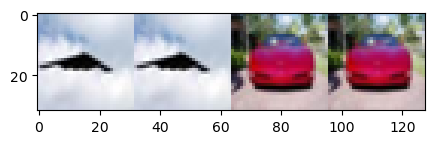

In [25]:
X_batch, y_batch = get_batch(X_train, y_train, 4)
plt.imshow(make_random_grid(X_batch, y_batch));

In [26]:
# predictions
print(' '.join('%13s' % classes[y_pred[j]] for j in range(4)))

        plane         plane         plane           car


In [27]:
print("model accuracy: ", logistic.calc_accuracy(X_train, y_train))

model accuracy:  40.739999999999995


## Binary cross-entropy

Your code for this section will written in the next cell. 

Complete the function `binary_cross_entropy` using vectorized code. This function takes as input the weights, data, labels and outputs the calculated loss as a single number and the gradients with respect to W. (**20 points**)

In [56]:

def log_logistic(v):
    out = np.zeros(v.shape)
    n_samples = v.shape[0]
    for i in range(n_samples):
        x = v[i]
        out[i] = -math.log(1. + math.exp(-x)) if x > 0 else x - math.log(1. + math.exp(x))
    return out

def binary_cross_entropy(W, X, y):
    """
    Structured BCE loss function. Implement this function using vectorized code.
    Inputs:
    - W: array of weights
    - X: array of data
    - y: 1-dimensional array of length N with binary labels (0,1). 
    Returns:
    a tuple of:
    - loss as single float
    - gradient with respect to weights W; an array of same shape as W
    """
    loss = 0.0
    dW = np.zeros(W.shape) # initialize the gradient as zero
    #############################################################################
    # Implement the function and store result in loss and the gradint in dW     #
    # Note: in class you defined BCE that takes values from the range (-1,1).   #
    # and the sigmoid function generally outputs values in the range (0,1).     #
    # Make the proper adjustments for your code to work.                        #
    #############################################################################
    n_samples, n_features = X.shape
    classes_count = W.shape[1]  # col count = classes count
    
    w = W.flatten()
    z = np.dot(X, w)
    yz = y * z

    loss = -np.sum(log_logistic(yz))
    
    z = sigmoid(yz)
    z0 = (z-1) * y
    grad = np.empty_like(w)
    grad[:n_features] = X.T.dot(z0)
    dW = grad.reshape(n_features, classes_count)
    
    dW /= n_samples
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################
    return loss, dW

In [57]:
W = np.random.randn(3073, 1) * 0.0001

In [58]:
%%time
loss_naive, grad_naive = binary_cross_entropy(W, X_val, y_val)
print ('loss: %f' % (loss_naive, ))

loss: 704.780201
CPU times: user 24.4 ms, sys: 2.22 ms, total: 26.6 ms
Wall time: 3.36 ms


You are provided with a gradient test in the next cells:

In [59]:
def grad_check(f, x, analytic_grad, num_checks=10, h=1e-5):
    for i in range(num_checks):
        ix = tuple([randrange(m) for m in x.shape])

        oldval = x[ix]
        x[ix] = oldval + h # increment by h
        fxph = f(x) # evaluate f(x + h)
        x[ix] = oldval - h # increment by h
        fxmh = f(x) # evaluate f(x - h)
        x[ix] = oldval # reset

        grad_numerical = (fxph - fxmh) / (2 * h)
        grad_analytic = analytic_grad[ix]
        rel_error = abs(grad_numerical - grad_analytic) / (abs(grad_numerical) + abs(grad_analytic))
        print ('numerical: %f analytic: %f, relative error: %e' % (grad_numerical, grad_analytic, rel_error))

In [60]:
loss, grad = binary_cross_entropy(W, X_val, y_val)
f = lambda w: binary_cross_entropy(w, X_val, y_val)[0]
grad_numerical = grad_check(f, W, grad)

numerical: 7417.094909 analytic: 7.417095, relative error: 9.980020e-01
numerical: 2453.416362 analytic: 2.453416, relative error: 9.980020e-01
numerical: 3409.063479 analytic: 3.409064, relative error: 9.980020e-01
numerical: 1542.616848 analytic: 1.542617, relative error: 9.980020e-01
numerical: 1858.405756 analytic: 1.858406, relative error: 9.980020e-01
numerical: 545.248422 analytic: 0.545248, relative error: 9.980020e-01
numerical: -641.965591 analytic: -0.641966, relative error: 9.980020e-01
numerical: 6008.841578 analytic: 6.008842, relative error: 9.980020e-01
numerical: 2036.870125 analytic: 2.036870, relative error: 9.980020e-01
numerical: 2873.920021 analytic: 2.873920, relative error: 9.980020e-01


If implemented correctly, the training procedure you already implemented should work.

In [61]:
%%time
logistic = LogisticRegression(X_train, y_train)
loss_history = logistic.train(X_train, y_train, 
                         learning_rate=1e-7,
                         num_iters=1500,
                         verbose=True)

iteration 0 / 1500: loss 134.925855
iteration 100 / 1500: loss 124.214169
iteration 200 / 1500: loss 118.973405
iteration 300 / 1500: loss 115.436624
iteration 400 / 1500: loss 100.890253
iteration 500 / 1500: loss 112.514910
iteration 600 / 1500: loss 116.022312
iteration 700 / 1500: loss 113.440896
iteration 800 / 1500: loss 106.471096
iteration 900 / 1500: loss 104.380756
iteration 1000 / 1500: loss 103.167874
iteration 1100 / 1500: loss 119.926988
iteration 1200 / 1500: loss 97.588119
iteration 1300 / 1500: loss 101.708288
iteration 1400 / 1500: loss 100.034638
CPU times: user 16.9 s, sys: 926 ms, total: 17.8 s
Wall time: 2.27 s


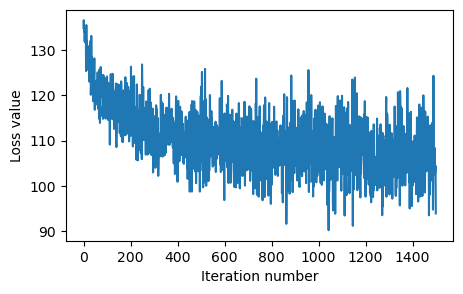

In [62]:
plt.plot(loss_history)
plt.xlabel('Iteration number')
plt.ylabel('Loss value')
plt.show()

In [63]:
print("Training accuracy: ", logistic.calc_accuracy(X_train, y_train))
print("Testing accuracy: ", logistic.calc_accuracy(X_test, y_test))

Training accuracy:  78.95
Testing accuracy:  82.1


## Hyperparameter optimization

Your model should have improved from 50% accuracy to ~75% accuracy in a matter of seconds. Now, use the validation set to tune hyperparameters by training different models (using the training dataset) and evaluating the performance using the validation dataset. Save the results in a dictionary mapping tuples of the form `(learning_rate, batch_size)` to tuples of the form `(training_accuracy, validation_accuracy)`. Finally, you should evaluate the best model on the testing dataset. 

Use a small value for the number of iterations as you develop your code. Once you are confident that everything works, run it again for more iterations. **(5 points)**

In [64]:
# You are encouraged to experiment with additional values
learning_rates = [1e-7, 5e-6]
batch_sizes = [1, 100, 200, 500]

results = {}
best_val = -1   # The highest validation accuracy that we have seen so far.
best_logistic = None # The LogisticRegression object that achieved the highest validation rate.

################################################################################
#                            START OF YOUR CODE                                #
################################################################################
SAMPLES = X_train.shape[0]
EPOCHS = 10
iterations = lambda batch_size: int(EPOCHS * SAMPLES / batch_size)

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        iters = iterations(batch_size)
        model = LogisticRegression(X_train, y_train)
        _ = model.train(
            X_train, 
            y_train, 
            learning_rate, 
            iters,
            batch_size,
            verbose=True
        )
        
        train_set_accuracy = model.calc_accuracy(X_train, y_train)
        val_set_accuracy = model.calc_accuracy(X_val, y_val)
        
        if val_set_accuracy > best_val:
            best_val = val_set_accuracy
            best_logistic = model
        results[(learning_rate, batch_size)] = (train_set_accuracy, val_set_accuracy)

################################################################################
#                              END OF YOUR CODE                                #
################################################################################
    
# Print out results.
for lr, batch_size in sorted(results):
    train_accuracy, val_accuracy = results[(lr, batch_size)]
    print ('lr %e batch_size %e train accuracy: %f val accuracy: %f' % (
                lr, batch_size, train_accuracy, val_accuracy))
    
print ('best validation accuracy achieved during cross-validation: %f' % best_val)

test_accuracy = best_logistic.calc_accuracy(X_test, y_test)
print ('Binary logistic regression on raw pixels final test set accuracy: %f' % test_accuracy)

iteration 0 / 100000: loss 0.693147
iteration 100 / 100000: loss 0.400550
iteration 200 / 100000: loss 0.693147
iteration 300 / 100000: loss 0.068799
iteration 400 / 100000: loss 0.088461
iteration 500 / 100000: loss 0.084150
iteration 600 / 100000: loss 3.002788
iteration 700 / 100000: loss 0.432887
iteration 800 / 100000: loss 0.072131
iteration 900 / 100000: loss 0.693147
iteration 1000 / 100000: loss 0.103065
iteration 1100 / 100000: loss 0.089749
iteration 1200 / 100000: loss 0.301148
iteration 1300 / 100000: loss 0.106379
iteration 1400 / 100000: loss 0.375073
iteration 1500 / 100000: loss 0.027881
iteration 1600 / 100000: loss 0.037800
iteration 1700 / 100000: loss 0.693147
iteration 1800 / 100000: loss 0.693147
iteration 1900 / 100000: loss 0.693147
iteration 2000 / 100000: loss 0.693147
iteration 2100 / 100000: loss 1.245984
iteration 2200 / 100000: loss 0.185350
iteration 2300 / 100000: loss 0.023843
iteration 2400 / 100000: loss 0.693147
iteration 2500 / 100000: loss 0.16351

iteration 22500 / 100000: loss 0.693147
iteration 22600 / 100000: loss 0.657442
iteration 22700 / 100000: loss 0.693147
iteration 22800 / 100000: loss 0.001703
iteration 22900 / 100000: loss 1.470537
iteration 23000 / 100000: loss 0.026805
iteration 23100 / 100000: loss 0.693147
iteration 23200 / 100000: loss 0.042116
iteration 23300 / 100000: loss 0.693147
iteration 23400 / 100000: loss 0.693147
iteration 23500 / 100000: loss 0.693147
iteration 23600 / 100000: loss 0.693147
iteration 23700 / 100000: loss 0.050892
iteration 23800 / 100000: loss 0.016521
iteration 23900 / 100000: loss 0.029286
iteration 24000 / 100000: loss 0.693147
iteration 24100 / 100000: loss 0.693147
iteration 24200 / 100000: loss 0.693147
iteration 24300 / 100000: loss 0.693147
iteration 24400 / 100000: loss 0.693147
iteration 24500 / 100000: loss 0.693147
iteration 24600 / 100000: loss 0.693147
iteration 24700 / 100000: loss 0.693147
iteration 24800 / 100000: loss 0.028339
iteration 24900 / 100000: loss 0.693147


iteration 43600 / 100000: loss 0.693147
iteration 43700 / 100000: loss 0.284185
iteration 43800 / 100000: loss 0.693147
iteration 43900 / 100000: loss 0.001651
iteration 44000 / 100000: loss 0.693147
iteration 44100 / 100000: loss 0.102364
iteration 44200 / 100000: loss 1.239871
iteration 44300 / 100000: loss 0.119233
iteration 44400 / 100000: loss 0.530924
iteration 44500 / 100000: loss 0.337862
iteration 44600 / 100000: loss 0.693147
iteration 44700 / 100000: loss 0.693147
iteration 44800 / 100000: loss 0.693147
iteration 44900 / 100000: loss 0.693147
iteration 45000 / 100000: loss 0.461874
iteration 45100 / 100000: loss 0.155253
iteration 45200 / 100000: loss 0.693147
iteration 45300 / 100000: loss 0.071088
iteration 45400 / 100000: loss 0.022506
iteration 45500 / 100000: loss 0.429450
iteration 45600 / 100000: loss 0.045887
iteration 45700 / 100000: loss 0.145534
iteration 45800 / 100000: loss 0.076342
iteration 45900 / 100000: loss 0.693147
iteration 46000 / 100000: loss 0.693147


iteration 65300 / 100000: loss 0.011177
iteration 65400 / 100000: loss 0.693147
iteration 65500 / 100000: loss 0.693147
iteration 65600 / 100000: loss 0.693147
iteration 65700 / 100000: loss 0.693147
iteration 65800 / 100000: loss 0.693147
iteration 65900 / 100000: loss 0.004805
iteration 66000 / 100000: loss 0.693147
iteration 66100 / 100000: loss 0.647997
iteration 66200 / 100000: loss 0.693147
iteration 66300 / 100000: loss 0.693147
iteration 66400 / 100000: loss 0.311201
iteration 66500 / 100000: loss 0.693147
iteration 66600 / 100000: loss 1.843380
iteration 66700 / 100000: loss 0.405627
iteration 66800 / 100000: loss 0.693147
iteration 66900 / 100000: loss 0.693147
iteration 67000 / 100000: loss 0.015343
iteration 67100 / 100000: loss 0.002103
iteration 67200 / 100000: loss 0.693147
iteration 67300 / 100000: loss 0.693147
iteration 67400 / 100000: loss 1.227226
iteration 67500 / 100000: loss 0.618426
iteration 67600 / 100000: loss 0.139676
iteration 67700 / 100000: loss 0.693147


iteration 87300 / 100000: loss 0.002238
iteration 87400 / 100000: loss 0.003426
iteration 87500 / 100000: loss 0.188843
iteration 87600 / 100000: loss 0.693147
iteration 87700 / 100000: loss 0.254620
iteration 87800 / 100000: loss 0.693147
iteration 87900 / 100000: loss 0.693147
iteration 88000 / 100000: loss 0.693147
iteration 88100 / 100000: loss 0.693147
iteration 88200 / 100000: loss 0.693147
iteration 88300 / 100000: loss 0.071374
iteration 88400 / 100000: loss 0.693147
iteration 88500 / 100000: loss 0.844605
iteration 88600 / 100000: loss 0.001300
iteration 88700 / 100000: loss 0.693147
iteration 88800 / 100000: loss 0.693147
iteration 88900 / 100000: loss 0.693147
iteration 89000 / 100000: loss 0.045071
iteration 89100 / 100000: loss 0.002799
iteration 89200 / 100000: loss 3.132242
iteration 89300 / 100000: loss 0.003380
iteration 89400 / 100000: loss 0.693147
iteration 89500 / 100000: loss 0.299346
iteration 89600 / 100000: loss 0.693147
iteration 89700 / 100000: loss 0.693147


iteration 7800 / 100000: loss 0.693147
iteration 7900 / 100000: loss 0.693147
iteration 8000 / 100000: loss -0.000000
iteration 8100 / 100000: loss -0.000000
iteration 8200 / 100000: loss -0.000000
iteration 8300 / 100000: loss 0.693147
iteration 8400 / 100000: loss -0.000000
iteration 8500 / 100000: loss 26.366505
iteration 8600 / 100000: loss 0.000000
iteration 8700 / 100000: loss 0.001659
iteration 8800 / 100000: loss -0.000000
iteration 8900 / 100000: loss 0.693147
iteration 9000 / 100000: loss 0.693147
iteration 9100 / 100000: loss 0.693147
iteration 9200 / 100000: loss 0.693147
iteration 9300 / 100000: loss 0.693147
iteration 9400 / 100000: loss 0.693147
iteration 9500 / 100000: loss 33.987491
iteration 9600 / 100000: loss -0.000000
iteration 9700 / 100000: loss 51.793820
iteration 9800 / 100000: loss 0.693147
iteration 9900 / 100000: loss 0.693147
iteration 10000 / 100000: loss 0.000000
iteration 10100 / 100000: loss 0.000000
iteration 10200 / 100000: loss 0.693147
iteration 103

iteration 30200 / 100000: loss 0.693147
iteration 30300 / 100000: loss 23.787369
iteration 30400 / 100000: loss 0.693147
iteration 30500 / 100000: loss 0.693147
iteration 30600 / 100000: loss -0.000000
iteration 30700 / 100000: loss 0.693147
iteration 30800 / 100000: loss -0.000000
iteration 30900 / 100000: loss 25.507241
iteration 31000 / 100000: loss 15.839355
iteration 31100 / 100000: loss 0.000000
iteration 31200 / 100000: loss 0.693147
iteration 31300 / 100000: loss 0.693147
iteration 31400 / 100000: loss -0.000000
iteration 31500 / 100000: loss 0.693147
iteration 31600 / 100000: loss 0.693147
iteration 31700 / 100000: loss 0.693147
iteration 31800 / 100000: loss 0.693147
iteration 31900 / 100000: loss 0.693147
iteration 32000 / 100000: loss -0.000000
iteration 32100 / 100000: loss 0.693147
iteration 32200 / 100000: loss -0.000000
iteration 32300 / 100000: loss -0.000000
iteration 32400 / 100000: loss 0.000001
iteration 32500 / 100000: loss 13.366402
iteration 32600 / 100000: loss

iteration 51700 / 100000: loss 44.485132
iteration 51800 / 100000: loss -0.000000
iteration 51900 / 100000: loss 0.693147
iteration 52000 / 100000: loss -0.000000
iteration 52100 / 100000: loss 0.000000
iteration 52200 / 100000: loss 0.693147
iteration 52300 / 100000: loss -0.000000
iteration 52400 / 100000: loss -0.000000
iteration 52500 / 100000: loss 0.693147
iteration 52600 / 100000: loss 0.693147
iteration 52700 / 100000: loss -0.000000
iteration 52800 / 100000: loss 0.693147
iteration 52900 / 100000: loss 0.000000
iteration 53000 / 100000: loss 0.693147
iteration 53100 / 100000: loss -0.000000
iteration 53200 / 100000: loss -0.000000
iteration 53300 / 100000: loss 0.000035
iteration 53400 / 100000: loss 0.693147
iteration 53500 / 100000: loss -0.000000
iteration 53600 / 100000: loss -0.000000
iteration 53700 / 100000: loss -0.000000
iteration 53800 / 100000: loss 0.693147
iteration 53900 / 100000: loss 0.693147
iteration 54000 / 100000: loss 0.693147
iteration 54100 / 100000: los

iteration 73300 / 100000: loss 0.693147
iteration 73400 / 100000: loss -0.000000
iteration 73500 / 100000: loss 0.693147
iteration 73600 / 100000: loss -0.000000
iteration 73700 / 100000: loss 0.693147
iteration 73800 / 100000: loss -0.000000
iteration 73900 / 100000: loss 0.693147
iteration 74000 / 100000: loss 0.693147
iteration 74100 / 100000: loss 0.693147
iteration 74200 / 100000: loss 0.693147
iteration 74300 / 100000: loss 76.098935
iteration 74400 / 100000: loss -0.000000
iteration 74500 / 100000: loss 0.693147
iteration 74600 / 100000: loss 0.001831
iteration 74700 / 100000: loss 0.693147
iteration 74800 / 100000: loss -0.000000
iteration 74900 / 100000: loss -0.000000
iteration 75000 / 100000: loss -0.000000
iteration 75100 / 100000: loss 0.693147
iteration 75200 / 100000: loss -0.000000
iteration 75300 / 100000: loss 0.693147
iteration 75400 / 100000: loss 0.693147
iteration 75500 / 100000: loss 0.693147
iteration 75600 / 100000: loss -0.000000
iteration 75700 / 100000: loss

iteration 95100 / 100000: loss 0.693147
iteration 95200 / 100000: loss 0.693147
iteration 95300 / 100000: loss -0.000000
iteration 95400 / 100000: loss 0.693147
iteration 95500 / 100000: loss -0.000000
iteration 95600 / 100000: loss -0.000000
iteration 95700 / 100000: loss 0.693147
iteration 95800 / 100000: loss 0.000000
iteration 95900 / 100000: loss 0.693147
iteration 96000 / 100000: loss 41.913574
iteration 96100 / 100000: loss 0.693147
iteration 96200 / 100000: loss 0.693147
iteration 96300 / 100000: loss -0.000000
iteration 96400 / 100000: loss 0.693147
iteration 96500 / 100000: loss -0.000000
iteration 96600 / 100000: loss 0.693147
iteration 96700 / 100000: loss 0.693147
iteration 96800 / 100000: loss 0.693147
iteration 96900 / 100000: loss 0.693147
iteration 97000 / 100000: loss -0.000000
iteration 97100 / 100000: loss 0.693147
iteration 97200 / 100000: loss -0.000000
iteration 97300 / 100000: loss 16.499933
iteration 97400 / 100000: loss 0.693147
iteration 97500 / 100000: loss 

# The End!